# Portland, Oregon Python automatic variable generation file for Circular Buffer

# Import the library

# Follow the below link to install Geopanda


#https://medium.com/analytics-vidhya/fastest-way-to-install-geopandas-in-jupyter-notebook-on-windows-8f734e11fa2b

In [1]:
import time
start = time.time()
# First Run all these in command prompt cell to use geopanda
#conda create -n geo_env
#conda activate geo_env
#conda config --env --add channels conda-forge
#conda config --env --set channel_priority strict
#conda install python=3 geopandas

In [2]:
#conda activate geo_env


In [3]:
#python -m ipykernel install --user --name geo_env

In [4]:
import geopandas as gpd

In [5]:
import pandas as pd
from functools import reduce

In [6]:
import sys
'geopandas' in sys.modules

True

In [7]:
#!pip3 install matplotlib
import matplotlib.pyplot as plt

In [8]:
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import io
import pandas as pd
import networkx as nx
import osmnx as ox

# All inputs

# Inputr your Euclidean Buffer size or your GIS Customize buffer file Here

In [9]:
#buffer size in meter
size=1207.008 #in m, this input is also required for area conversation,1/10 mile==160.934m,1/4mile=402.336m, 0.5 mile=804.672, 3/4mile=1207.008m, 1 mile=1609.34,1.5 mile=2414.02, 2 mile=3218.69

In [10]:
# Import the non-fill buffer shape file
nf=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/all-aadbt-final-all.csv")
nf=nf[nf["region"]=="Portland"]
nf=nf[nf["year"]==2019]
nf.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment
517,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN
518,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN
519,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN
520,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN
521,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN


In [11]:
nf.shape

(88, 13)

In [12]:
c1=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/sites_all_study_area.csv")
c1=c1[c1["region"]=="Portland"]
c1=c1[c1["in_2019"]==1]
c1=c1[['site_id','osm_id_sensor']]
c1.head()

,site_id,osm_id_sensor
0,P001POR,681301893.0
1,P002POR,689032191.0
2,P003POR,322079535.0
3,P004POR,348027806.0
4,P005POR,126306263.0


In [13]:
# merge by site_id
nf1=pd.merge(nf,c1, right_on='site_id', left_on='site_id',how='inner')
nf1.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0


In [14]:
nf1.shape

(88, 14)

In [15]:
emerging_data=nf1.loc[:,['osm_id_sensor','site_id','sensor_type','AADBT','stv_adb','stv_c_adb','stl_raw']]
emerging_data.columns=['osm_id','site_id','sensor_type','AADBT','stv_adb','stv_c_adb','stl_raw']
emerging_data.head(3)

,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw
0,681301893.0,P001POR,permanent,1775.363690,109.219178,80.945205,9915.0
1,689032191.0,P002POR,permanent,1537.211111,111.027397,74.904110,6663.0
2,322079535.0,P003POR,permanent,1346.261310,98.109589,59.917808,5466.0


# Input the Strava Annual Network shape file here

In [16]:
strava=gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/strava-annual-portland-osm-2019.shp")
print(strava.crs)
# Define the current EPSG
strava = strava.set_crs("EPSG:2913")
# Let's take a copy of our layer
strava_proj = strava.copy()

# Reproject the geometries by replacing the values with projected ones
strava_proj = strava_proj.to_crs(epsg=2838)

epsg:2913


# Input Bike share data here

In [17]:
bs1=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_01.csv")
bs2=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_02.csv")
bs3=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_03.csv")
bs4=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_04.csv")
bs5=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_05.csv")
bs6=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_06.csv")
bs7=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_07.csv")
bs8=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_08.csv")
bs9=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_09.csv")
bs10=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_10.csv")
bs11=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_11.csv")
bs12=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_12.csv")
bs_all=pd.concat([bs1,bs2,bs3,bs4,bs5,bs6,bs7,bs8,bs9,bs10,bs11,bs12],axis=0,ignore_index=True)
bs_all.head(5)

,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True


# Input OSM file here

In [18]:
# Input OSM land use shape file here
luse = gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/landuse.shp")
# Define the current EPSG (normall for OSM this 3D EPSG code does not change)
lusec = luse.set_crs("EPSG:4326")


# Input OSM Natural shape file here
nature=gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/natural.shp")
# Define the current EPSG
nature = nature.set_crs("EPSG:4326")

# Input OSM Point shape file here
pts=gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/points.shp")
# Define the current EPSG
pts = pts.set_crs("EPSG:4326")

# Input the place of your study Area to calculate the intersection Density (city or county, Country)
place="Oregon,USA"

# Input OSM road shape file here
road = gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/roads.shp")
# Define the current EPSG
road = road.set_crs("EPSG:4326")

# Import OSM Building shape file to get CBD (City Hall)

In [19]:
# Input OSM road shape file here
building = gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/buildings.shp")
print(building.crs)
# Define the current EPSG
building1 = building.set_crs("EPSG:4326")

epsg:4326


# Input NHGIS Block Group shape and CSV file here

In [20]:
# Input the block group shape file of your study area here
bg=gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/OR_blck_grp_2017.shp")

# Input Race csv file here
race=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/race.csv")

# Input Age by Sex csv file here
gender=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/age by sex.csv")

# Input education csv file here
edu=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/education.csv")

# Import school enrollmemt 
scll=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/school Enrollment.csv")
# Input Median age csv file here
age=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/median_age.csv")

# Input Median House Hold income csv file here
income=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/median_hh_income.csv")

# Input House hold Type csv file here
hhdensity=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/household_type.csv")

# Input Population csv file here
pdensity=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/population.csv")

# Input Employment csv file here
edensity=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/employment.csv")

# Means of Transportation data
bike_commute=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/Bike_commute_2019_blck_grp.csv")

# Insert LEHD Job Data, WAC file

In [21]:
# Input job csv file here
Number_job=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/or_wac_S000_JT00_2018.csv")
Number_job.head(4)
# Input the block group shape file of your study area here
bg_lehd=gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/tabblock2010_41_pophu.shp")


# Please see the slope section for inputs of raster image for slope calculation

# Weather data needs to input three things
1. Chrome driver link (no need for kaggle as it is already set)
2. Dates you want to extract the data (format: yyyy-m, for example, 2019-4)
3. page of weather underground from where you want to extract the data

Please change the dates and page link only for other sttudy area at weather section which you will find before the Random forest variable selections.

WGS84 Latitude/Longitude: "EPSG:4326"

UTM Zones (North): "EPSG:32633"

UTM Zones (South): "EPSG:32733

# Input Study Area Boundary Shape file here

In [22]:
BA_all=gpd.read_file('http://web.pdx.edu/~jbroach/bike-data-fusion/study_area_boundaries.geojson')


In [23]:
BA_all

,fid,region,comment,epsg_local,geometry
0,1,Boulder,None,2772,"MULTIPOLYGON (((-105.64858 40.06198, -105.6480..."
1,2,Eugene,None,2839,"MULTIPOLYGON (((-123.73473 43.94406, -123.7392..."
2,3,Bend,None,2839,"MULTIPOLYGON (((-121.40550 44.39315, -121.4025..."
3,4,Charlotte,None,3358,"MULTIPOLYGON (((-80.74046 35.37771, -80.73779 ..."
4,5,Dallas,None,2845,"MULTIPOLYGON (((-96.52941 32.54528, -96.52964 ..."
5,6,Portland,metro planning area,2838,"MULTIPOLYGON (((-123.13045 45.47864, -123.1307..."


<AxesSubplot:>

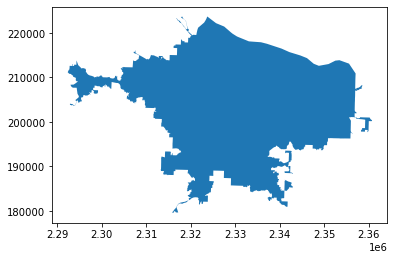

In [24]:
region = "Portland"
# select regional boundary and transform to local coords for buffering
local_poly = BA_all[BA_all['region'] == region]
local_srid = int(local_poly['epsg_local'])
local_poly = local_poly.to_crs(local_srid)
local_poly.plot()

<AxesSubplot:>

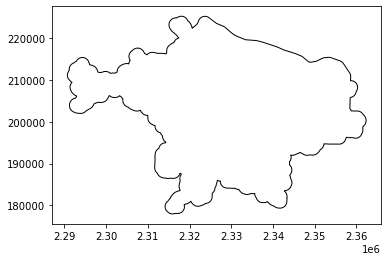

In [25]:
one_mile = 1609.34 # meters
pba = local_poly.buffer(one_mile)
pba.plot(color="none")

<AxesSubplot:>

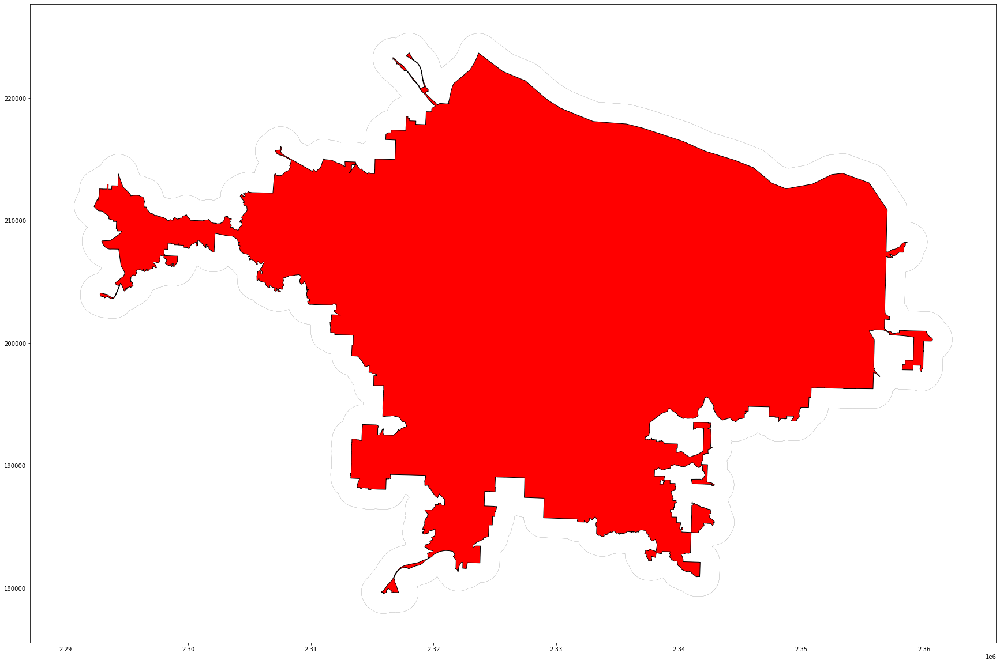

In [26]:
fig, ax = plt.subplots(figsize = (30,25)) 
local_poly.plot(ax=ax,color="red",edgecolor='k',linewidth = 1)
pba.plot(color="none",edgecolor='k',linewidth = 0.15,ax=ax) #Use your second dataframe

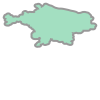

In [27]:
# convert to unprojected polygon for osmnx data pull
polygon = pba.to_crs(4326).iloc[0]
polygon

# Read the Eco and short term location file as gpd to get geometry

In [28]:
df = gpd.GeoDataFrame(
    nf1, geometry=gpd.points_from_xy(nf1.longitude, nf1.latitude))
df.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,POINT (-122.67284 45.51383)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,POINT (-122.67121 45.51319)
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,POINT (-122.67197 45.50134)
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,POINT (-122.66831 45.52783)
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,POINT (-122.67227 45.53287)


In [29]:
# set the co-ordinate system first
df = df.set_crs("EPSG:4211")

In [30]:
print(df.crs)

EPSG:4211


In [31]:
# Let's take a copy of our layer
gdf0_proj = df.copy()

# Reproject the geometries by replacing the values with projected ones
eco_proj = gdf0_proj.to_crs(epsg=2838)
eco_proj.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218)
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710)
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369)
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073)


In [32]:
# We can now plot our ``GeoDataFrame``.
#eco_proj.plot(eco_proj, color='red',figsize=(10,10))
#plt.show()

In [33]:
ecoshort0=eco_proj
#ecoshort0=pd.concat([eco_proj,short_proj],axis=0)
ecoshort0.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218)
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710)
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369)
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073)


In [34]:
#ecoshort0.reset_index(inplace=True)

In [35]:
#ecoshort0[ecoshort0.index.duplicated()]

# Filter the location by Extended Study area Boundary

In [36]:
# Clip the data using GeoPandas clip
ecoshort = gpd.clip(ecoshort0, pba)
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218)
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710)
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369)
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073)


In [37]:
count_station=ecoshort.copy()

In [38]:
ecoshort=ecoshort.drop_duplicates(subset='osm_id_sensor')
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218)
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710)
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369)
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073)


<AxesSubplot:>

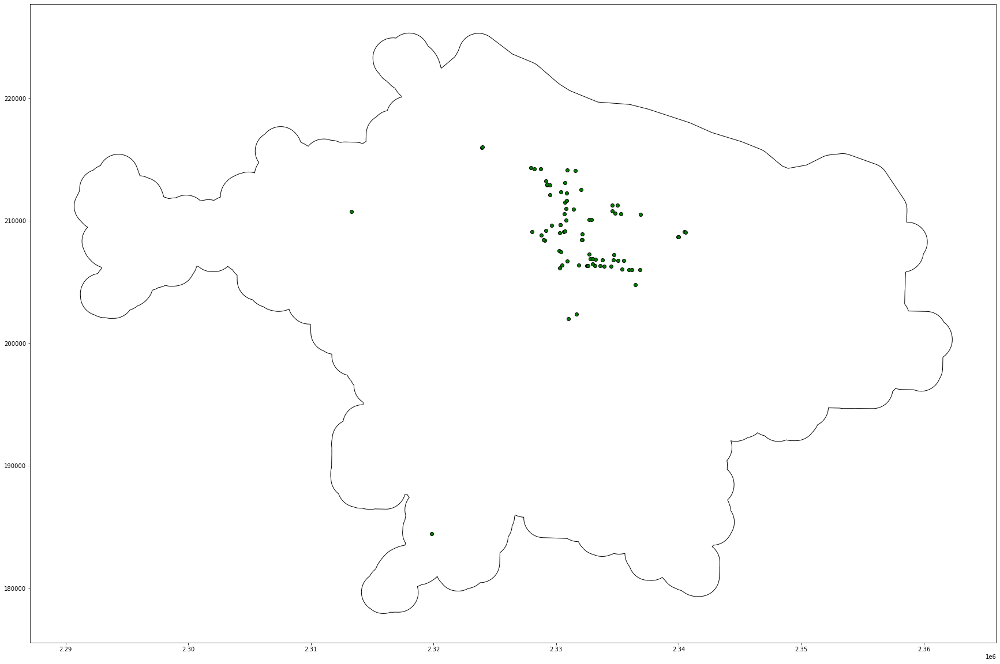

In [39]:
fig, ax = plt.subplots(figsize = (30,25)) 
ecoshort.plot(ax=ax,color="green",edgecolor='k',linewidth = 1)
pba.plot(color="none",edgecolor='k',linewidth = 1,ax=ax) #Use your second dataframe

# geopanda buffer function: https://geopandas.org/docs/user_guide/geometric_manipulations.html

In [40]:
# Buffer file
#gdf1=nf3


In [41]:
gdf1 = ecoshort.copy()
gdf1['geometry'] = gdf1['geometry'].buffer(size)
gdf1.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,"POLYGON ((2331458.910 207544.074, 2331453.098 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,"POLYGON ((2331584.299 207469.218, 2331578.487 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,"POLYGON ((2331489.549 206154.710, 2331483.737 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,"POLYGON ((2331854.400 209090.369, 2331848.588 ..."
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,"POLYGON ((2331560.316 209658.073, 2331554.503 ..."


In [42]:
#conda install -c conda-forge contextily #install in your geo_env using command prompt 

#https://geopandas.org/gallery/plotting_basemap_background.html

In [43]:
import contextily as ctx

In [44]:
print(gdf1.crs)

epsg:2838


In [45]:
# Insert City Specific EPSG here to convert 3D to 2D map,for exaple, state plane system EPSG =2838 for Portland
# set the co-ordinate system first
gdfm = gdf1.set_crs("EPSG:2838") # provided by PSU
gdfm = gdfm.to_crs(epsg=3857) # This EPSG just for ploting

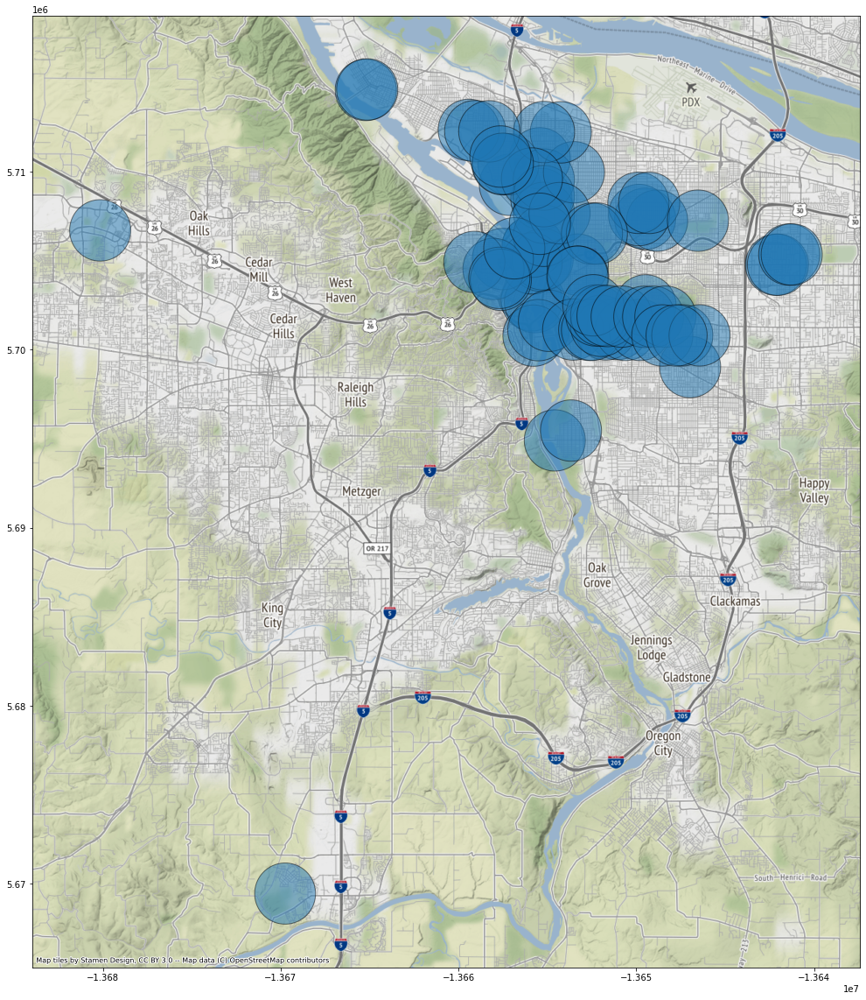

In [46]:
ax = gdfm.plot(figsize=(20, 20), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

# ploting code: http://darribas.org/gds15/content/labs/lab_03.html

# Calculate O, D and OD line

In [47]:
bs_all.head(5)

,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True


# BS Origin

In [48]:
# Origin
bso = gpd.GeoDataFrame(
    bs_all, geometry=gpd.points_from_xy(bs_all.StartLongitude, bs_all.StartLatitude))
bso=bso.loc[:,['RouteID','StartLatitude','StartLongitude','geometry']]
bso.head(5)

,RouteID,StartLatitude,StartLongitude,geometry
0,10551635,45.528637,-122.682019,POINT (-122.68202 45.52864)
1,10551641,45.516232,-122.636068,POINT (-122.63607 45.51623)
2,10551644,45.517939,-122.658686,POINT (-122.65869 45.51794)
3,10551674,45.528268,-122.694562,POINT (-122.69456 45.52827)
4,10551682,45.528268,-122.694562,POINT (-122.69456 45.52827)


In [49]:
# set the co-ordinate system first
bso1 = bso.set_crs("EPSG:4211")

# Reproject the geometries by replacing the values with projected ones
bso1_proj = bso1.to_crs(epsg=2838)
bso1_proj.head(5)

,RouteID,StartLatitude,StartLongitude,geometry
0,10551635,45.528637,-122.682019,POINT (2329579.385 209208.293)
1,10551641,45.516232,-122.636068,POINT (2333131.018 207734.286)
2,10551644,45.517939,-122.658686,POINT (2331369.563 207970.912)
3,10551674,45.528268,-122.694562,POINT (2328598.956 209193.912)
4,10551682,45.528268,-122.694562,POINT (2328598.956 209193.912)


In [50]:
# Clip the data using GeoPandas clip
bso1_clip = gpd.clip(bso1_proj, gdf1)
bso1_clip.head(5)

,RouteID,StartLatitude,StartLongitude,geometry
0,10551635,45.528637,-122.682019,POINT (2329579.385 209208.293)
1,10551641,45.516232,-122.636068,POINT (2333131.018 207734.286)
2,10551644,45.517939,-122.658686,POINT (2331369.563 207970.912)
3,10551674,45.528268,-122.694562,POINT (2328598.956 209193.912)
4,10551682,45.528268,-122.694562,POINT (2328598.956 209193.912)


In [51]:
 int_bso=gpd.overlay(gdf1, bso1_clip, how='intersection', make_valid=True, keep_geom_type=False)
 int_bso.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,RouteID,StartLatitude,StartLongitude,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,10551644,45.517939,-122.658686,POINT (2331369.563 207970.912)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,10551644,45.517939,-122.658686,POINT (2331369.563 207970.912)
2,S027POR,NE 16TH AVE S of GLISAN ST,short-term,2019,Portland,1.0,123.585377,10.561644,6.643836,1082.0,45.526428,-122.649553,NaN,66788465.0,10551644,45.517939,-122.658686,POINT (2331369.563 207970.912)
3,S092POR,SE ANKENY ST E of 16TH AVE,short-term,2019,Portland,1.0,1602.781411,58.301370,41.876712,2512.0,45.522181,-122.649359,NaN,738967188.0,10551644,45.517939,-122.658686,POINT (2331369.563 207970.912)
4,S099POR,SE ANKENY ST W of 16TH AVE,short-term,2019,Portland,1.0,1549.854673,57.301370,41.753425,2549.0,45.522182,-122.649749,NaN,644432836.0,10551644,45.517939,-122.658686,POINT (2331369.563 207970.912)


<AxesSubplot:>

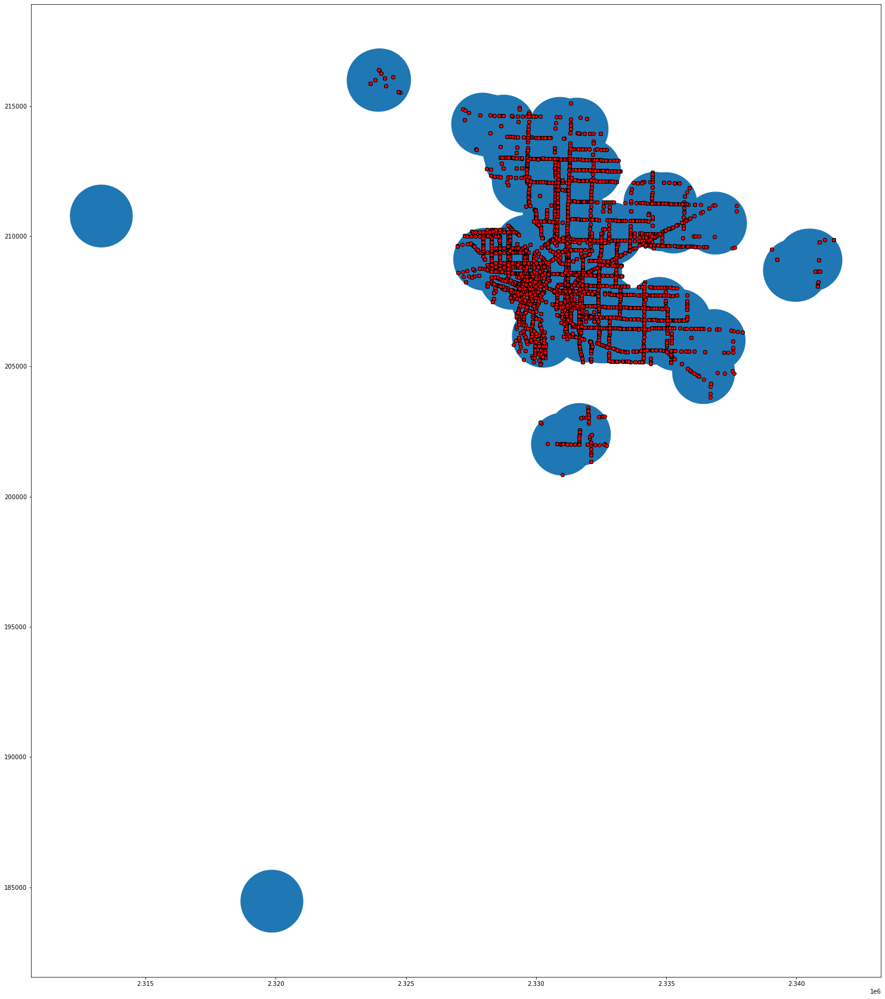

In [52]:
#int_bso.geometry.plot()
ax = gdf1.plot(figsize=(40, 30))
int_bso.geometry.plot(color="red",edgecolor='k',ax=ax)

In [53]:
output_origin=int_bso.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
output_origin.columns=["osm_id","Bike Share Origin"]
output_origin.head()

,osm_id,Bike Share Origin
0,5516558.0,2880
1,5522164.0,120996
2,5527017.0,488
3,5528173.0,90163
4,5529700.0,14


# BS destination

In [54]:
# Destination
bsd = gpd.GeoDataFrame(
    bs_all, geometry=gpd.points_from_xy(bs_all.EndLongitude, bs_all.EndLatitude))
bsd=bsd.loc[:,['RouteID','EndLatitude','EndLongitude','geometry']]
bsd.head(5)

,RouteID,EndLatitude,EndLongitude,geometry
0,10551635,45.526398,-122.689363,POINT (-122.68936 45.52640)
1,10551641,45.512196,-122.647606,POINT (-122.64761 45.51220)
2,10551644,45.516437,-122.636100,POINT (-122.63610 45.51644)
3,10551674,45.528268,-122.694562,POINT (-122.69456 45.52827)
4,10551682,45.532325,-122.682430,POINT (-122.68243 45.53233)


In [55]:
# set the co-ordinate system first
bsd1 = bsd.set_crs("EPSG:4211")
# Reproject the geometries by replacing the values with projected ones
bsd1_proj = bsd1.to_crs(epsg=2838)
bsd1_proj.head(5)

,RouteID,EndLatitude,EndLongitude,geometry
0,10551635,45.526398,-122.689363,POINT (2328999.273 208975.163)
1,10551641,45.512196,-122.647606,POINT (2332217.933 207309.838)
2,10551644,45.516437,-122.636100,POINT (2333129.100 207757.186)
3,10551674,45.528268,-122.694562,POINT (2328598.956 209193.912)
4,10551682,45.532325,-122.682430,POINT (2329558.412 209618.912)


In [56]:
# Clip the data using GeoPandas clip
bsd1_clip = gpd.clip(bsd1_proj, gdf1)
bsd1_clip.head(5)

,RouteID,EndLatitude,EndLongitude,geometry
0,10551635,45.526398,-122.689363,POINT (2328999.273 208975.163)
1,10551641,45.512196,-122.647606,POINT (2332217.933 207309.838)
2,10551644,45.516437,-122.636100,POINT (2333129.100 207757.186)
3,10551674,45.528268,-122.694562,POINT (2328598.956 209193.912)
4,10551682,45.532325,-122.682430,POINT (2329558.412 209618.912)


In [57]:
int_bsd=gpd.overlay(gdf1, bsd1_clip, how='intersection', make_valid=True, keep_geom_type=False)
int_bsd.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,RouteID,EndLatitude,EndLongitude,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,10551773,45.518663,-122.674205,POINT (2330159.734 208083.806)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,10551773,45.518663,-122.674205,POINT (2330159.734 208083.806)
2,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,10551773,45.518663,-122.674205,POINT (2330159.734 208083.806)
3,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,45.528350,-122.667300,NaN,156121087.0,10551773,45.518663,-122.674205,POINT (2330159.734 208083.806)
4,P008POR,STEEL BR upper sidewalk north side,permanent,2019,Portland,1.0,199.528105,11.630137,9.232877,12846.0,45.526900,-122.672890,NaN,348027809.0,10551773,45.518663,-122.674205,POINT (2330159.734 208083.806)


In [58]:
#int_bsd.geometry.plot()
#plotting    
#ax = gdf1.plot(figsize=(40, 30))
#int_bsd.geometry.plot(color="red",edgecolor='k',ax=ax)

In [59]:
output_destination=int_bsd.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
output_destination.columns=["osm_id","Bike Share Destination"]
output_destination.head()

,osm_id,Bike Share Destination
0,5516558.0,2398
1,5522164.0,117630
2,5527017.0,563
3,5528173.0,96811
4,5529700.0,15


# Bike Share OD line Crossing

In [60]:
#https://gis.stackexchange.com/questions/303615/creating-linestring-and-length-of-linestring-from-multiple-latlon-points-for-eac
import shapely.geometry as geom
bs_all_od=bs_all.copy()
bs_all_od['geometry'] = bs_all_od.apply(lambda x: geom.LineString([(x['StartLongitude'], x['StartLatitude']) , (x['EndLongitude'], x['EndLatitude'])]), axis = 1)
bs_all_od.head(5)

,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental,geometry
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False,"LINESTRING (-122.6820195 45.5286366, -122.6893..."
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False,"LINESTRING (-122.6360679 45.51623176, -122.647..."
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False,"LINESTRING (-122.6586863 45.517939, -122.63610..."
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False,"LINESTRING (-122.6945615 45.52826831, -122.694..."
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True,"LINESTRING (-122.6945615 45.52826831, -122.682..."


In [61]:
# exclude the points outside of Portland
bs_all_od1=bs_all_od[(bs_all_od.StartLongitude<=-122)&(bs_all_od.StartLongitude>=-124)]
bs_all_od1=bs_all_od1[(bs_all_od1.EndLongitude<=-122)&(bs_all_od1.EndLongitude>=-124)]
bs_all_od1=bs_all_od1[(bs_all_od1.StartLatitude>=45)&(bs_all_od1.StartLatitude<=46)]
bs_all_od1=bs_all_od1[(bs_all_od1.EndLatitude>=45)&(bs_all_od1.EndLatitude<=46)]
bs_all_od1.head(5)

,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental,geometry
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False,"LINESTRING (-122.6820195 45.5286366, -122.6893..."
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False,"LINESTRING (-122.6360679 45.51623176, -122.647..."
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False,"LINESTRING (-122.6586863 45.517939, -122.63610..."
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False,"LINESTRING (-122.6945615 45.52826831, -122.694..."
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True,"LINESTRING (-122.6945615 45.52826831, -122.682..."


In [62]:
#bs_all_od1.dtypes

In [63]:
#print(bs_all_od1.info())

In [64]:
bs_all_od2 = gpd.GeoDataFrame(bs_all_od1, geometry='geometry', crs={'init': 'epsg:4211'})
bs_all_od2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental,geometry
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False,"LINESTRING (-122.68202 45.52864, -122.68936 45..."
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False,"LINESTRING (-122.63607 45.51623, -122.64761 45..."
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False,"LINESTRING (-122.65869 45.51794, -122.63610 45..."
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False,"LINESTRING (-122.69456 45.52827, -122.69456 45..."
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True,"LINESTRING (-122.69456 45.52827, -122.68243 45..."


In [65]:
print(bs_all_od2.crs)

+init=epsg:4211 +type=crs


In [66]:
#print(bs_all_od2.info())

In [67]:
# set the co-ordinate system first
#bs_all_od2 = bs_all_od1.set_crs("EPSG:4211")

# Reproject the geometries by replacing the values with projected ones
bs_all_od2_proj = bs_all_od2.to_crs(epsg=2838)
bs_all_od2_proj.head(5)

,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental,geometry
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False,"LINESTRING (2329579.385 209208.293, 2328999.27..."
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False,"LINESTRING (2333131.018 207734.286, 2332217.93..."
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False,"LINESTRING (2331369.563 207970.912, 2333129.10..."
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False,"LINESTRING (2328598.956 209193.912, 2328598.95..."
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True,"LINESTRING (2328598.956 209193.912, 2329558.41..."


In [68]:
#fig, ax = plt.subplots(figsize = (30,25)) 
#gdf1.plot(ax=ax,color="red")
#bs_all_od2_proj.geometry.plot(color="green",edgecolor='k',linewidth = 2,ax=ax)

In [69]:
spj = gpd.sjoin( bs_all_od2_proj,gdf1, how="inner", op='intersects')

In [70]:
# Clip the data using GeoPandas clip
#odc1_clip = gpd.clip(bs_all_od2_proj,gdf1)
#odc1_clip.head(5)

In [71]:
#int_odl=gpd.overlay(gdf1, odc1_clip, how='intersection', make_valid=True, keep_geom_type=False)
#int_odl.head(5)

<AxesSubplot:>

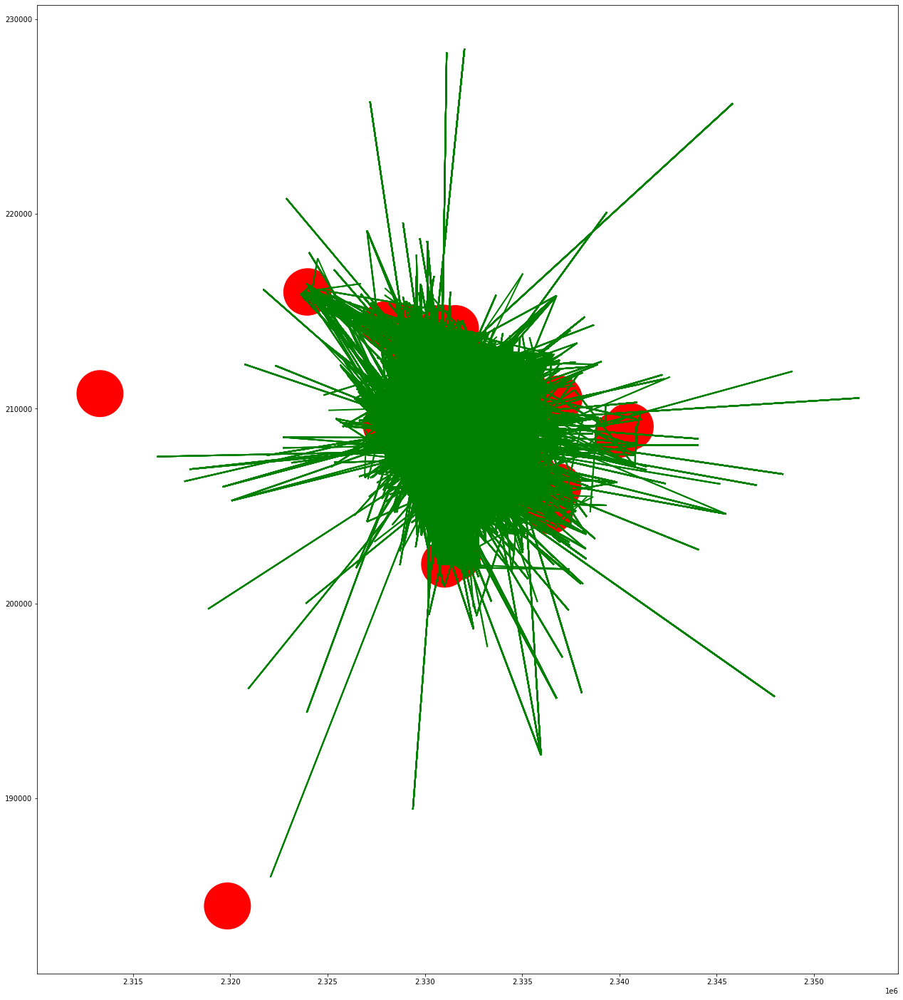

In [72]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
spj.geometry.plot(color="green",edgecolor='k',linewidth = 2,ax=ax)

In [73]:
output_odl=spj.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
output_odl.columns=["osm_id","Bike Share Crossing"]
output_odl.head()

,osm_id,Bike Share Crossing
0,5516558.0,4567
1,5522164.0,177973
2,5527017.0,1181
3,5528173.0,148756
4,5529700.0,39


# Now import land use shape file

In [74]:
# Import school
tags = {'landuse': 'grass'}
industrial = ox.geometries_from_polygon(polygon, tags)
#scl[['amenity', 'name', 'geometry']]

In [75]:
industrial

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,unique_id,osmid,element_type,barrier,geometry,access,natural,nodes,landuse,leisure,...,man_made,grass,mown,finely_mown,surface,noname,par,ref,ways,type
0,way/24000302,24000302,way,NaN,"POLYGON ((-122.85178 45.50665, -122.85060 45.5...",NaN,NaN,"[260233649, 260233650, 260233651, 260233653, 1...",grass,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,way/36796200,36796200,way,NaN,"POLYGON ((-122.66382 45.53147, -122.66361 45.5...",NaN,NaN,"[427762725, 6727128436, 427762727, 471792601, ...",grass,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,way/39412221,39412221,way,NaN,"POLYGON ((-122.66749 45.54364, -122.66679 45.5...",NaN,NaN,"[472202865, 472202866, 472202867, 472202868, 4...",grass,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,way/40775705,40775705,way,NaN,"POLYGON ((-122.66169 45.51286, -122.66145 45.5...",NaN,NaN,"[495578777, 495578779, 1783187393, 495578781, ...",grass,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,way/40941298,40941298,way,NaN,"POLYGON ((-122.66714 45.54572, -122.66714 45.5...",NaN,NaN,"[498671164, 498671167, 498671169, 498671170, 4...",grass,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2879,relation/12545116,12545116,relation,NaN,"MULTIPOLYGON (((-122.53244 45.54934, -122.5324...",NaN,NaN,"[[[8600051543, 8600039664, 8600051544, 8600051...",grass,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[926856801, 926856802, 926856803, 926856804, 9...",multipolygon
2880,relation/12569596,12569596,relation,NaN,"POLYGON ((-122.91814 45.55107, -122.91819 45.5...",NaN,NaN,"[[[4305285987, 8551625017, 8551625018, 8551625...",grass,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[921070280, 374224757, 374224755]",multipolygon
2881,relation/12848868,12848868,relation,NaN,"POLYGON ((-122.77716 45.50894, -122.77716 45.5...",NaN,NaN,"[[[8833622323, 8833622283, 8833622282, 8833622...",grass,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[954428429, 954428426]",multipolygon
2882,relation/12855840,12855840,relation,NaN,"POLYGON ((-122.85441 45.47778, -122.85447 45.4...",NaN,NaN,"[[[7867249741, 7867249742, 7867249743, 7867249...",grass,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[843392505, 955015509]",multipolygon


In [76]:
#luse = gpd.read_file("../input/osm-data/landuse.shp")
luse.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,23625119,Lady Island,industrial,"POLYGON ((-122.44367 45.57471, -122.43671 45.5..."
1,24000302,None,grass,"POLYGON ((-122.85178 45.50665, -122.85060 45.5..."
2,25822078,Intel Ronler Acres Campus,industrial,"POLYGON ((-122.92614 45.55060, -122.92613 45.5..."
3,25822108,None,industrial,"POLYGON ((-122.90597 45.54689, -122.90572 45.5..."
4,25822220,Dawson Creek,residential,"POLYGON ((-122.92635 45.53824, -122.92930 45.5..."


# Define and then Convert the co-ordinate system

In [77]:
# set the co-ordinate system first
#lusec = luse.set_crs("EPSG:4326")

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [78]:
# Let's take a copy of our layer
luse_proj = lusec.copy()

# Reproject the geometries by replacing the values with projected ones
luse_proj = luse_proj.to_crs(epsg=2838)
luse_proj.head(5)

,osm_id,name,type,geometry
0,23625119,Lady Island,industrial,"POLYGON ((2348315.732 213851.353, 2348848.428 ..."
1,24000302,None,grass,"POLYGON ((2316254.380 207136.871, 2316346.627 ..."
2,25822078,Intel Ronler Acres Campus,industrial,"POLYGON ((2310592.897 212191.562, 2310593.718 ..."
3,25822108,None,industrial,"POLYGON ((2312154.540 211731.603, 2312173.766 ..."
4,25822220,Dawson Creek,residential,"POLYGON ((2310534.979 210818.533, 2310304.726 ..."


# Visualize

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

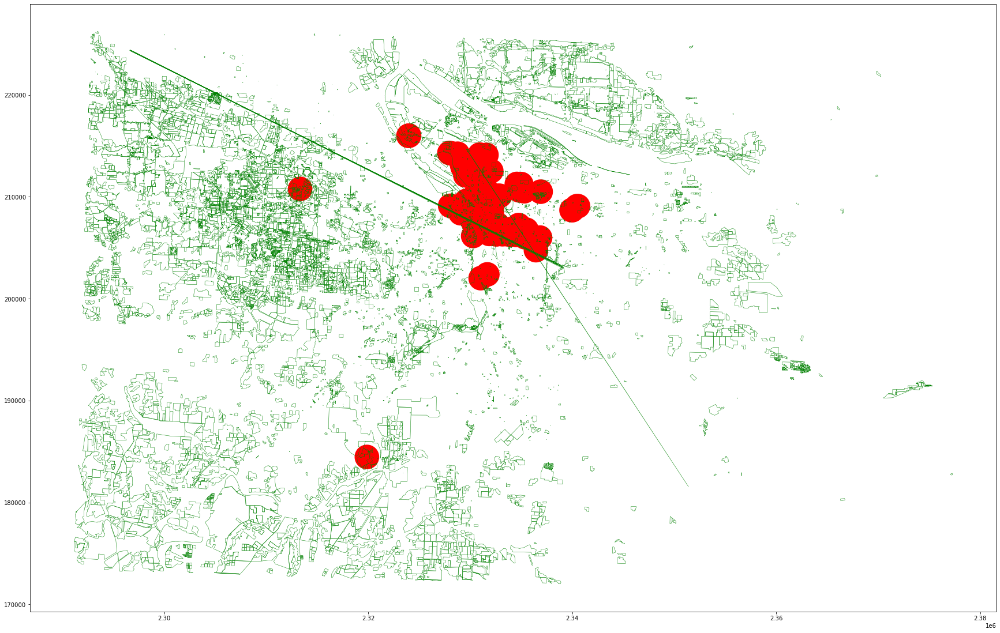

In [79]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
luse_proj.geometry.boundary.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

# Now clip landuse with buffer

In [80]:
import os 
from shapely.geometry import Point
from geopandas import GeoDataFrame, read_file
from geopandas.tools import overlay

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [81]:
#!pip install Rtree
#!pip install pygeos
#!pip install ujson
#!pip install wheel

In [82]:
#luse_proj.exterior.type

In [83]:
#gdf1.exterior.type

In [84]:
#luse_proj.exterior.is_valid

In [85]:
#gdf1.exterior.is_valid

In [86]:
# Avoid this error- TopologyException: Input geom 0 is invalid: Self-intersection at 2307899.6553931381 208383.49467431975. Do the followings
luse_proj["geometry2"]=luse_proj.geometry.buffer(0)
# Now drop geometry column and rename geometry 2 equal to geometry again
luse_proj=luse_proj.drop(["geometry"],axis=1)
luse_proj.rename({'geometry2': 'geometry'}, axis=1, inplace=True)
luse_proj.head(5)

,osm_id,name,type,geometry
0,23625119,Lady Island,industrial,"POLYGON ((2348315.732 213851.353, 2348392.904 ..."
1,24000302,None,grass,"POLYGON ((2316254.380 207136.871, 2316258.462 ..."
2,25822078,Intel Ronler Acres Campus,industrial,"POLYGON ((2310592.897 212191.562, 2310593.718 ..."
3,25822108,None,industrial,"POLYGON ((2312154.540 211731.603, 2312173.766 ..."
4,25822220,Dawson Creek,residential,"POLYGON ((2310534.979 210818.533, 2310304.726 ..."


In [87]:
# Clip the data using GeoPandas clip
buffer_clip = gpd.clip(luse_proj, gdf1)
buffer_clip.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
3,25822108,None,industrial,"POLYGON ((2312549.727 211643.939, 2312576.670 ..."
6,25907513,Cortland Village,residential,"POLYGON ((2312146.157 210718.659, 2312153.324 ..."
16,26228347,Evergreen Business Park,commercial,"POLYGON ((2312604.831 211685.373, 2312601.461 ..."
41,31732604,None,brownfield,"POLYGON ((2329505.142 207571.286, 2329560.725 ..."
42,31772435,The Streets of Tanasbourne,retail,"POLYGON ((2314234.091 210711.249, 2314238.563 ..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


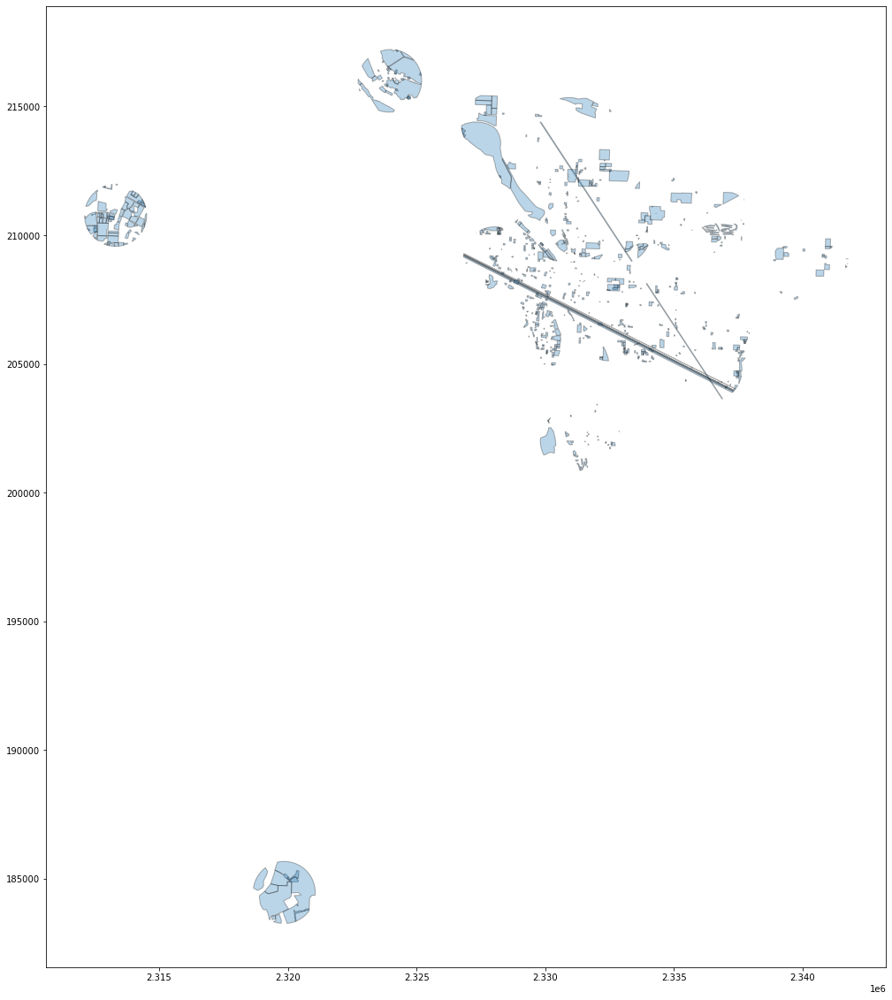

In [88]:
ax = buffer_clip.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

# Intersect the clipped area with Buffer ID

In [89]:
 intdata=gpd.overlay(gdf1, buffer_clip, how='intersection', make_valid=True, keep_geom_type=False)
 intdata.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,name,type,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,31732604,None,brownfield,"POLYGON ((2329560.725 207548.528, 2329553.724 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,31732604,None,brownfield,"POLYGON ((2329560.725 207548.528, 2329553.724 ..."
2,S162POR,SW 16TH AVE N of YAMHILL ST,short-term,2019,Portland,2.0,37.902936,1.205479,0.589041,482.0,45.521091,-122.688441,NaN,124817127.0,31732604,None,brownfield,"POLYGON ((2329560.725 207548.528, 2329553.724 ..."
3,S163POR,SW 17TH AVE S of MORRISON ST,short-term,2019,Portland,2.0,47.561166,3.958904,1.739726,1661.0,45.521764,-122.689202,NaN,5522164.0,31732604,None,brownfield,"POLYGON ((2329560.725 207548.528, 2329553.724 ..."
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,40775705,None,grass,"POLYGON ((2331151.226 207409.004, 2331159.990 ..."


In [90]:
intdata["Area"]=intdata["geometry"].area*10.76 # in ft2
intdata.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,name,type,geometry,Area
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,31732604,None,brownfield,"POLYGON ((2329560.725 207548.528, 2329553.724 ...",15925.234354
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,31732604,None,brownfield,"POLYGON ((2329560.725 207548.528, 2329553.724 ...",15925.234354
2,S162POR,SW 16TH AVE N of YAMHILL ST,short-term,2019,Portland,2.0,37.902936,1.205479,0.589041,482.0,45.521091,-122.688441,NaN,124817127.0,31732604,None,brownfield,"POLYGON ((2329560.725 207548.528, 2329553.724 ...",15925.234354
3,S163POR,SW 17TH AVE S of MORRISON ST,short-term,2019,Portland,2.0,47.561166,3.958904,1.739726,1661.0,45.521764,-122.689202,NaN,5522164.0,31732604,None,brownfield,"POLYGON ((2329560.725 207548.528, 2329553.724 ...",15925.234354
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,40775705,None,grass,"POLYGON ((2331151.226 207409.004, 2331159.990 ...",22607.759698


#https://geopandas.org/docs/user_guide/set_operations.html

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

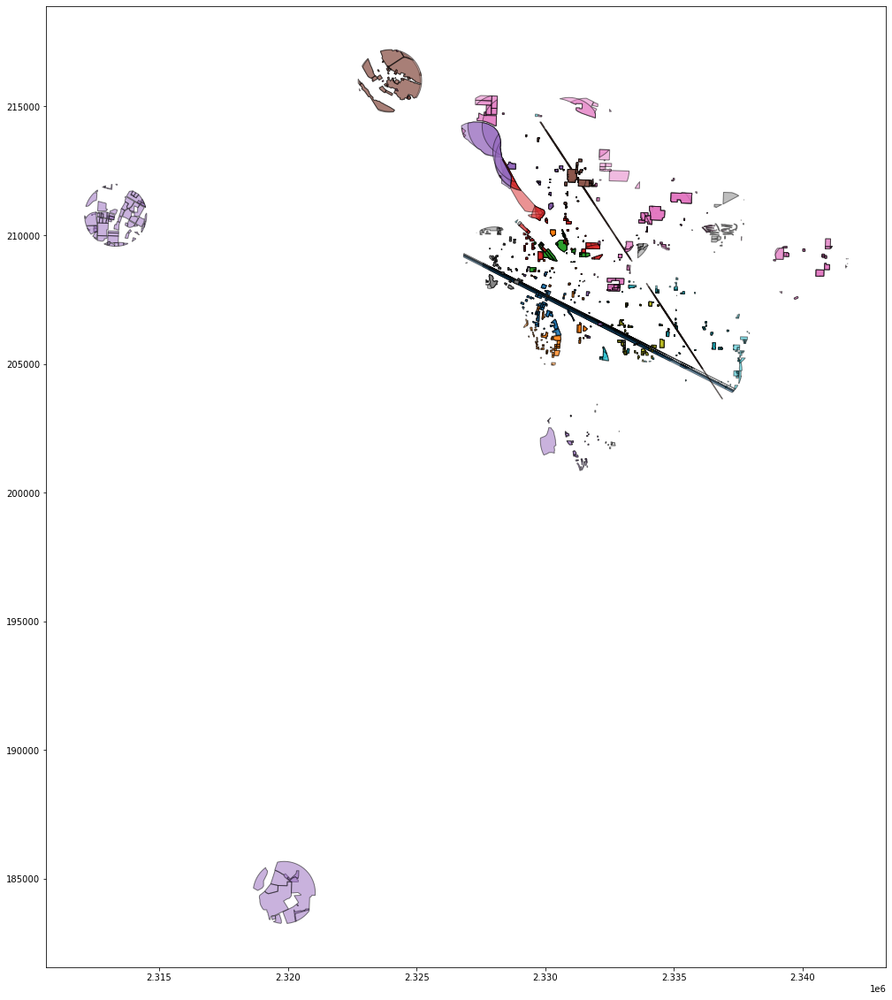

In [91]:
intdata.plot(figsize=(20, 20),alpha=0.5, edgecolor='k', cmap='tab10')

# Aggregate data by ID

#https://geopandas.org/docs/user_guide/aggregation_with_dissolve.html

In [92]:
output_landuse=intdata.groupby(by=['osm_id_sensor','type'])['Area'].sum().reset_index()
output_landuse.columns=['osm_id','type','Area']
output_landuse.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,type,Area
0,5516558.0,brownfield,4.275716e+04
1,5516558.0,industrial,6.007195e+06
2,5516558.0,railway,6.105774e+05
3,5516558.0,retail,2.336750e+05
4,5522164.0,brownfield,7.006690e+04


In [93]:
# Calculate commercial area
commercial  = intdata[intdata['type'].str.contains('commercial')]
output_commercial = commercial  .groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_commercial.columns=['osm_id','Commercial Area ']
output_commercial.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Commercial Area
0,5522164.0,4.932793e+05
1,5528173.0,1.409939e+06
2,5529700.0,1.362801e+05
3,5529833.0,6.537912e+03
4,5532192.0,1.362801e+05


In [94]:
# Automated calculated commercial Area
# Import school
tags = {'landuse': 'commercial'}
commercial = ox.geometries_from_polygon(polygon, tags)
#scl[['amenity', 'name', 'geometry']]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [95]:
gdf1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,"POLYGON ((2331458.910 207544.074, 2331453.098 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,"POLYGON ((2331584.299 207469.218, 2331578.487 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,"POLYGON ((2331489.549 206154.710, 2331483.737 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,"POLYGON ((2331854.400 209090.369, 2331848.588 ..."
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,"POLYGON ((2331560.316 209658.073, 2331554.503 ..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

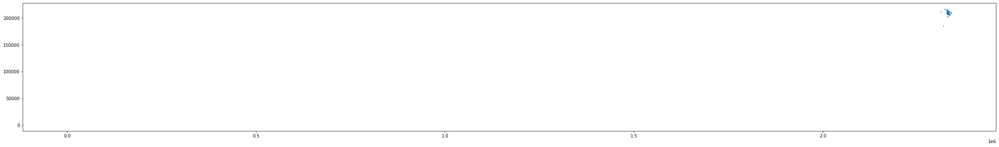

In [96]:
#plotting    
ax = gdf1.plot(figsize=(40, 30))
commercial.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 0.5,ax=ax)

In [97]:
# Calculate inductrial area
industrial  = intdata[intdata['type'].str.contains('industrial')]
output_industrial = industrial  .groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_industrial.columns=['osm_id','Industrial Area ']
output_industrial.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Industrial Area
0,5516558.0,6.007195e+06
1,5522164.0,2.620972e+06
2,5527017.0,3.898020e+06
3,5528173.0,1.138880e+06
4,5529833.0,1.865722e+06


In [98]:
# Calculate residential area
residential  = intdata[intdata['type'].str.contains('residential')]
output_residential = residential.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_residential.columns=['osm_id','Residential_Area ']
output_residential.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Residential_Area
0,5522164.0,7.545588e+05
1,5528173.0,2.052043e+06
2,5529700.0,1.168102e+05
3,5529833.0,8.740887e+05
4,5532192.0,1.168102e+05


In [99]:
residential.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,name,type,geometry,Area
145,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,333102036,Water,residential,"POLYGON ((2329940.430 206379.294, 2329940.506 ...",2332.221251
146,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,333102036,Water,residential,"POLYGON ((2329940.506 206382.101, 2329973.807 ...",11237.765711
147,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,333102036,Water,residential,"POLYGON ((2329940.506 206382.101, 2329973.807 ...",11237.765711
148,P009POR,Tilikum Crossing south side,permanent,2019,Portland,2.0,814.252817,59.301370,33.041096,5467.0,45.503272,-122.669503,NaN,334030020.0,333102036,Water,residential,"POLYGON ((2329940.506 206382.101, 2329973.807 ...",11237.765711
149,P010POR,Tilikum Crossing north side,permanent,2019,Portland,1.0,842.195238,54.643836,32.301370,4860.0,45.506589,-122.664111,NaN,334030006.0,333102036,Water,residential,"POLYGON ((2329940.506 206382.101, 2329973.807 ...",11237.765711


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

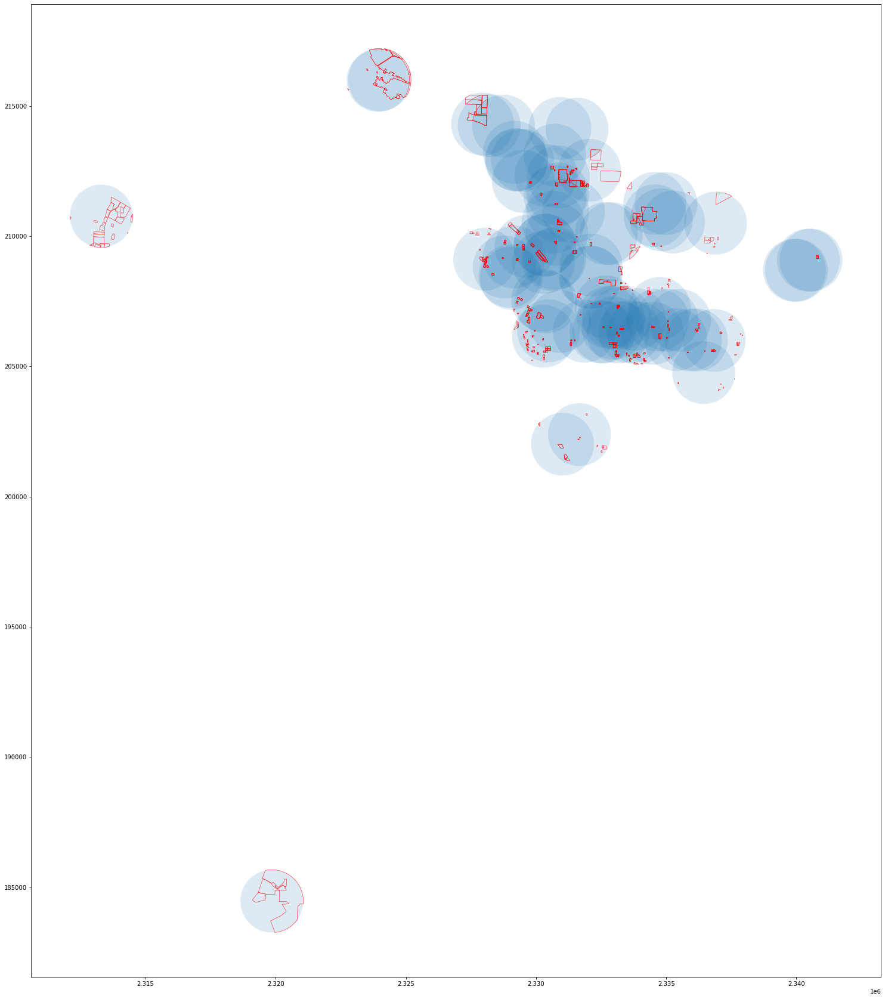

In [100]:
#plotting    
ax = gdf1.plot(figsize=(40, 30),alpha=0.15)
residential.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 0.5,ax=ax)

In [101]:
# Calculate retail area
retail  = intdata[intdata['type'].str.contains('retail')]
output_retail = retail.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_retail.columns=['osm_id','Retail Area']
output_retail.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Retail Area
0,5516558.0,2.336750e+05
1,5522164.0,6.863365e+05
2,5527017.0,5.984898e+05
3,5528173.0,3.395353e+05
4,5529700.0,3.012302e+06


In [102]:
# Calculate grass area
grass  = intdata[intdata['type'].str.contains('grass')]
output_grass = grass.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_grass.columns=['osm_id','Grass Area']
output_grass.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Grass Area
0,5522164.0,94668.073562
1,5528173.0,278701.764696
2,5529700.0,140896.701055
3,5529833.0,190025.458328
4,5532192.0,16788.228351


In [103]:
output_grass.index

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


RangeIndex(start=0, stop=67, step=1)

# Use the Natural Shape file to calculate the Park, water and green spaces

In [104]:
#nature=gpd.read_file("../input/osm-data/natural.shp")
nature.head(5)

,osm_id,name,type,geometry
0,4946908,Johnson Lake,water,"POLYGON ((-122.56649 45.56608, -122.56653 45.5..."
1,4946909,None,water,"POLYGON ((-122.59824 45.57255, -122.59823 45.5..."
2,4946910,None,water,"POLYGON ((-122.61278 45.57436, -122.61274 45.5..."
3,4946943,None,water,"POLYGON ((-122.58331 45.56990, -122.58320 45.5..."
4,4946969,None,water,"POLYGON ((-122.54781 45.56336, -122.54810 45.5..."


In [105]:
# set the co-ordinate system first
# nature = nature.set_crs("EPSG:4326")
# Let's take a copy of our layer
nature_proj = nature.copy()

# Reproject the geometries by replacing the values with projected ones
nature_proj = nature_proj.to_crs(epsg=2838)
nature_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [106]:
#nature_proj.plot()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

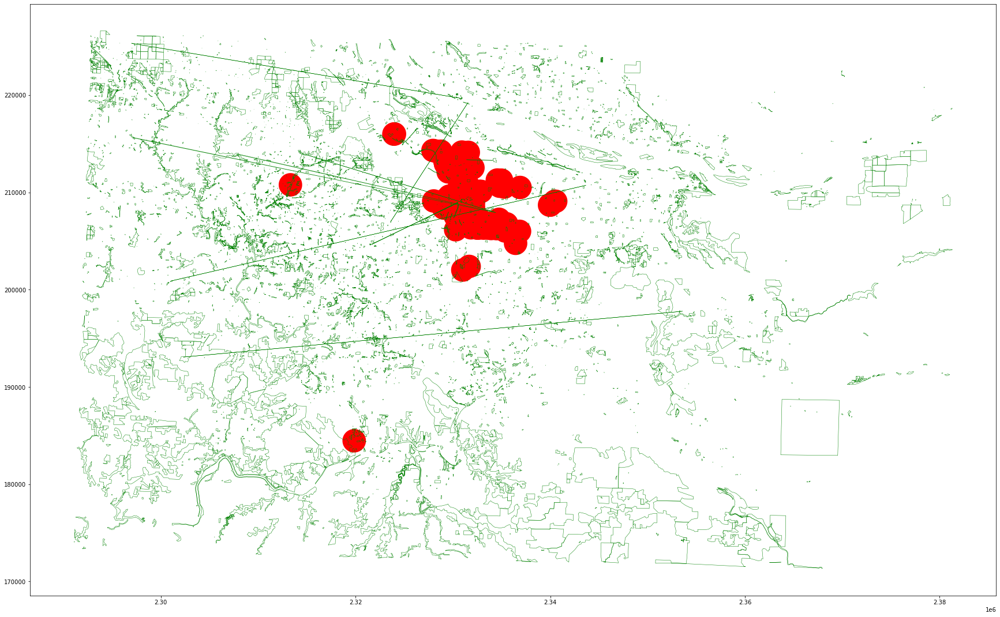

In [107]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
nature_proj.geometry.boundary.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

# There is some invalid polygon in the shape file that need to pass through zero geom to correct it

In [108]:
nature_proj["geometry2"]=nature_proj.geometry.buffer(0)
nature_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry,geometry2
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ...","POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ...","POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ...","POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ...","POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ...","POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [109]:
# Now drop geometry column and rename geometry 2 equal to geometry again
nature_proj1=nature_proj.drop(["geometry"],axis=1)
nature_proj1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry2
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [110]:
nature_proj1.rename({'geometry2': 'geometry'}, axis=1, inplace=True)
nature_proj1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [111]:
# Clip the data using GeoPandas clip
buffer_clip_nature = gpd.clip(nature_proj1, gdf1)
buffer_clip_nature.head(10)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
28,25709381,Irving Park,park,"POLYGON ((2331748.164 211321.328, 2331744.696 ..."
29,25710211,Alberta Park,park,"POLYGON ((2332690.190 213299.506, 2332679.555 ..."
32,26174736,Rock Creek Greenway,park,"POLYGON ((2313358.937 211047.673, 2313408.356 ..."
33,26174764,Rock Creek Park,park,"POLYGON ((2313246.262 210646.696, 2313261.281 ..."
35,26404177,Peninsula Park,park,"POLYGON ((2330271.426 213766.112, 2330453.100 ..."
40,27400985,Saint Johns Park,park,"POLYGON ((2324313.404 216360.243, 2324306.983 ..."
43,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330185.866 207568.183, 2330151.882 ..."
49,28155349,City of Portland Reservoir Number 6,water,"POLYGON ((2336019.264 206990.048, 2336018.285 ..."
50,28155350,City of Portland Reservoir Number 5,water,"POLYGON ((2336122.688 207195.571, 2336130.383 ..."
51,29038630,Holladay Park,park,"POLYGON ((2331872.355 209450.308, 2331878.919 ..."


In [112]:
inter_nature=gpd.overlay(gdf1, buffer_clip_nature, how='intersection', make_valid=True, keep_geom_type=False)
inter_nature.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,name,type,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330548.830 208712.496, 2330562.934 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330495.599 208670.414, 2330555.029 ..."
2,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330297.017 207935.334, 2330292.913 ..."
3,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330489.477 208459.526, 2330490.637 ..."
4,P006POR,BROADWAY BR south side,permanent,2019,Portland,2.0,984.694490,91.246575,61.273973,10649.0,45.532780,-122.672424,NaN,422121256.0,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330488.652 208451.552, 2330488.852 ..."


In [113]:
inter_nature["Area"]=inter_nature["geometry"].area*10.76 # in ft2
inter_nature.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,name,type,geometry,Area
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330548.830 208712.496, 2330562.934 ...",826112.706654
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330495.599 208670.414, 2330555.029 ...",795120.658932
2,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330297.017 207935.334, 2330292.913 ...",664932.531741
3,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330489.477 208459.526, 2330490.637 ...",289824.322382
4,P006POR,BROADWAY BR south side,permanent,2019,Portland,2.0,984.694490,91.246575,61.273973,10649.0,45.532780,-122.672424,NaN,422121256.0,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330488.652 208451.552, 2330488.852 ...",295365.254503


In [114]:
#inter_nature.plot(figsize=(20, 20),alpha=0.5, edgecolor='k', cmap='tab10')

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [115]:
output_nature=inter_nature.groupby(by=['osm_id_sensor','type'])['Area'].sum().reset_index()
output_nature.head()

,osm_id_sensor,type,Area
0,5516558.0,park,2.074822e+06
1,5516558.0,water,2.341519e+03
2,5522164.0,forest,3.760622e+05
3,5522164.0,park,8.506530e+05
4,5522164.0,water,4.346349e+05


In [116]:
# Calculate park area
park  = inter_nature[inter_nature['type'].str.contains('park')]
output_park = park.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_park.columns=['osm_id',"Park Area"]
output_park.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Park Area
0,5516558.0,2.074822e+06
1,5522164.0,8.506530e+05
2,5527017.0,1.359128e+06
3,5528173.0,6.050387e+05
4,5529700.0,6.718781e+05


In [117]:
# Calculate water area
water  = inter_nature[inter_nature['type'].str.contains('water')]
output_water= water.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_water.columns=['osm_id',"Water Area"]
output_water.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Water Area
0,5516558.0,2341.518610
1,5522164.0,434634.851847
2,5527017.0,4082.891831
3,5528173.0,428928.998859
4,5529700.0,10972.419791


In [118]:
# Calculate forest area
forest  = inter_nature[inter_nature['type'].str.contains('forest')]
output_forest= forest.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_forest.columns=['osm_id',"Forest Area"]
output_forest.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Forest Area
0,5522164.0,376062.151980
1,5528173.0,121186.261493
2,33665960.0,175240.799912
3,44793234.0,74623.091122
4,66788465.0,167667.503769


# Use the Point Shape file to calculate the Bicycle parking, Bus/Train stops, Intersection Density, School/College/University

In [119]:
#pts=gpd.read_file("../input/osm-data/points.shp")
pts.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,timestamp,name,type,geometry
0,27195852,None,None,traffic_signals,POINT (-122.86756 45.54089)
1,27199958,None,None,turning_circle,POINT (-122.88963 45.53199)
2,27266177,None,None,traffic_signals,POINT (-122.90523 45.53771)
3,27266267,None,None,traffic_signals,POINT (-122.88852 45.53605)
4,27273304,None,None,traffic_signals,POINT (-122.86309 45.53985)


In [120]:
# set the co-ordinate system first
#pts = pts.set_crs("EPSG:4326")
# Let's take a copy of our layer
pts_proj = pts.copy()

# Reproject the geometries by replacing the values with projected ones
pts_proj = pts_proj.to_crs(epsg=2838)
pts_proj.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,timestamp,name,type,geometry
0,27195852,None,None,traffic_signals,POINT (2315133.607 210977.179)
1,27199958,None,None,turning_circle,POINT (2313381.281 210038.384)
2,27266177,None,None,traffic_signals,POINT (2312182.520 210710.249)
3,27266267,None,None,traffic_signals,POINT (2313480.859 210487.402)
4,27273304,None,None,traffic_signals,POINT (2315478.452 210851.497)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

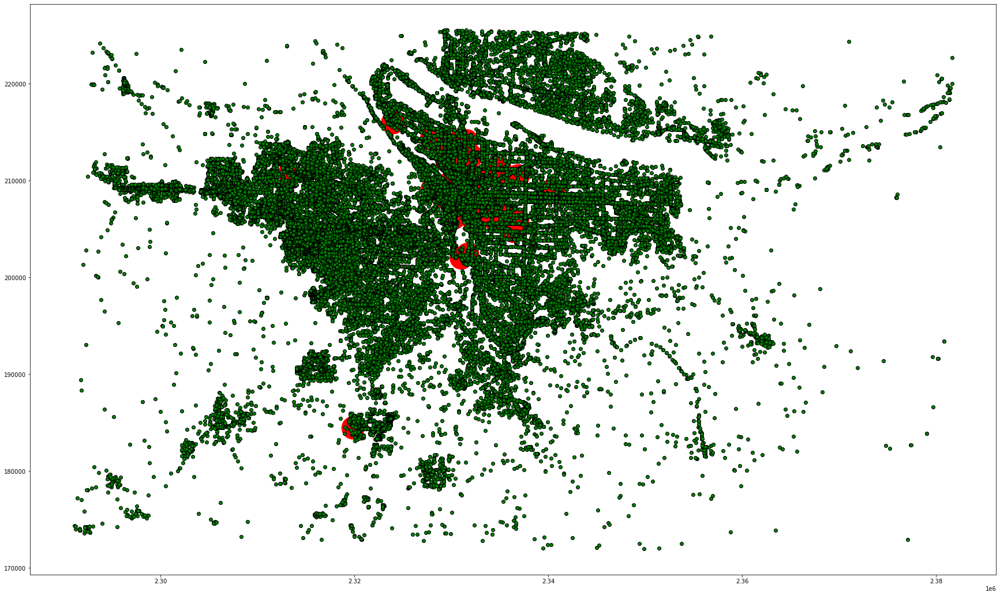

In [121]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
pts_proj.plot(color="green",edgecolor='k',ax=ax) #Use your second dataframe

In [122]:
# Clip the data using GeoPandas clip
buffer_clip_pts = gpd.clip(pts_proj, gdf1)
buffer_clip_pts.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,timestamp,name,type,geometry
1,27199958,None,None,turning_circle,POINT (2313381.281 210038.384)
2,27266177,None,None,traffic_signals,POINT (2312182.520 210710.249)
3,27266267,None,None,traffic_signals,POINT (2313480.859 210487.402)
6,27286351,None,None,turning_circle,POINT (2313129.135 210018.110)
13,27526652,None,None,traffic_signals,POINT (2314315.636 210308.863)


In [123]:
#ax = buffer_clip_pts.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [124]:
inter_pts=gpd.overlay(gdf1, buffer_clip_pts, how='intersection', make_valid=True, keep_geom_type=False)
inter_pts.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,timestamp,name,type,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,31970537,None,None,crossing,POINT (2329460.295 207770.007)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,31970537,None,None,crossing,POINT (2329460.295 207770.007)
2,S162POR,SW 16TH AVE N of YAMHILL ST,short-term,2019,Portland,2.0,37.902936,1.205479,0.589041,482.0,45.521091,-122.688441,NaN,124817127.0,31970537,None,None,crossing,POINT (2329460.295 207770.007)
3,S163POR,SW 17TH AVE S of MORRISON ST,short-term,2019,Portland,2.0,47.561166,3.958904,1.739726,1661.0,45.521764,-122.689202,NaN,5522164.0,31970537,None,None,crossing,POINT (2329460.295 207770.007)
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,32201168,None,None,crossing,POINT (2329491.608 207843.580)


# Calculate the bicycle parking

In [125]:
#k1 = df.loc[(df.Product == p_id) & (df.Time >= start_time) & (df.Time < end_time), ['Time', 'Product']]
b_parking = inter_pts[inter_pts['type'].str.contains('bicycle_parking')]
b_parking.head(5)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,timestamp,name,type,geometry
1844,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,355120991,None,None,bicycle_parking,POINT (2329323.429 207234.431)
1845,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,355120991,None,None,bicycle_parking,POINT (2329323.429 207234.431)
1846,S162POR,SW 16TH AVE N of YAMHILL ST,short-term,2019,Portland,2.0,37.902936,1.205479,0.589041,482.0,45.521091,-122.688441,NaN,124817127.0,355120991,None,None,bicycle_parking,POINT (2329323.429 207234.431)
1913,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,498659846,None,None,bicycle_parking,POINT (2329738.548 208188.640)
1914,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,498659846,None,None,bicycle_parking,POINT (2329738.548 208188.640)


In [126]:
output_bparking=b_parking.groupby(by=['osm_id_sensor'])['type'].count().reset_index()
output_bparking.columns=["osm_id","Bicycle Parking"]
output_bparking.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Bicycle Parking
0,5516558.0,42
1,5522164.0,1244
2,5527017.0,8
3,5528173.0,721
4,5529700.0,6


# Calculate bus stops

In [127]:
transit_stops= inter_pts[inter_pts['type'].str.contains('bus_stop')]
transit_stops.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,osm_id,timestamp,name,type,geometry
1480,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,323588258,None,Southwest Washington & 9th,bus_stop,POINT (2329648.507 208386.279)
1481,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,323588258,None,Southwest Washington & 9th,bus_stop,POINT (2329648.507 208386.279)
1482,P008POR,STEEL BR upper sidewalk north side,permanent,2019,Portland,1.0,199.528105,11.630137,9.232877,12846.0,45.526900,-122.672890,NaN,348027809.0,323588258,None,Southwest Washington & 9th,bus_stop,POINT (2329648.507 208386.279)
1483,S067POR,NW 16TH AVE S of JOHNSON ST,short-term,2019,Portland,3.0,44.258472,2.589041,1.287671,1671.0,45.528434,-122.687409,NaN,33665960.0,323588258,None,Southwest Washington & 9th,bus_stop,POINT (2329648.507 208386.279)
1484,S068POR,NW EVERETT ST E of 20TH AVE,short-term,2019,Portland,2.0,97.396917,22.150685,9.986301,3242.0,45.524914,-122.692141,NaN,317719666.0,323588258,None,Southwest Washington & 9th,bus_stop,POINT (2329648.507 208386.279)


In [128]:
output_bstop=transit_stops.groupby(by=['osm_id_sensor'])['type'].count().reset_index()
output_bstop.columns=["osm_id","Bus Stops"]
output_bstop.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Bus Stops
0,5516558.0,52
1,5522164.0,146
2,5527017.0,62
3,5528173.0,77
4,5529700.0,74


# Calculate school/college/university

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


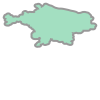

In [129]:
#sc= inter_pts[inter_pts['type'].str.contains('school|college')]
#sc
# convert to unprojected polygon for osmnx data pull
polygon = pba.to_crs(4326).iloc[0]
polygon

In [130]:
# Import school
tags = {'amenity': 'school'}
scl = ox.geometries_from_polygon(polygon, tags)
#scl[['amenity', 'name', 'geometry']]


In [131]:
scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,unique_id,osmid,element_type,geometry,wheelchair,addr:city,addr:housenumber,addr:postcode,addr:street,amenity,...,layer,url,female,landuse,proposed:name,source_ref,wikimedia_commons,opening_date,ways,type
0,node/251851260,251851260,node,POINT (-122.83845 45.47472),NaN,Beaverton,15760,97007,Southwest Davis Road,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node/251851266,251851266,node,POINT (-122.86610 45.48443),NaN,Aloha,18380,97078,Southwest Kinnaman Road,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node/251851270,251851270,node,POINT (-122.85033 45.48950),NaN,Aloha,16860,97078,Southwest Blanton Street,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,node/251851273,251851273,node,POINT (-122.88109 45.47104),NaN,Aloha,6750,97078,Southwest 198th Avenue,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,node/251851274,251851274,node,POINT (-122.80478 45.47900),NaN,Beaverton,5650,97005,Southwest Hall Boulevard,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [132]:
print(scl.crs)

epsg:4326


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [133]:
# set the co-ordinate system first
scl = scl.set_crs("EPSG:4326")
# Let's take a copy of our layer
scl_proj = scl.copy()

# Reproject the geometries by replacing the values with projected ones
scl_proj =scl_proj.to_crs(epsg=2838)
scl_proj.head(5)

,unique_id,osmid,element_type,geometry,wheelchair,addr:city,addr:housenumber,addr:postcode,addr:street,amenity,...,layer,url,female,landuse,proposed:name,source_ref,wikimedia_commons,opening_date,ways,type
0,node/251851260,251851260,node,POINT (2317192.851 203560.279),NaN,Beaverton,15760,97007,Southwest Davis Road,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node/251851266,251851266,node,POINT (2315063.403 204701.392),NaN,Aloha,18380,97078,Southwest Kinnaman Road,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node/251851270,251851270,node,POINT (2316311.783 205228.919),NaN,Aloha,16860,97078,Southwest Blanton Street,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,node/251851273,251851273,node,POINT (2313848.119 203248.398),NaN,Aloha,6750,97078,Southwest 198th Avenue,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,node/251851274,251851274,node,POINT (2319838.086 203960.126),NaN,Beaverton,5650,97005,Southwest Hall Boulevard,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [134]:
#school= inter_pts[inter_pts['type'].str.contains('school')]
#school.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [135]:
scl_proj['geometry']=scl_proj['geometry'].centroid
scl_proj.head()

,unique_id,osmid,element_type,geometry,wheelchair,addr:city,addr:housenumber,addr:postcode,addr:street,amenity,...,layer,url,female,landuse,proposed:name,source_ref,wikimedia_commons,opening_date,ways,type
0,node/251851260,251851260,node,POINT (2317192.851 203560.279),NaN,Beaverton,15760,97007,Southwest Davis Road,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node/251851266,251851266,node,POINT (2315063.403 204701.392),NaN,Aloha,18380,97078,Southwest Kinnaman Road,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node/251851270,251851270,node,POINT (2316311.783 205228.919),NaN,Aloha,16860,97078,Southwest Blanton Street,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,node/251851273,251851273,node,POINT (2313848.119 203248.398),NaN,Aloha,6750,97078,Southwest 198th Avenue,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,node/251851274,251851274,node,POINT (2319838.086 203960.126),NaN,Beaverton,5650,97005,Southwest Hall Boulevard,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [136]:
buffer_clip_scl = gpd.clip(scl_proj, gdf1)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [137]:
inter_scl=gpd.overlay(gdf1, buffer_clip_scl, how='intersection', make_valid=True, keep_geom_type=False)
inter_scl.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,url,female,landuse,proposed:name,source_ref,wikimedia_commons,opening_date,ways,type,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (2329336.402 207914.035)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (2329336.402 207914.035)
2,S068POR,NW EVERETT ST E of 20TH AVE,short-term,2019,Portland,2.0,97.396917,22.150685,9.986301,3242.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (2329336.402 207914.035)
3,S162POR,SW 16TH AVE N of YAMHILL ST,short-term,2019,Portland,2.0,37.902936,1.205479,0.589041,482.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (2329336.402 207914.035)
4,S163POR,SW 17TH AVE S of MORRISON ST,short-term,2019,Portland,2.0,47.561166,3.958904,1.739726,1661.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (2329336.402 207914.035)


In [138]:
output_school=inter_scl.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
output_school.columns=["osm_id","School"]
output_school.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,School
0,5516558.0,5
1,5522164.0,11
2,5527017.0,3
3,5528173.0,7
4,5529700.0,3


# Closest distance to school

In [139]:
def min_distance_ppoly(point, polygon):
    return polygon.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [140]:
#school1= pts_proj[pts_proj['type'].str.contains('school')]
#school1.head(5)

In [141]:
ecoshort['min_dist_to_school'] = ecoshort.geometry.apply(min_distance_ppoly, args=(scl_proj,))*3.28084
output_school_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_school"]]
output_school_distance.columns=["osm_id","min_dist_to_school"]
output_school_distance.head()

,osm_id,min_dist_to_school
0,681301893.0,2262.300738
1,689032191.0,2643.824523
2,322079535.0,2034.205847
3,348027806.0,3179.337015
4,126306263.0,2417.444765


# Count College within the buffer

In [142]:
# Import college
tags = {'amenity': 'college'}
coll = ox.geometries_from_polygon(polygon, tags)
# set the co-ordinate system first
coll = coll.set_crs("EPSG:4326")
# Let's take a copy of our layer
coll_proj = coll.copy()

# Reproject the geometries by replacing the values with projected ones
coll_proj =coll_proj.to_crs(epsg=2838)
coll_proj['geometry']=coll_proj['geometry'].centroid
buffer_clip_coll = gpd.clip(coll_proj, gdf1)
inter_coll=gpd.overlay(gdf1, buffer_clip_coll, how='intersection', make_valid=True, keep_geom_type=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [143]:
#college= inter_pts[inter_pts['type'].str.contains('college')]
#college.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [144]:
output_college=inter_coll.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
output_college.columns=["osm_id","college"]
output_college.head()

,osm_id,college
0,5516558.0,1
1,5522164.0,6
2,5528173.0,4
3,5538454.0,1
4,33665960.0,5


# Closest distance to college

In [145]:
#college1= pts_proj[pts_proj['type'].str.contains('college')]
#college1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [146]:
ecoshort['min_dist_to_college'] = ecoshort.geometry.apply(min_distance_ppoly, args=(coll_proj,))*3.28084
output_college_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_college"]]
output_college_distance.columns=["osm_id","min_dist_to_college"]
output_college_distance.head()

,osm_id,min_dist_to_college
0,681301893.0,1384.844295
1,689032191.0,1766.482889
2,322079535.0,632.879498
3,348027806.0,2134.229233
4,126306263.0,2623.771633


# Count the University within buffer and turn it yes(1) and No(0) coding

In [147]:
#university= inter_pts[inter_pts['type'].str.contains('university')]
#university.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [148]:
# Import college
tags = {'amenity': 'university'}
uni = ox.geometries_from_polygon(polygon, tags)
# set the co-ordinate system first
uni = uni.set_crs("EPSG:4326")
# Let's take a copy of our layer
uni_proj = uni.copy()

# Reproject the geometries by replacing the values with projected ones
uni_proj =uni_proj.to_crs(epsg=2838)
uni_proj['geometry']=uni_proj['geometry'].centroid
buffer_clip_uni = gpd.clip(uni_proj, gdf1)
inter_uni=gpd.overlay(gdf1, buffer_clip_uni, how='intersection', make_valid=True, keep_geom_type=False)

In [149]:
output_university=inter_uni.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
output_university.loc[output_university['geometry'] > 0, 'geometry'] = 1
output_university.loc[output_university['geometry'] ==0, 'geometry'] = 0
output_university.columns=["osm_id","University"]
output_university.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,University
0,5522164.0,1
1,5528173.0,1
2,33665960.0,1
3,117155117.0,1
4,117155127.0,1


# Closest distance to university

In [150]:
#university1= pts_proj[pts_proj['type'].str.contains('university')]
#university1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [151]:
ecoshort['min_dist_to_university'] = ecoshort.geometry.apply(min_distance_ppoly, args=(uni_proj,))*3.28084
output_university_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_university"]]
output_university_distance.columns=["osm_id","min_dist_to_university"]
output_university_distance.head()

,osm_id,min_dist_to_university
0,681301893.0,3131.276680
1,689032191.0,3467.043478
2,322079535.0,3086.233635
3,348027806.0,3802.769802
4,126306263.0,3133.889048


# Calculate osm node density

In [152]:
# lets bring the road shape file node to calculate the osm node density

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


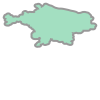

In [153]:
# convert to unprojected polygon for osmnx data pull
polygon = pba.to_crs(4326).iloc[0]
polygon

In [154]:
#!pip install networkx
#!pip install osmnx
import networkx as nx
import osmnx as ox
ox.config(log_file=True,log_console=True,use_cache=True)
#place="Portland,USA"
#Construct the street network
G=ox.graph_from_polygon(polygon,network_type="drive",simplify=False)
#G_projected=ox.project_graph(G)
#fig, ax = ox.plot_graph(G,node_color='yellow',edge_color='blue')

In [155]:
nodes, edges = ox.graph_to_gdfs(G)
nodes.head(5)

,y,x,highway,street_count,ref,geometry
osmid,,,,,,
27195852,45.540893,-122.867556,traffic_signals,5,NaN,POINT (-122.86756 45.54089)
27196027,45.525280,-122.661726,NaN,2,NaN,POINT (-122.66173 45.52528)
27196028,45.525338,-122.661431,NaN,2,NaN,POINT (-122.66143 45.52534)
27196029,45.525506,-122.660838,NaN,2,NaN,POINT (-122.66084 45.52551)
27199858,45.530317,-122.891740,NaN,3,NaN,POINT (-122.89174 45.53032)


In [156]:
print(nodes.crs)

epsg:4326


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [157]:
# set the co-ordinate system first
node = nodes.set_crs("EPSG:4326")
# Let's take a copy of our layer
node_proj = node.copy()

# Reproject the geometries by replacing the values with projected ones
node_proj = node_proj.to_crs(epsg=2838)
node_proj.head(5)

,y,x,highway,street_count,ref,geometry
osmid,,,,,,
27195852,45.540893,-122.867556,traffic_signals,5,NaN,POINT (2315133.607 210977.179)
27196027,45.525280,-122.661726,NaN,2,NaN,POINT (2331155.112 208792.181)
27196028,45.525338,-122.661431,NaN,2,NaN,POINT (2331178.296 208797.986)
27196029,45.525506,-122.660838,NaN,2,NaN,POINT (2331225.108 208815.344)
27199858,45.530317,-122.891740,NaN,3,NaN,POINT (2313210.935 209857.954)


In [158]:
# Clip the data using GeoPandas clip
buffer_clip_node = gpd.clip(node_proj, gdf1)
buffer_clip_node.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,y,x,highway,street_count,ref,geometry
osmid,,,,,,
27196027,45.525280,-122.661726,NaN,2,NaN,POINT (2331155.112 208792.181)
27196028,45.525338,-122.661431,NaN,2,NaN,POINT (2331178.296 208797.986)
27196029,45.525506,-122.660838,NaN,2,NaN,POINT (2331225.108 208815.344)
27199858,45.530317,-122.891740,NaN,3,NaN,POINT (2313210.935 209857.954)
27199860,45.529636,-122.889662,NaN,4,NaN,POINT (2313370.935 209777.459)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


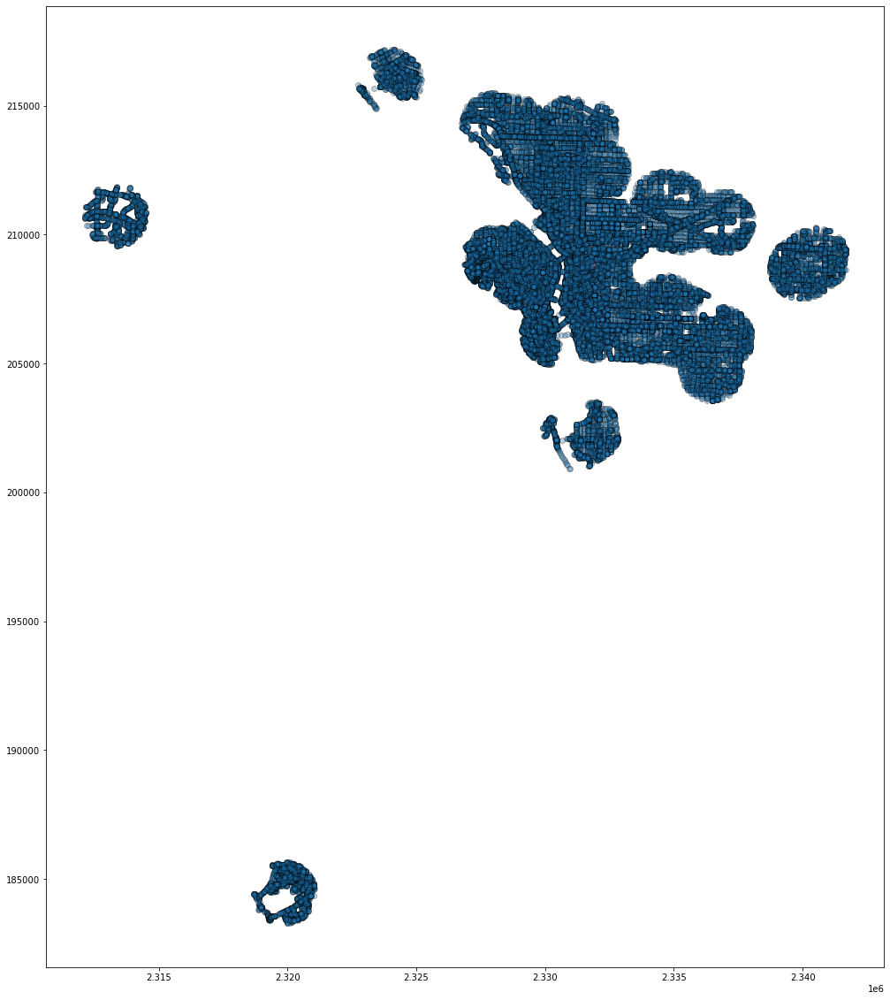

In [159]:
ax = buffer_clip_node.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [160]:
 inter_node=gpd.overlay(gdf1, buffer_clip_node, how='intersection', make_valid=True, keep_geom_type=False)
 inter_node.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,y,x,highway,street_count,ref,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,45.515675,-122.683056,crossing,2,NaN,POINT (2329460.650 207769.853)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,45.515675,-122.683056,crossing,2,NaN,POINT (2329460.650 207769.853)
2,S162POR,SW 16TH AVE N of YAMHILL ST,short-term,2019,Portland,2.0,37.902936,1.205479,0.589041,482.0,45.521091,-122.688441,NaN,124817127.0,45.515675,-122.683056,crossing,2,NaN,POINT (2329460.650 207769.853)
3,S163POR,SW 17TH AVE S of MORRISON ST,short-term,2019,Portland,2.0,47.561166,3.958904,1.739726,1661.0,45.521764,-122.689202,NaN,5522164.0,45.515675,-122.683056,crossing,2,NaN,POINT (2329460.650 207769.853)
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,45.516346,-122.682689,crossing,2,NaN,POINT (2329491.292 207843.722)


Intersection density per mile2

In [161]:
output_intersection_density= inter_node.groupby(by=['osm_id_sensor'])['geometry'].count()/(3.1416*size*size*3.861e-07)
output_intersection_density.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osm_id_sensor
5516558.0     975.021720
5522164.0    2730.966234
5527017.0     918.998998
5528173.0    1914.958503
5529700.0     980.114695
Name: geometry, dtype: float64

In [162]:
output_intersection_density1=output_intersection_density.reset_index()
output_intersection_density1.columns=["osm_id","OSM_node_Density"]
output_intersection_density1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,OSM_node_Density
0,5516558.0,975.021720
1,5522164.0,2730.966234
2,5527017.0,918.998998
3,5528173.0,1914.958503
4,5529700.0,980.114695


# Calculate the Intersection Density

In [163]:
custom_filter = ox.downloader._get_osm_filter("drive")
custom_filter += '["highway"!~"motor"]'  # filter out freeways
Ga = ox.graph_from_polygon(polygon, custom_filter=custom_filter, simplify=True)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [164]:
nodesa, edgesa = ox.graph_to_gdfs(Ga)
# set the co-ordinate system first
nodea = nodesa.set_crs("EPSG:4326")
# Let's take a copy of our layer
nodea_proj = nodea.copy()

# Reproject the geometries by replacing the values with projected ones
nodea_proj = nodea_proj.to_crs(epsg=2838)
nodea_proj.head(5)

,y,x,highway,street_count,geometry
osmid,,,,,
27195852,45.540893,-122.867556,traffic_signals,3,POINT (2315133.607 210977.179)
27199858,45.530317,-122.891740,NaN,3,POINT (2313210.935 209857.954)
27199860,45.529636,-122.889662,NaN,4,POINT (2313370.935 209777.459)
27203602,45.529630,-122.889014,NaN,3,POINT (2313421.525 209775.318)
27266260,45.537931,-122.900224,NaN,4,POINT (2312573.704 210723.395)


In [165]:
buffer_clip_nodea = gpd.clip(nodea_proj, gdf1)
inter_nodea=gpd.overlay(gdf1, buffer_clip_nodea, how='intersection', make_valid=True, keep_geom_type=False)
outputa_intersection_density= inter_nodea.groupby(by=['osm_id_sensor'])['geometry'].count()/(3.1416*size*size*3.861e-07)
output_intersection_densitya=outputa_intersection_density.reset_index()
output_intersection_densitya.columns=["osm_id","Intersection_Density"]
output_intersection_densitya.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Intersection_Density
0,5516558.0,241.633357
1,5522164.0,337.268105
2,5527017.0,252.951079
3,5528173.0,267.098231
4,5529700.0,185.044749


# Calculate the Number of Lanes

In [166]:
edges.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid  oneway lanes        highway  length  \
u        v          key                                                  
27195852 1490066015 0     4441934    True     1  motorway_link  20.083   
         27287656   0     5390884   False     6        primary  69.464   
         671782028  0    37185154    True     3        primary  12.538   
27196027 27196028   0    23630312    True     2  motorway_link  23.841   
27196028 355777024  0    31779702    True     2  motorway_link  13.359   

                                           name maxspeed bridge  ref access  \
u        v          key                                                       
27195852 1490066015 0                       NaN      NaN    NaN  NaN    NaN   
         27287656   0    Northwest 185th Avenue   40 mph    NaN  NaN    NaN   
         671782028  0    Northwest 185th Avenue   40 mph    NaN  NaN    NaN   
27196027 27196028   0                       NaN   50 mph    yes  NaN    NaN   
27196028 355777024  0                       NaN   50 mph    NaN  NaN    NaN   

                        junction tunnel width est_width area landuse  \
u        v          key                                                
27195852 1490066015 0        NaN    NaN   NaN       NaN  NaN     NaN   
         27287656   0        NaN    NaN   NaN       NaN  NaN     NaN   
         671782028  0        NaN    NaN   NaN       NaN  NaN     NaN   
27196027 27196028   0        NaN    NaN   NaN       NaN  NaN     NaN   
27196028 355777024  0        NaN    NaN   NaN       NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27195852 1490066015 0    LINESTRING (-122.86756 45.54089, -122.86730 45...  
         27287656   0    LINESTRING (-122.86756 45.54089, -122.86756 45...  
         671782028  0    LINESTRING (-122.86756 45.54089, -122.86765 45...  
27196027 27196028   0    LINESTRING (-122.66173 45.52528, -122.66143 45...  
27196028 355777024  0    LINESTRING (-122.66143 45.52534, -122.66127 45...

In [167]:
print(edges.crs)

epsg:4326


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [168]:
# set the co-ordinate system first
edge = edges.set_crs("EPSG:4326")
# Let's take a copy of our layer
edge_proj = edge.copy()

# Reproject the geometries by replacing the values with projected ones
edge_proj = edge_proj.to_crs(epsg=2838)
edge_proj.head(5)

osmid  oneway lanes        highway  length  \
u        v          key                                                  
27195852 1490066015 0     4441934    True     1  motorway_link  20.083   
         27287656   0     5390884   False     6        primary  69.464   
         671782028  0    37185154    True     3        primary  12.538   
27196027 27196028   0    23630312    True     2  motorway_link  23.841   
27196028 355777024  0    31779702    True     2  motorway_link  13.359   

                                           name maxspeed bridge  ref access  \
u        v          key                                                       
27195852 1490066015 0                       NaN      NaN    NaN  NaN    NaN   
         27287656   0    Northwest 185th Avenue   40 mph    NaN  NaN    NaN   
         671782028  0    Northwest 185th Avenue   40 mph    NaN  NaN    NaN   
27196027 27196028   0                       NaN   50 mph    yes  NaN    NaN   
27196028 355777024  0                       NaN   50 mph    NaN  NaN    NaN   

                        junction tunnel width est_width area landuse  \
u        v          key                                                
27195852 1490066015 0        NaN    NaN   NaN       NaN  NaN     NaN   
         27287656   0        NaN    NaN   NaN       NaN  NaN     NaN   
         671782028  0        NaN    NaN   NaN       NaN  NaN     NaN   
27196027 27196028   0        NaN    NaN   NaN       NaN  NaN     NaN   
27196028 355777024  0        NaN    NaN   NaN       NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27195852 1490066015 0    LINESTRING (2315133.607 210977.179, 2315153.70...  
         27287656   0    LINESTRING (2315133.607 210977.179, 2315135.41...  
         671782028  0    LINESTRING (2315133.607 210977.179, 2315125.75...  
27196027 27196028   0    LINESTRING (2331155.112 208792.181, 2331178.29...  
27196028 355777024  0    LINESTRING (2331178.296 208797.986, 2331191.04...

In [169]:
# Consider rows without NAN
edge_clean = edge_proj[edge_proj['lanes'].notna()]
edge_clean2 = edge_clean [edge_clean.lanes!=0]
edge_clean2.head(10)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid  oneway lanes        highway   length  \
u        v          key                                                    
27195852 1490066015 0      4441934    True     1  motorway_link   20.083   
         27287656   0      5390884   False     6        primary   69.464   
         671782028  0     37185154    True     3        primary   12.538   
27196027 27196028   0     23630312    True     2  motorway_link   23.841   
27196028 355777024  0     31779702    True     2  motorway_link   13.359   
27196029 1382218550 0     31779702    True     2  motorway_link   31.306   
27200088 27200091   0     30312378    True     3       motorway  125.440   
27200091 1420520843 0     30312378    True     3       motorway   74.384   
27200092 1420520834 0      5397673    True     5       motorway   38.145   
27200095 38793661   0    186973851    True     4       motorway   84.691   

                                             name maxspeed bridge    ref  \
u        v          key                                                    
27195852 1490066015 0                         NaN      NaN    NaN    NaN   
         27287656   0      Northwest 185th Avenue   40 mph    NaN    NaN   
         671782028  0      Northwest 185th Avenue   40 mph    NaN    NaN   
27196027 27196028   0                         NaN   50 mph    yes    NaN   
27196028 355777024  0                         NaN   50 mph    NaN    NaN   
27196029 1382218550 0                         NaN   50 mph    NaN    NaN   
27200088 27200091   0    Northwest Sunset Highway   55 mph    NaN  US 26   
27200091 1420520843 0    Northwest Sunset Highway   55 mph    NaN  US 26   
27200092 1420520834 0              Sunset Highway   55 mph    NaN  US 26   
27200095 38793661   0              Sunset Highway   55 mph    NaN  US 26   

                        access junction tunnel width est_width area landuse  \
u        v          key                                                       
27195852 1490066015 0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
         27287656   0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
         671782028  0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27196027 27196028   0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27196028 355777024  0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27196029 1382218550 0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27200088 27200091   0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27200091 1420520843 0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27200092 1420520834 0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27200095 38793661   0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27195852 1490066015 0    LINESTRING (2315133.607 210977.179, 2315153.70...  
         27287656   0    LINESTRING (2315133.607 210977.179, 2315135.41...  
         671782028  0    LINESTRING (2315133.607 210977.179, 2315125.75...  
27196027 27196028   0    LINESTRING (2331155.112 208792.181, 2331178.29...  
27196028 355777024  0    LINESTRING (2331178.296 208797.986, 2331191.04...  
27196029 1382218550 0    LINESTRING (2331225.108 208815.344, 2331253.03...  
27200088 27200091   0    LINESTRING (2322154.575 207084.811, 2322271.10...  
27200091 1420520843 0    LINESTRING (2322271.105 207037.591, 2322341.26...  
27200092 1420520834 0    LINESTRING (2322528.262 206949.307, 2322564.95...  
27200095 38793661   0    LINESTRING (2322880.657 206868.243, 2322964.34...

In [170]:
def nearest_linestring(point, df_lines):
    idx = df_lines.geometry.distance(point).idxmin()
    return df_lines.loc[idx, 'lanes']

ecoshort['lanes'] = ecoshort.geometry.apply(nearest_linestring, df_lines=edge_clean2)
ecoshort
ecoshort_lane=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [171]:
ecoshort_lane.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218),2643.824523,1766.482889,3467.043478,1
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710),2034.205847,632.879498,3086.233635,3
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369),3179.337015,2134.229233,3802.769802,1
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073),2417.444765,2623.771633,3133.889048,4


In [172]:
output_lane=ecoshort_lane.loc[:,['osm_id_sensor','lanes']]
output_lane.columns=['osm_id','lanes']
output_lane.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,lanes
0,681301893.0,1
1,689032191.0,1
2,322079535.0,3
3,348027806.0,1
4,126306263.0,4


# Calculate the cycleway-left, cycleway-right and cycleway from OSM bike Network within the buffer

In [173]:
# This is osmnx's default OSM tag set for links
print(ox.settings.useful_tags_way)

['bridge', 'tunnel', 'oneway', 'lanes', 'ref', 'name', 'highway', 'maxspeed', 'service', 'access', 'area', 'landuse', 'width', 'est_width', 'junction']


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [174]:
### Modify run params here ###
extra_way_tags = ['cycleway', 'cycleway:left', 'cycleway:right']  # add'l OSM tags to keep

In [175]:
# Can add any OSM tag--will be populated if available
useful_tags = ox.settings.useful_tags_way + extra_way_tags
ox.config(use_cache=True, log_console=True, useful_tags_way=useful_tags)
print(ox.settings.useful_tags_way)

['bridge', 'tunnel', 'oneway', 'lanes', 'ref', 'name', 'highway', 'maxspeed', 'service', 'access', 'area', 'landuse', 'width', 'est_width', 'junction', 'cycleway', 'cycleway:left', 'cycleway:right']


In [176]:
Gc=ox.graph_from_polygon(polygon, network_type='bike',simplify=False)
#G = gpd.clip(G, pba)
#G_projected=ox.project_graph(G)
#fig, ax = ox.plot_graph(Gc,node_color='yellow',edge_color='blue')

In [177]:
nodesc, edgesc = ox.graph_to_gdfs(Gc)
edgesc.head(5)

osmid lanes                    name      highway  \
u        v          key                                                        
27195852 27287656   0     5390884     6  Northwest 185th Avenue      primary   
         671782028  0    37185154     3  Northwest 185th Avenue      primary   
27199858 1102782222 0     4443830   NaN   Northeast 85th Avenue  residential   
         38799060   0     4443830   NaN   Northeast 85th Avenue  residential   
         38746742   0     5392253   NaN  Northeast Alder Street  residential   

                        maxspeed cycleway  oneway   length bridge service  \
u        v          key                                                     
27195852 27287656   0     40 mph     lane   False   69.464    NaN     NaN   
         671782028  0     40 mph     lane    True   12.538    NaN     NaN   
27199858 1102782222 0     25 mph      NaN   False   19.899    NaN     NaN   
         38799060   0     25 mph      NaN   False   76.074    NaN     NaN   
         38746742   0     25 mph      NaN   False  163.098    NaN     NaN   

                         ... access cycleway:left  ref est_width junction  \
u        v          key  ...                                                
27195852 27287656   0    ...    NaN           NaN  NaN       NaN      NaN   
         671782028  0    ...    NaN           NaN  NaN       NaN      NaN   
27199858 1102782222 0    ...    NaN           NaN  NaN       NaN      NaN   
         38799060   0    ...    NaN           NaN  NaN       NaN      NaN   
         38746742   0    ...    NaN           NaN  NaN       NaN      NaN   

                        width tunnel area landuse  \
u        v          key                             
27195852 27287656   0     NaN    NaN  NaN     NaN   
         671782028  0     NaN    NaN  NaN     NaN   
27199858 1102782222 0     NaN    NaN  NaN     NaN   
         38799060   0     NaN    NaN  NaN     NaN   
         38746742   0     NaN    NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27195852 27287656   0    LINESTRING (-122.86756 45.54089, -122.86756 45...  
         671782028  0    LINESTRING (-122.86756 45.54089, -122.86765 45...  
27199858 1102782222 0    LINESTRING (-122.89174 45.53032, -122.89176 45...  
         38799060   0    LINESTRING (-122.89174 45.53032, -122.89173 45...  
         38746742   0    LINESTRING (-122.89174 45.53032, -122.88965 45...  

[5 rows x 21 columns]

In [178]:
# set the co-ordinate system first
edgesc = edgesc.set_crs("EPSG:4326")
# Let's take a copy of our layer
cycleway_proj = edgesc.copy()

# Reproject the geometries by replacing the values with projected ones
cycleway_proj = cycleway_proj.to_crs(epsg=2838)
cycleway_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid lanes                    name      highway  \
u        v          key                                                        
27195852 27287656   0     5390884     6  Northwest 185th Avenue      primary   
         671782028  0    37185154     3  Northwest 185th Avenue      primary   
27199858 1102782222 0     4443830   NaN   Northeast 85th Avenue  residential   
         38799060   0     4443830   NaN   Northeast 85th Avenue  residential   
         38746742   0     5392253   NaN  Northeast Alder Street  residential   

                        maxspeed cycleway  oneway   length bridge service  \
u        v          key                                                     
27195852 27287656   0     40 mph     lane   False   69.464    NaN     NaN   
         671782028  0     40 mph     lane    True   12.538    NaN     NaN   
27199858 1102782222 0     25 mph      NaN   False   19.899    NaN     NaN   
         38799060   0     25 mph      NaN   False   76.074    NaN     NaN   
         38746742   0     25 mph      NaN   False  163.098    NaN     NaN   

                         ... access cycleway:left  ref est_width junction  \
u        v          key  ...                                                
27195852 27287656   0    ...    NaN           NaN  NaN       NaN      NaN   
         671782028  0    ...    NaN           NaN  NaN       NaN      NaN   
27199858 1102782222 0    ...    NaN           NaN  NaN       NaN      NaN   
         38799060   0    ...    NaN           NaN  NaN       NaN      NaN   
         38746742   0    ...    NaN           NaN  NaN       NaN      NaN   

                        width tunnel area landuse  \
u        v          key                             
27195852 27287656   0     NaN    NaN  NaN     NaN   
         671782028  0     NaN    NaN  NaN     NaN   
27199858 1102782222 0     NaN    NaN  NaN     NaN   
         38799060   0     NaN    NaN  NaN     NaN   
         38746742   0     NaN    NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27195852 27287656   0    LINESTRING (2315133.607 210977.179, 2315135.41...  
         671782028  0    LINESTRING (2315133.607 210977.179, 2315125.75...  
27199858 1102782222 0    LINESTRING (2313210.935 209857.954, 2313208.92...  
         38799060   0    LINESTRING (2313210.935 209857.954, 2313214.13...  
         38746742   0    LINESTRING (2313210.935 209857.954, 2313374.41...  

[5 rows x 21 columns]

In [179]:
# Clip the data using GeoPandas clip
buffer_clip_cycleway = gpd.clip(cycleway_proj, gdf1)
buffer_clip_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid lanes                    name      highway  \
u        v          key                                                       
27199858 1102782222 0    4443830   NaN   Northeast 85th Avenue  residential   
         38799060   0    4443830   NaN   Northeast 85th Avenue  residential   
         38746742   0    5392253   NaN  Northeast Alder Street  residential   
27199860 27203602   0    4440143   NaN  Northeast Hodes Street  residential   
         29936595   0    4440143   NaN  Northeast Hodes Street  residential   

                        maxspeed cycleway  oneway   length bridge service  \
u        v          key                                                     
27199858 1102782222 0     25 mph      NaN   False   19.899    NaN     NaN   
         38799060   0     25 mph      NaN   False   76.074    NaN     NaN   
         38746742   0     25 mph      NaN   False  163.098    NaN     NaN   
27199860 27203602   0     25 mph      NaN   False   50.497    NaN     NaN   
         29936595   0     25 mph      NaN   False   68.519    NaN     NaN   

                         ... access cycleway:left  ref est_width junction  \
u        v          key  ...                                                
27199858 1102782222 0    ...    NaN           NaN  NaN       NaN      NaN   
         38799060   0    ...    NaN           NaN  NaN       NaN      NaN   
         38746742   0    ...    NaN           NaN  NaN       NaN      NaN   
27199860 27203602   0    ...    NaN           NaN  NaN       NaN      NaN   
         29936595   0    ...    NaN           NaN  NaN       NaN      NaN   

                        width tunnel area landuse  \
u        v          key                             
27199858 1102782222 0     NaN    NaN  NaN     NaN   
         38799060   0     NaN    NaN  NaN     NaN   
         38746742   0     NaN    NaN  NaN     NaN   
27199860 27203602   0     NaN    NaN  NaN     NaN   
         29936595   0     NaN    NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27199858 1102782222 0    LINESTRING (2313210.935 209857.954, 2313208.92...  
         38799060   0    LINESTRING (2313210.935 209857.954, 2313214.13...  
         38746742   0    LINESTRING (2313210.935 209857.954, 2313374.41...  
27199860 27203602   0    LINESTRING (2313370.935 209777.459, 2313421.52...  
         29936595   0    LINESTRING (2313370.935 209777.459, 2313302.27...  

[5 rows x 21 columns]

In [180]:
 inter_cycleway=gpd.overlay(gdf1, buffer_clip_cycleway, how='intersection', make_valid=True, keep_geom_type=False)
 inter_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,access,cycleway:left,ref,est_width,junction,width,tunnel,area,landuse,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2329460.650 207769.853, 2329440.93..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2329460.650 207769.853, 2329440.93..."
2,S162POR,SW 16TH AVE N of YAMHILL ST,short-term,2019,Portland,2.0,37.902936,1.205479,0.589041,482.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2329460.650 207769.853, 2329440.93..."
3,S163POR,SW 17TH AVE S of MORRISON ST,short-term,2019,Portland,2.0,47.561166,3.958904,1.739726,1661.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2329460.650 207769.853, 2329440.93..."
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2329491.292 207843.722, 2329513.06..."


In [181]:
 inter_cycleway["Length"]= inter_cycleway["geometry"].length*3.28084 # in ft
 inter_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,cycleway:left,ref,est_width,junction,width,tunnel,area,landuse,geometry,Length
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2329460.650 207769.853, 2329440.93...",69.908461
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2329460.650 207769.853, 2329440.93...",69.908461
2,S162POR,SW 16TH AVE N of YAMHILL ST,short-term,2019,Portland,2.0,37.902936,1.205479,0.589041,482.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2329460.650 207769.853, 2329440.93...",69.908461
3,S163POR,SW 17TH AVE S of MORRISON ST,short-term,2019,Portland,2.0,47.561166,3.958904,1.739726,1661.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2329460.650 207769.853, 2329440.93...",69.908461
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2329491.292 207843.722, 2329513.06...",77.212070


In [182]:
 inter_cycleway.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['site_id', 'site_name', 'sensor_type', 'year', 'region',
       'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb', 'stl_raw',
       'latitude', 'longitude', 'comment', 'osm_id_sensor', 'osmid', 'lanes',
       'name', 'highway', 'maxspeed', 'cycleway', 'oneway', 'length', 'bridge',
       'service', 'cycleway:right', 'access', 'cycleway:left', 'ref',
       'est_width', 'junction', 'width', 'tunnel', 'area', 'landuse',
       'geometry', 'Length'],
      dtype='object')

In [183]:
# Calculate the cycleway left, right and lane length within the buffer
bike_left=inter_cycleway[inter_cycleway['cycleway:left']=='lane']
bike_right=inter_cycleway[inter_cycleway['cycleway:right']=='lane']
bikeway_lane= inter_cycleway[inter_cycleway['cycleway']=='lane']
bikeway_all_lane=pd.concat([bike_left,bike_right,bikeway_lane],axis=0)
#ike_left= inter_cycleway[inter_cycleway['type'].str.contains('cycleway:left')]
output_bikeway_all_lane=bikeway_all_lane.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_bikeway_all_lane.columns=["osm_id","cycleway_lane_all"]
output_bikeway_all_lane.head()

,osm_id,cycleway_lane_all
0,5516558.0,41119.658961
1,5522164.0,49567.087578
2,5527017.0,30566.547422
3,5528173.0,64208.999231
4,5529700.0,47757.343922


In [184]:
cycleway_lane0= cycleway_proj[cycleway_proj['cycleway']=='lane']
cycleway_lane01= cycleway_proj[cycleway_proj['cycleway:left']=='lane']
cycleway_lane011= cycleway_proj[cycleway_proj['cycleway:right']=='lane']
cycleway_lane=pd.concat([cycleway_lane0,cycleway_lane01,cycleway_lane01],axis=0)
cycleway_lane.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid lanes                         name  \
u        v          key                                                 
27195852 27287656   0      5390884     6       Northwest 185th Avenue   
         671782028  0     37185154     3       Northwest 185th Avenue   
27203602 6907559044 0     73345093     2  Northeast John Olsen Avenue   
         38764771   0     73345093     2  Northeast John Olsen Avenue   
27266251 1201203249 0    607852712     4      Northeast Butler Street   

                           highway maxspeed cycleway  oneway   length bridge  \
u        v          key                                                        
27195852 27287656   0      primary   40 mph     lane   False   69.464    NaN   
         671782028  0      primary   40 mph     lane    True   12.538    NaN   
27203602 6907559044 0     tertiary   35 mph     lane   False   62.808    NaN   
         38764771   0     tertiary   35 mph     lane   False  194.138    NaN   
27266251 1201203249 0    secondary      NaN     lane   False    8.579    NaN   

                        service  ... access cycleway:left  ref est_width  \
u        v          key          ...                                       
27195852 27287656   0       NaN  ...    NaN           NaN  NaN       NaN   
         671782028  0       NaN  ...    NaN           NaN  NaN       NaN   
27203602 6907559044 0       NaN  ...    NaN           NaN  NaN       NaN   
         38764771   0       NaN  ...    NaN           NaN  NaN       NaN   
27266251 1201203249 0       NaN  ...    NaN           NaN  NaN       NaN   

                        junction width tunnel area landuse  \
u        v          key                                      
27195852 27287656   0        NaN   NaN    NaN  NaN     NaN   
         671782028  0        NaN   NaN    NaN  NaN     NaN   
27203602 6907559044 0        NaN   NaN    NaN  NaN     NaN   
         38764771   0        NaN   NaN    NaN  NaN     NaN   
27266251 1201203249 0        NaN   NaN    NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27195852 27287656   0    LINESTRING (2315133.607 210977.179, 2315135.41...  
         671782028  0    LINESTRING (2315133.607 210977.179, 2315125.75...  
27203602 6907559044 0    LINESTRING (2313421.525 209775.318, 2313418.85...  
         38764771   0    LINESTRING (2313421.525 209775.318, 2313430.99...  
27266251 1201203249 0    LINESTRING (2312258.371 210656.403, 2312266.44...  

[5 rows x 21 columns]

In [185]:
lane_merged_inner = pd.merge(right=ecoshort, left=cycleway_lane, left_on='osmid', right_on='osm_id_sensor',how='inner')
lane_merged_inner.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osmid,lanes_x,name,highway,maxspeed,cycleway,oneway,length,bridge,service,...,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry_y,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes_y
0,595610339,2,Sellwood Bridge,secondary,30 mph,lane,False,31.250,yes,NaN,...,4340.0,45.464264,-122.661174,can't separate bridge sides in OSM,595610339.0,POINT (2331015.724 202013.261),1892.806375,14408.201212,5904.005107,2
1,595610339,2,Sellwood Bridge,secondary,30 mph,lane,False,31.250,yes,NaN,...,4340.0,45.464264,-122.661174,can't separate bridge sides in OSM,595610339.0,POINT (2331015.724 202013.261),1892.806375,14408.201212,5904.005107,2
2,595610339,2,Sellwood Bridge,secondary,30 mph,lane,False,334.464,yes,NaN,...,4340.0,45.464264,-122.661174,can't separate bridge sides in OSM,595610339.0,POINT (2331015.724 202013.261),1892.806375,14408.201212,5904.005107,2
3,595610339,2,Sellwood Bridge,secondary,30 mph,lane,False,334.464,yes,NaN,...,4340.0,45.464264,-122.661174,can't separate bridge sides in OSM,595610339.0,POINT (2331015.724 202013.261),1892.806375,14408.201212,5904.005107,2
4,421943826,1,North Williams Avenue,secondary,25 mph,lane,True,8.262,NaN,NaN,...,4649.0,45.556530,-122.666725,NaN,421943826.0,POINT (2330856.798 212274.932),1891.809648,1789.551525,9054.809340,1


In [186]:
# Convert output_bikeway_all as binary
output_bikeway_all_lane_binary=lane_merged_inner.groupby(by=['osm_id_sensor'])['osmid'].count().reset_index()
output_bikeway_all_lane_binary.loc[output_bikeway_all_lane_binary['osmid'] > 0, 'osmid'] = 1
output_bikeway_all_lane_binary.loc[output_bikeway_all_lane_binary['osmid'] ==0, 'osmid'] = 0
output_bikeway_all_lane_binary.columns=["osm_id","cycleway_lane_binary"]
output_bikeway_all_lane_binary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_lane_binary
0,117036270.0,1
1,117058378.0,1
2,121304231.0,1
3,125671776.0,1
4,204191015.0,1


In [187]:
# Calculate the cycleway left, right amd track all together
bike_left_track=inter_cycleway[inter_cycleway['cycleway:left']=='track']
bike_right_track=inter_cycleway[inter_cycleway['cycleway:right']=='track']
bikeway_track= inter_cycleway[inter_cycleway['cycleway']=='track']
bikeway_all_track=pd.concat([bike_left_track,bike_right_track,bikeway_track],axis=0)
#ike_left= inter_cycleway[inter_cycleway['type'].str.contains('cycleway:left')]
output_bikeway_all_track=bikeway_all_track.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_bikeway_all_track.columns=["osm_id","cycleway_track_all"]
output_bikeway_all_track.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_track_all
0,5522164.0,5063.620310
1,5528173.0,14618.271120
2,5529700.0,8308.785207
3,5532192.0,5153.129154
4,5542210.0,5797.291211


In [188]:
cycleway_track0= cycleway_proj[cycleway_proj['cycleway:left']=='track']
cycleway_track01= cycleway_proj[cycleway_proj['cycleway:right']=='track']
cycleway_track011= cycleway_proj[cycleway_proj['cycleway']=='track']
cycleway_track1=pd.concat([cycleway_track0,cycleway_track01,cycleway_track011],axis=0)
cycleway_track1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,,,osmid,lanes,name,highway,maxspeed,cycleway,oneway,length,bridge,service,...,access,cycleway:left,ref,est_width,junction,width,tunnel,area,landuse,geometry
u,v,key,,,,,,,,,,,,,,,,,,,,,
38843447,1254720826,0,600467575,3,Northeast Century Boulevard,secondary,35 mph,NaN,False,42.346,NaN,NaN,...,NaN,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2311642.650 210288.414, 2311640.84..."
40391352,1378067879,0,595610429,2,Southwest 2nd Avenue,secondary,20 mph,NaN,True,7.588,NaN,NaN,...,NaN,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330191.201 208155.574, 2330194.00..."
40408688,3860425584,0,595610429,2,Southwest 2nd Avenue,secondary,20 mph,NaN,True,4.680,NaN,NaN,...,NaN,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330201.524 208180.777, 2330203.32..."
40508545,1387974119,0,5524373,2,Northwest 2nd Avenue,tertiary,20 mph,NaN,True,71.913,NaN,NaN,...,NaN,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330316.792 208734.362, 2330316.41..."
40516268,1325763877,0,5524373,2,Northwest 2nd Avenue,tertiary,20 mph,NaN,True,10.220,NaN,NaN,...,NaN,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330316.908 208582.930, 2330317.03..."


In [189]:
track_merged_inner = pd.merge(right=ecoshort, left=cycleway_track1, left_on='osmid', right_on='osm_id_sensor',how='inner')
track_merged_inner.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osmid,lanes_x,name,highway,maxspeed,cycleway,oneway,length,bridge,service,...,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry_y,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes_y


In [190]:
# Convert output_bikeway_track all as binary
output_bikeway_all_track_binary=track_merged_inner.groupby(by=['osm_id_sensor'])['osmid'].count().reset_index()
output_bikeway_all_track_binary.loc[output_bikeway_all_track_binary['osmid'] > 0, 'osmid'] = 1
output_bikeway_all_track_binary.loc[output_bikeway_all_track_binary['osmid'] ==0, 'osmid'] = 0
output_bikeway_all_track_binary.columns=["osm_id","cycleway_track_all_binary"]
output_bikeway_all_track_binary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_track_all_binary


# OSM Functional System Programming

In [191]:
#road = gpd.read_file("../input/osm-data/roads.shp")
road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4440143,Northeast Hodes Street,None,residential,0,0,25.0,"LINESTRING (-122.89295 45.52973, -122.89274 45..."
1,4440967,Northeast Butler Street,None,secondary,0,0,NaN,"LINESTRING (-122.90523 45.53771, -122.90519 45..."
2,4441934,None,None,motorway_link,1,0,NaN,"LINESTRING (-122.86756 45.54089, -122.86730 45..."
3,4443830,Northeast 85th Avenue,None,residential,0,0,25.0,"LINESTRING (-122.89170 45.53231, -122.89171 45..."
4,4443836,Northeast Windstone Street,None,residential,0,0,25.0,"LINESTRING (-122.88963 45.53199, -122.88975 45..."


In [192]:
print(road.crs)

EPSG:4326


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [193]:
# set the co-ordinate system first
#road = road.set_crs("EPSG:4326")

In [194]:
# Let's take a copy of our layer
road_proj = road.copy()

# Reproject the geometries by replacing the values with projected ones
road_proj = road_proj.to_crs(epsg=2838)
road_proj.head(5)

,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4440143,Northeast Hodes Street,None,residential,0,0,25.0,"LINESTRING (2313114.363 209795.929, 2313130.80..."
1,4440967,Northeast Butler Street,None,secondary,0,0,NaN,"LINESTRING (2312182.520 210710.249, 2312185.06..."
2,4441934,None,None,motorway_link,1,0,NaN,"LINESTRING (2315133.607 210977.179, 2315153.70..."
3,4443830,Northeast 85th Avenue,None,residential,0,0,25.0,"LINESTRING (2313220.539 210079.632, 2313218.92..."
4,4443836,Northeast Windstone Street,None,residential,0,0,25.0,"LINESTRING (2313381.281 210038.384, 2313371.72..."


In [195]:
#road_proj.plot()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

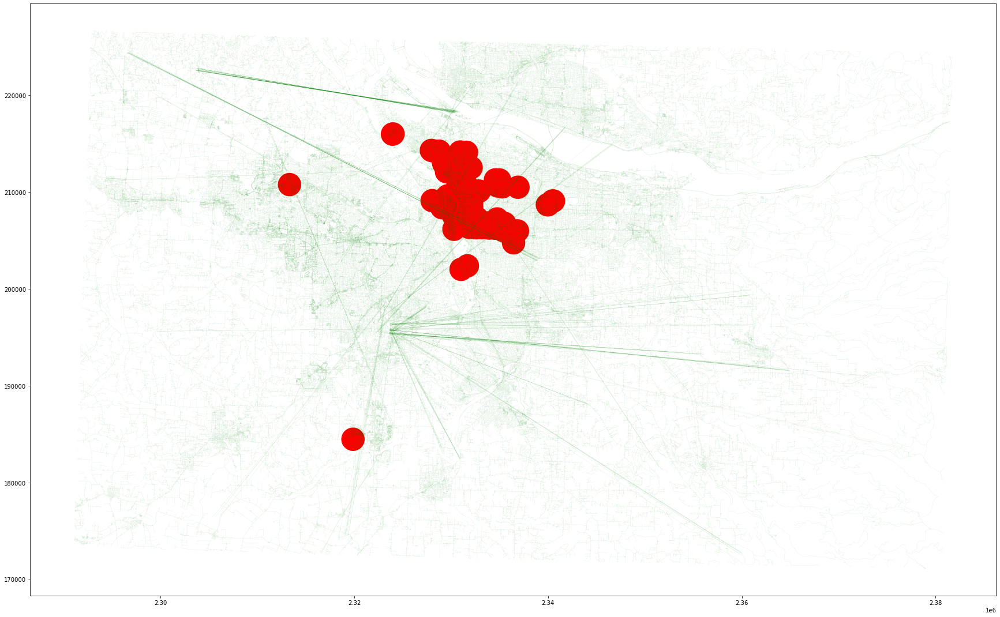

In [196]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
road_proj.plot(color="green",edgecolor='k',linewidth = 0.05,ax=ax) #Use your second dataframe

#Clip road file with buffer file

In [197]:
# Clip the data using GeoPandas clip
buffer_clip_road = gpd.clip(road_proj, gdf1)
buffer_clip_road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4440143,Northeast Hodes Street,None,residential,0,0,25.0,"LINESTRING (2313114.363 209795.929, 2313130.80..."
1,4440967,Northeast Butler Street,None,secondary,0,0,NaN,"LINESTRING (2312182.520 210710.249, 2312185.06..."
3,4443830,Northeast 85th Avenue,None,residential,0,0,25.0,"LINESTRING (2313220.539 210079.632, 2313218.92..."
4,4443836,Northeast Windstone Street,None,residential,0,0,25.0,"LINESTRING (2313381.281 210038.384, 2313371.72..."
5,4443837,Northeast Windstone Street,None,residential,0,0,25.0,"LINESTRING (2313218.921 210045.592, 2313139.35..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


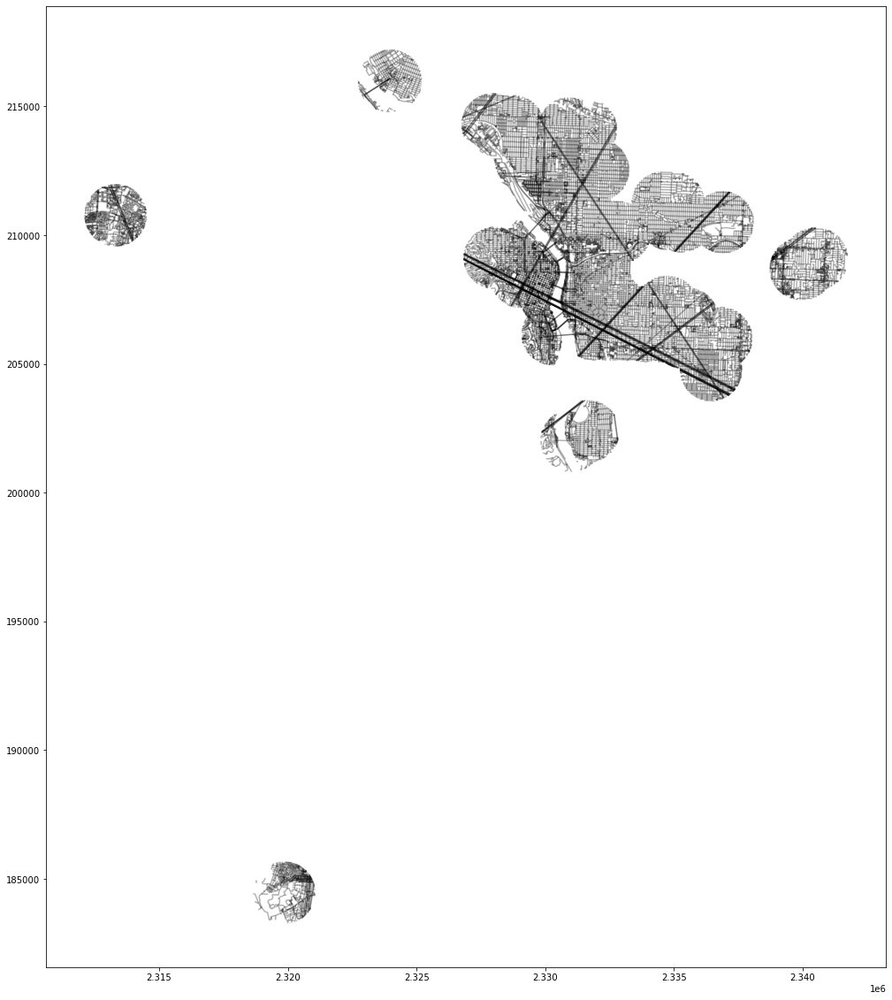

In [198]:
ax = buffer_clip_road.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

# Intersect

In [199]:
 inter_road=gpd.overlay(gdf1, buffer_clip_road, how='intersection', make_valid=True, keep_geom_type=False)
 inter_road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,681301893.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,689032191.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,NaN,322079535.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54..."
3,P009POR,Tilikum Crossing south side,permanent,2019,Portland,2.0,814.252817,59.301370,33.041096,5467.0,...,NaN,334030020.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54..."
4,P010POR,Tilikum Crossing north side,permanent,2019,Portland,1.0,842.195238,54.643836,32.301370,4860.0,...,NaN,334030006.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54..."


# Calculate the length of the road segments

In [200]:
inter_road["Length"]=inter_road["geometry"].length*3.28084 # in ft
inter_road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,osm_id_sensor,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,681301893.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54...",197.534201
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,689032191.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54...",197.534201
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,322079535.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54...",197.534201
3,P009POR,Tilikum Crossing south side,permanent,2019,Portland,2.0,814.252817,59.301370,33.041096,5467.0,...,334030020.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54...",197.534201
4,P010POR,Tilikum Crossing north side,permanent,2019,Portland,1.0,842.195238,54.643836,32.301370,4860.0,...,334030006.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54...",197.534201


# Aggregrate the road functional class

In [201]:
output_roadfc=inter_road.groupby(by=['osm_id_sensor','type'])['Length'].sum()
output_roadfc

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osm_id_sensor  type          
5516558.0      cycleway            779.975493
               footway           42894.417688
               motorway          12052.011473
               motorway_link      9075.453605
               path               6173.297808
                                     ...     
738967188.0    secondary_link      132.103624
               service           87485.231879
               steps               299.204088
               tertiary          38433.302730
               unclassified      80417.067859
Name: Length, Length: 1140, dtype: float64

# Calculate the primary road

In [202]:
primary= inter_road[inter_road['type'].str.contains('primary')]
output_primary=primary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_primary.columns=["osm_id","Primary"]
output_primary.head()

,osm_id,Primary
0,5516558.0,3963.431524
1,5522164.0,26156.566228
2,5527017.0,22739.946978
3,5528173.0,14258.262448
4,5529700.0,30514.415999


In [203]:
# Calculate secondary
secondary= inter_road[inter_road['type'].str.contains('secondary')]
output_secondary=secondary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_secondary.columns=["osm_id","Secondary"]
output_secondary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Secondary
0,5516558.0,31003.214280
1,5522164.0,52489.180521
2,5527017.0,11323.033371
3,5528173.0,54653.288257
4,5529700.0,19278.462838


In [204]:
# Calculate tertiary
tertiary= inter_road[inter_road['type'].str.contains('tertiary')]
output_tertiary=tertiary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_tertiary.columns=["osm_id","Tertiary"]
output_tertiary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Tertiary
0,5516558.0,18312.780803
1,5522164.0,105039.179005
2,5527017.0,20761.320301
3,5528173.0,76048.747873
4,5529700.0,23396.019582


In [205]:
# Calculate residential
residential= inter_road[inter_road['type'].str.contains('residential')]
output_residential= residential.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_residential.columns=["osm_id","Residential_Road"]
output_residential.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Residential_Road
0,5516558.0,179604.987360
1,5522164.0,202417.578585
2,5527017.0,184490.146614
3,5528173.0,25807.298835
4,5529700.0,128605.260080


In [206]:
# Calculate path
path= inter_road[inter_road['type'].str.contains('path')]
output_path= path.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_path.columns=["osm_id","Path"]
output_path.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Path
0,5516558.0,6173.297808
1,5522164.0,2792.850866
2,5527017.0,6772.175018
3,5528173.0,13474.869955
4,5529700.0,2221.661303


In [207]:
# calculate cycleway
# Calculate path
cycleway = inter_road[inter_road['type'].str.contains('cycleway')]
output_cycleway = cycleway .groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_cycleway.columns=["osm_id","Cycleway"] 
output_cycleway.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Cycleway
0,5516558.0,779.975493
1,5522164.0,1962.547412
2,5527017.0,307.935170
3,5528173.0,3339.227867
4,5529700.0,3465.701252


In [208]:
# Calculate footway
footway = inter_road[inter_road['type'].str.contains('footway')]
output_footway = footway .groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_footway.columns=["osm_id","Footway"] 
output_footway.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Footway
0,5516558.0,42894.417688
1,5522164.0,96191.157234
2,5527017.0,13607.832389
3,5528173.0,75920.362845
4,5529700.0,46219.837078


# Calculcate the mean Speed

In [209]:
# Exclude NAN and zero value first then take the mean
inter_road.maxspeed.describe()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count    40578.000000
mean        23.720119
std          6.963256
min          5.000000
25%         20.000000
50%         20.000000
75%         25.000000
max         55.000000
Name: maxspeed, dtype: float64

In [210]:
# Consider rows without NAN
inter_road1 = inter_road[inter_road['maxspeed'].notna()]
inter_road1.head(5) 

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,osm_id_sensor,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,681301893.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54...",197.534201
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,689032191.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54...",197.534201
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,322079535.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54...",197.534201
3,P009POR,Tilikum Crossing south side,permanent,2019,Portland,2.0,814.252817,59.301370,33.041096,5467.0,...,334030020.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54...",197.534201
4,P010POR,Tilikum Crossing north side,permanent,2019,Portland,1.0,842.195238,54.643836,32.301370,4860.0,...,334030006.0,5509099,Stadium Freeway,I 405,motorway,1,0,50.0,"LINESTRING (2329961.239 206616.593, 2329956.54...",197.534201


In [211]:
road_proj_type11=inter_road1 [inter_road1 ['type']=='primary']                          
road_proj_type22=inter_road1 [inter_road1 ['type']=='secondary']
road_proj_type33=inter_road1[inter_road1 ['type']=='tertiary']
road_proj_type44=inter_road1 [inter_road1 ['type']=='residential']
road_proj_type55=inter_road1 [inter_road1 ['type']=='path']
road_proj_type66=inter_road1 [inter_road1 ['type']=='cycleway']
road_proj_type77=inter_road1 [inter_road1 ['type']=='footway']
road_proj_types=pd.concat([road_proj_type11,road_proj_type22,road_proj_type33,road_proj_type44,road_proj_type55,road_proj_type66,road_proj_type77],axis=0).reset_index()
road_proj_types.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,index,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,...,osm_id_sensor,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,9,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,...,681301893.0,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
1,10,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,...,689032191.0,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
2,11,P010POR,Tilikum Crossing north side,permanent,2019,Portland,1.0,842.195238,54.643836,32.301370,...,334030006.0,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
3,46,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,...,681301893.0,5510504,Morrison Bridge,None,primary,1,1,35.0,"LINESTRING (2330370.942 208040.645, 2330349.50...",504.929052
4,47,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,...,689032191.0,5510504,Morrison Bridge,None,primary,1,1,35.0,"LINESTRING (2330370.942 208040.645, 2330349.50...",504.929052


In [212]:
# Then remove the rows with zero speed
inter_road2 = road_proj_types[road_proj_types.maxspeed != 0]
inter_road2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,index,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,...,osm_id_sensor,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,9,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,...,681301893.0,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
1,10,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,...,689032191.0,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
2,11,P010POR,Tilikum Crossing north side,permanent,2019,Portland,1.0,842.195238,54.643836,32.301370,...,334030006.0,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
3,46,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,...,681301893.0,5510504,Morrison Bridge,None,primary,1,1,35.0,"LINESTRING (2330370.942 208040.645, 2330349.50...",504.929052
4,47,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,...,689032191.0,5510504,Morrison Bridge,None,primary,1,1,35.0,"LINESTRING (2330370.942 208040.645, 2330349.50...",504.929052


In [213]:
# Now calculate the mean speed for each count location
output_meanspeed=inter_road2.groupby(by=['osm_id_sensor'])['maxspeed'].agg(pd.Series.mode).reset_index() # revised
output_meanspeed.columns=['osm_id','maxspeed']
output_meanspeed.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,maxspeed
0,5516558.0,20.0
1,5522164.0,20.0
2,5527017.0,20.0
3,5528173.0,20.0
4,5529700.0,20.0


# Calculate the point speed of the link over which count location exist, 
# Intersect or within or overlap function does not work for sjoin unless the count location exactly over the link, in that case zero results willl be produced. To avoid zero output, nearest link from count station has been claculated like ARcGIS spatial GISJOIN.

In [214]:
def min_distance_pline(point, line):
    return line.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [215]:
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218),2643.824523,1766.482889,3467.043478,1
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710),2034.205847,632.879498,3086.233635,3
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369),3179.337015,2134.229233,3802.769802,1
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073),2417.444765,2623.771633,3133.889048,4


In [216]:
road_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4440143,Northeast Hodes Street,None,residential,0,0,25.0,"LINESTRING (2313114.363 209795.929, 2313130.80..."
1,4440967,Northeast Butler Street,None,secondary,0,0,NaN,"LINESTRING (2312182.520 210710.249, 2312185.06..."
2,4441934,None,None,motorway_link,1,0,NaN,"LINESTRING (2315133.607 210977.179, 2315153.70..."
3,4443830,Northeast 85th Avenue,None,residential,0,0,25.0,"LINESTRING (2313220.539 210079.632, 2313218.92..."
4,4443836,Northeast Windstone Street,None,residential,0,0,25.0,"LINESTRING (2313381.281 210038.384, 2313371.72..."


In [217]:
print(road_proj.crs)
print(ecoshort.crs)

epsg:2838
epsg:2838


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [218]:
road_proj_type1=road_proj[road_proj['type']=='primary']                          
road_proj_type2=road_proj[road_proj['type']=='secondary']
road_proj_type3=road_proj[road_proj['type']=='tertiary']
road_proj_type4=road_proj[road_proj['type']=='residential']
road_proj_type5=road_proj[road_proj['type']=='path']
road_proj_type6=road_proj[road_proj['type']=='cycleway']
road_proj_type7=road_proj[road_proj['type']=='footway']
road_proj_type=pd.concat([road_proj_type1,road_proj_type2,road_proj_type3,road_proj_type4,road_proj_type5,road_proj_type6,road_proj_type7],axis=0).reset_index()
road_proj_type.head(5)

,index,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,20,4690136,Northwest Bethany Boulevard,None,primary,0,0,35.0,"LINESTRING (2317095.702 210007.374, 2317100.77..."
1,2885,5288409,Proctor Boulevard,US 26,primary,1,0,25.0,"LINESTRING (2362567.823 193771.422, 2362554.75..."
2,3074,5289540,Southeast Sunnyside Road,None,primary,1,0,40.0,"LINESTRING (2338449.854 198379.134, 2338466.66..."
3,3099,5289670,Southeast 1st Avenue,OR 99E,primary,0,0,35.0,"LINESTRING (2328190.079 179734.302, 2328248.65..."
4,3402,5290853,Pioneer Boulevard,US 26,primary,1,0,25.0,"LINESTRING (2361553.518 193797.982, 2361555.82..."


# In the below pline distance, you can see counter is located little far away from the link

In [219]:
#ecoshort['min_distance_pline'] = ecoshort.geometry.apply(min_distance_pline, args=(road_proj,))*3.28084
#ecoshort

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [220]:
#ecoshort.min_distance_pline.plot(xlabel="Index of Count ID",ylabel="Distance from count station to nearest link in ft")

# we need consider nearest distance link

# Remove the NAN and Zero speed link first from road shape file

In [221]:
road_proj1=road_proj_type[road_proj_type['maxspeed'].notna()]
road_proj2=road_proj1[road_proj1.maxspeed != 0]

In [222]:
#https://gis.stackexchange.com/questions/323884/performing-sjoin-on-polygons-and-lines-without-intersection-using-geopandas
def nearest_linestring(point, df_lines):
    idx = df_lines.geometry.distance(point).idxmin()
    return df_lines.loc[idx, 'maxspeed']

ecoshort['maxspeed'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj2)
ecoshort
ecoshort_speed=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [223]:
# Now merged with road shape file
#pt_speed=pd.merge(ecoshort_speed, road_proj2, right_on='osm_id', left_on='osm_id',how='inner')
pt_speed=ecoshort_speed
pt_speed.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1,30.0
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218),2643.824523,1766.482889,3467.043478,1,30.0
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710),2034.205847,632.879498,3086.233635,3,20.0
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369),3179.337015,2134.229233,3802.769802,1,25.0
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073),2417.444765,2623.771633,3133.889048,4,35.0


In [224]:
# Now merged with road shape file based on OSM ID
pt_speed_v1=pd.merge(ecoshort, road_proj2, right_on='osm_id', left_on='osm_id_sensor',how='inner')
pt_speed_v1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,maxspeed_x,index,osm_id,name,ref,type,oneway,bridge,maxspeed_y,geometry_y
0,P011POR,Sellwood Bridge both sides,permanent,2019,Portland,3.0,718.697055,102.698630,39.739726,4340.0,...,30.0,155581,595610339,Sellwood Bridge,None,secondary,0,1,30.0,"LINESTRING (2330654.382 202024.718, 2330989.65..."
1,S006POR,N SKIDMORE ST E of COLONIAL AVE,short-term,2019,Portland,1.0,134.760159,7.068493,3.616438,549.0,...,20.0,39594,44793234,North Skidmore Street,None,residential,0,0,20.0,"LINESTRING (2329632.635 212098.432, 2329623.96..."
2,S008POR,N VANCOUVER AVE N of JESSUP ST,short-term,2019,Portland,1.0,339.709004,56.397260,36.547945,3259.0,...,25.0,55175,117036270,North Vancouver Avenue,None,secondary,0,0,25.0,"LINESTRING (2330721.221 213096.257, 2330723.05..."
3,S009POR,N VANCOUVER AVE N of BEECH ST,short-term,2019,Portland,1.0,768.304797,101.191781,69.136986,4718.0,...,25.0,58402,121304231,North Vancouver Avenue,None,secondary,1,0,25.0,"LINESTRING (2330753.755 212262.771, 2330754.81..."
4,S015POR,N WILLAMETTE BLVD E of CONCORD AVE,short-term,2019,Portland,1.0,138.862015,10.671233,6.041096,642.0,...,20.0,60930,124809863,North Willamette Boulevard,None,residential,0,0,20.0,"LINESTRING (2329653.278 212904.664, 2329647.35..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

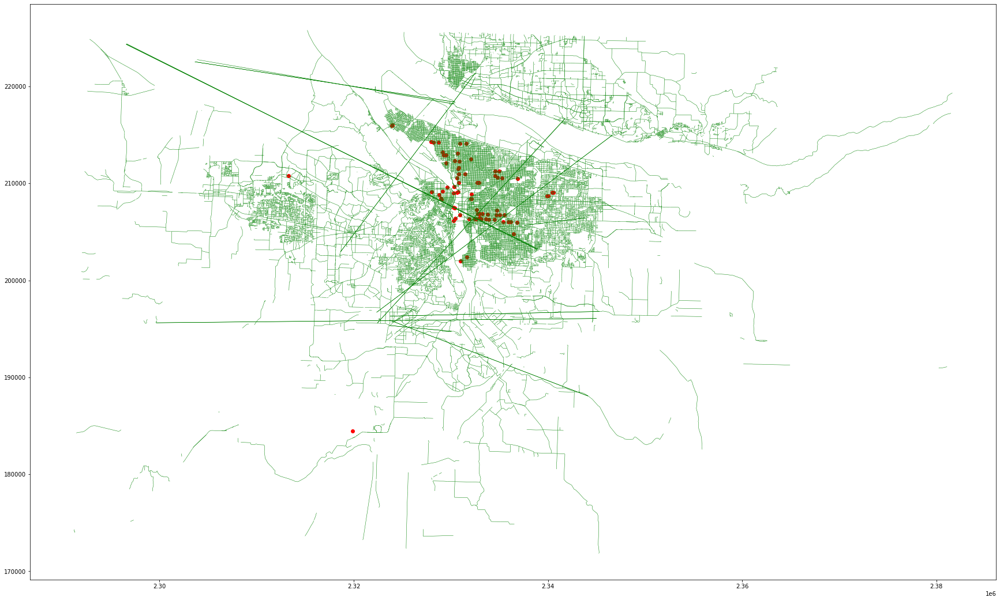

In [225]:
fig, ax = plt.subplots(figsize = (30,25)) 
ecoshort.plot(ax=ax,color="red")
road_proj2.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

In [226]:
# Now calculate the mean speed for each count location
output_pointspeed=pt_speed.groupby(by=['osm_id_sensor'])['maxspeed'].mean().reset_index()
output_pointspeed.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,maxspeed
0,5516558.0,20.0
1,5522164.0,20.0
2,5527017.0,20.0
3,5528173.0,20.0
4,5529700.0,20.0


In [227]:
output_pointspeed.columns=["osm_id","Point Speed"]
output_pointspeed.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Point Speed
0,5516558.0,20.0
1,5522164.0,20.0
2,5527017.0,20.0
3,5528173.0,20.0
4,5529700.0,20.0


In [228]:
pt_speed_v1.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['site_id', 'site_name', 'sensor_type', 'year', 'region',
       'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb', 'stl_raw',
       'latitude', 'longitude', 'comment', 'osm_id_sensor', 'geometry_x',
       'min_dist_to_school', 'min_dist_to_college', 'min_dist_to_university',
       'lanes', 'maxspeed_x', 'index', 'osm_id', 'name', 'ref', 'type',
       'oneway', 'bridge', 'maxspeed_y', 'geometry_y'],
      dtype='object')

In [229]:
# Now calculate the mean speed for each count location
output_pointspeed_v2=pt_speed_v1.groupby(by=['osm_id_sensor'])['maxspeed_x'].mean().reset_index()
output_pointspeed_v2.columns=['osm_id','maxspeed']
output_pointspeed_v2

,osm_id,maxspeed
0,5516558.0,20.0
1,5522164.0,20.0
2,5527017.0,20.0
3,5529700.0,20.0
4,5529833.0,20.0
...,...,...
61,595610339.0,30.0
62,603080294.0,20.0
63,644432836.0,20.0
64,711588457.0,20.0


# Calculate the road type underneath of count station

In [230]:
# Keep only functional class of road that we considered in our study to create catagorical varaibale

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [231]:
road_proj_type1=road_proj[road_proj['type']=='primary']                          
road_proj_type2=road_proj[road_proj['type']=='secondary']
road_proj_type3=road_proj[road_proj['type']=='tertiary']
road_proj_type4=road_proj[road_proj['type']=='residential']
road_proj_type5=road_proj[road_proj['type']=='path']
road_proj_type6=road_proj[road_proj['type']=='cycleway']
road_proj_type7=road_proj[road_proj['type']=='footway']
road_proj_type=pd.concat([road_proj_type1,road_proj_type2,road_proj_type3,road_proj_type4,road_proj_type5,road_proj_type6,road_proj_type7],axis=0).reset_index()
road_proj_type.head(5)

,index,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,20,4690136,Northwest Bethany Boulevard,None,primary,0,0,35.0,"LINESTRING (2317095.702 210007.374, 2317100.77..."
1,2885,5288409,Proctor Boulevard,US 26,primary,1,0,25.0,"LINESTRING (2362567.823 193771.422, 2362554.75..."
2,3074,5289540,Southeast Sunnyside Road,None,primary,1,0,40.0,"LINESTRING (2338449.854 198379.134, 2338466.66..."
3,3099,5289670,Southeast 1st Avenue,OR 99E,primary,0,0,35.0,"LINESTRING (2328190.079 179734.302, 2328248.65..."
4,3402,5290853,Pioneer Boulevard,US 26,primary,1,0,25.0,"LINESTRING (2361553.518 193797.982, 2361555.82..."


In [232]:
#def nearest_linestring(point, df_lines):
#    idx = df_lines.geometry.distance(point).idxmin()
#    return df_lines.loc[idx, 'type']

#ecoshort['type'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj_type)
#ecoshort
#ecoshort_rt=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [233]:
ecoshort.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1,30.0
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218),2643.824523,1766.482889,3467.043478,1,30.0
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710),2034.205847,632.879498,3086.233635,3,20.0
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369),3179.337015,2134.229233,3802.769802,1,25.0
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073),2417.444765,2623.771633,3133.889048,4,35.0


In [234]:
# Now merged with road shape file
#road_merged_inner=pd.merge(ecoshort, road_proj_type, right_on='osm_id', left_on='osm_id_sensor',how='inner')
#road_merged_inner.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [235]:
road_merged_inner = pd.merge(left=road_proj_type, right=ecoshort, left_on='osm_id', right_on='osm_id_sensor',how='inner')
road_merged_inner.head()

,index,osm_id,name,ref,type,oneway,bridge,maxspeed_x,geometry_x,site_id,...,latitude,longitude,comment,osm_id_sensor,geometry_y,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed_y
0,42186,68675284,Southeast Division Street,None,secondary,0,0,25.0,"LINESTRING (2332821.361 206471.644, 2332829.96...",S110POR,...,45.504805,-122.637820,NaN,68675284.0,POINT (2332960.554 206468.431),470.471947,4786.492292,8594.807810,2,25.0
1,55175,117036270,North Vancouver Avenue,None,secondary,0,0,25.0,"LINESTRING (2330721.221 213096.257, 2330723.05...",S008POR,...,45.564030,-122.668759,NaN,117036270.0,POINT (2330720.418 213112.386),1444.642366,1382.043785,8406.000426,2,25.0
2,55225,117058378,North Williams Avenue,None,secondary,1,0,25.0,"LINESTRING (2330829.907 210952.363, 2330830.06...",S019POR,...,45.544762,-122.666653,NaN,117058378.0,POINT (2330827.324 210967.414),1818.557023,2247.895856,7034.133660,1,25.0
3,57736,119626782,Southeast Holgate Boulevard,None,secondary,0,0,25.0,"LINESTRING (2336062.627 204775.021, 2336076.60...",S119POR,...,45.490253,-122.592801,NaN,119626782.0,POINT (2336435.450 204759.696),1702.892541,6643.707784,5857.130556,2,25.0
4,58402,121304231,North Vancouver Avenue,None,secondary,1,0,25.0,"LINESTRING (2330753.755 212262.771, 2330754.81...",S009POR,...,45.549663,-122.667964,NaN,121304231.0,POINT (2330739.559 211514.587),434.674853,747.073930,8347.377606,1,25.0


In [236]:
# First identify the closest link from count station
#https://gis.stackexchange.com/questions/323884/performing-sjoin-on-polygons-and-lines-without-intersection-using-geopandas
#def nearest_linestring(point, df_lines):
#    idx = df_lines.geometry.distance(point).idxmin()
#    return df_lines.loc[idx, 'osm_id']

#ecoshort['osm_id'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj_type)
#ecoshort


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [237]:
# Now merge with road shape file with OSM ID
#closest_road_type=pd.merge(ecoshort, road_proj_type, right_on='osm_id', left_on='osm_id',how='inner')
#closest_road_type
road_merged_inner.columns


Index(['index', 'osm_id', 'name', 'ref', 'type', 'oneway', 'bridge',
       'maxspeed_x', 'geometry_x', 'site_id', 'site_name', 'sensor_type',
       'year', 'region', 'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb',
       'stl_raw', 'latitude', 'longitude', 'comment', 'osm_id_sensor',
       'geometry_y', 'min_dist_to_school', 'min_dist_to_college',
       'min_dist_to_university', 'lanes', 'maxspeed_y'],
      dtype='object')

In [238]:
pt_road_type1=road_merged_inner.loc[:,['osm_id_sensor','type']]
pt_road_type1.columns=['osm_id','road_type']
pt_road_type1.head()

,osm_id,road_type
0,68675284.0,secondary
1,117036270.0,secondary
2,117058378.0,secondary
3,119626782.0,secondary
4,121304231.0,secondary


# Convert this road catagory to binary as follows- yes=1 or No=0

In [239]:
import numpy as np
pt_road_type1['primary_binary'] = np.where(pt_road_type1['road_type'] == 'primary', 1, 0)
pt_road_type1['secondary_binary'] = np.where(pt_road_type1['road_type'] == 'secondary', 1, 0)
pt_road_type1['tertiary_binary'] = np.where(pt_road_type1['road_type'] == 'tertiary', 1, 0)
pt_road_type1['residential_binary'] = np.where(pt_road_type1['road_type'] == 'residential', 1, 0)
pt_road_type1['path_binary'] = np.where(pt_road_type1['road_type'] == 'path', 1, 0)
pt_road_type1['cycleway_binary'] = np.where(pt_road_type1['road_type'] == 'cycleway', 1, 0)
pt_road_type1['footway_binary'] = np.where(pt_road_type1['road_type'] == 'footway', 1, 0)
pt_road_type1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,road_type,primary_binary,secondary_binary,tertiary_binary,residential_binary,path_binary,cycleway_binary,footway_binary
0,68675284.0,secondary,0,1,0,0,0,0,0
1,117036270.0,secondary,0,1,0,0,0,0,0
2,117058378.0,secondary,0,1,0,0,0,0,0
3,119626782.0,secondary,0,1,0,0,0,0,0
4,121304231.0,secondary,0,1,0,0,0,0,0


In [240]:
pt_road_type2=pt_road_type1.drop(['road_type'],axis=1)
pt_road_type2.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,primary_binary,secondary_binary,tertiary_binary,residential_binary,path_binary,cycleway_binary,footway_binary
0,68675284.0,0,1,0,0,0,0,0
1,117036270.0,0,1,0,0,0,0,0
2,117058378.0,0,1,0,0,0,0,0
3,119626782.0,0,1,0,0,0,0,0
4,121304231.0,0,1,0,0,0,0,0


# Calculate the Bridges

In [241]:
bridge=inter_road.copy()
output_bridge=bridge.groupby(by=['osm_id_sensor'])['bridge'].sum().reset_index()
# Convert binary, presence of bridge=1, absence of bridge=0
output_bridge.loc[output_bridge['bridge'] > 0, 'bridge'] = 1
output_bridge.loc[output_bridge['bridge'] ==0, 'bridge'] = 2
output_bridge.columns=['osm_id','bridge']
output_bridge.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,bridge
0,5516558.0,1
1,5522164.0,1
2,5527017.0,1
3,5528173.0,1
4,5529700.0,1


# Calculate the bridge from spatial join of count location and bridge line shape file

In [242]:
bridge_only=road_proj
bridge_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4440143,Northeast Hodes Street,None,residential,0,0,25.0,"LINESTRING (2313114.363 209795.929, 2313130.80..."
1,4440967,Northeast Butler Street,None,secondary,0,0,NaN,"LINESTRING (2312182.520 210710.249, 2312185.06..."
2,4441934,None,None,motorway_link,1,0,NaN,"LINESTRING (2315133.607 210977.179, 2315153.70..."
3,4443830,Northeast 85th Avenue,None,residential,0,0,25.0,"LINESTRING (2313220.539 210079.632, 2313218.92..."
4,4443836,Northeast Windstone Street,None,residential,0,0,25.0,"LINESTRING (2313381.281 210038.384, 2313371.72..."


In [243]:
#count_station
bridge_only.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['osm_id', 'name', 'ref', 'type', 'oneway', 'bridge', 'maxspeed',
       'geometry'],
      dtype='object')

In [244]:
# Join count location file with road file
pointInline_bridge =pd.merge (left=ecoshort, right=bridge_only, left_on='osm_id_sensor', right_on='osm_id',how='inner')
pointInline_bridge.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,lanes,maxspeed_x,osm_id,name,ref,type,oneway,bridge,maxspeed_y,geometry_y
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,1,30.0,681301893,Hawthorne Bridge,None,path,1,1,NaN,"LINESTRING (2330281.659 207530.108, 2330221.70..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,1,30.0,689032191,Hawthorne Bridge,None,path,1,1,NaN,"LINESTRING (2330344.692 207484.622, 2330595.40..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,3,20.0,322079535,Moody Avenue Trail,None,cycleway,0,0,NaN,"LINESTRING (2330145.157 206550.752, 2330146.79..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,1,25.0,348027806,Steel Bridge (Lower Deck),None,path,0,1,NaN,"LINESTRING (2330613.617 209069.830, 2330643.78..."
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,...,4,35.0,126306263,Broadway Bridge,None,path,0,1,NaN,"LINESTRING (2330370.694 209687.108, 2330368.55..."


In [245]:
# Join by OSM ID
#pointInline_bridge_v2 = pd.merge(left=bridge_only, right=count_station, left_on='osm_id', right_on='OSM_ID',how='inner')
#pointInline_bridge_v2


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [246]:
output_point_bridge=pointInline_bridge.groupby(by=['osm_id_sensor'])['bridge'].sum().reset_index()
output_point_bridge.head()

,osm_id_sensor,bridge
0,5516558.0,0
1,5522164.0,0
2,5527017.0,0
3,5528173.0,0
4,5529700.0,0


In [247]:
output_point_bridge.loc[output_point_bridge['bridge'] > 0, 'bridge'] = 1
output_point_bridge.loc[output_point_bridge['bridge'] ==0, 'bridge'] = 2
output_point_bridge.columns=["osm_id","Point Bridge"]
output_point_bridge.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Point Bridge
0,5516558.0,2
1,5522164.0,2
2,5527017.0,2
3,5528173.0,2
4,5529700.0,2


# Calculate the Distance from count station to land use:Distance to water body, Distance to park,Distance to green space area,Distance to commercial,Distance to industrial area,Distance to residential area ,Distance to Retail area,Distance to Residential area



# Distance to park

In [248]:
def min_distance_ppoly(point, polygon):
    return polygon.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [249]:
nature_proj1.head(5)

,osm_id,name,type,geometry
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [250]:
park_only=nature_proj1[nature_proj1['type'].str.contains('park')]
park_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
12,23226226,Library Green,park,"POLYGON ((2319865.876 204453.857, 2319873.163 ..."
13,23226227,Beaverton City Park,park,"POLYGON ((2319708.428 204481.909, 2319719.794 ..."
14,23226241,Griffith Park,park,"POLYGON ((2320515.779 204636.197, 2320514.297 ..."
15,23240422,Memorial Park,park,"POLYGON ((2319733.467 204299.410, 2319712.112 ..."
16,23240423,Little People's Park,park,"POLYGON ((2320831.119 204315.002, 2320831.315 ..."


In [251]:
ecoshort.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1,30.0
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218),2643.824523,1766.482889,3467.043478,1,30.0
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710),2034.205847,632.879498,3086.233635,3,20.0
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369),3179.337015,2134.229233,3802.769802,1,25.0
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073),2417.444765,2623.771633,3133.889048,4,35.0


In [252]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(park_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1,30.0,97.697772
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218),2643.824523,1766.482889,3467.043478,1,30.0,574.500142
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710),2034.205847,632.879498,3086.233635,3,20.0,1302.850450
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369),3179.337015,2134.229233,3802.769802,1,25.0,467.515595
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,...,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073),2417.444765,2623.771633,3133.889048,4,35.0,2114.651376


In [253]:
Park_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
Park_distance1.columns=["osm_id","Distance to Park"]
Park_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Park
0,681301893.0,97.697772
1,689032191.0,574.500142
2,322079535.0,1302.850450
3,348027806.0,467.515595
4,126306263.0,2114.651376


# cc distance to park

In [254]:
parkcc=park_only.copy()
parkcc['geometry']=parkcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(parkcc,))*3.28084
parkcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
parkcc_distance1.columns=["osm_id","Distance to Park Center"]
parkcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Park Center
0,681301893.0,868.584865
1,689032191.0,1213.522753
2,322079535.0,1541.411058
3,348027806.0,570.304916
4,126306263.0,2314.894907


# Distance to water body

In [255]:
water_only=nature_proj1[nature_proj1['type'].str.contains('water')]
water_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [256]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(water_only,))*3.28084
ecoshort.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1,30.0,258.894732
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218),2643.824523,1766.482889,3467.043478,1,30.0,590.738915
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710),2034.205847,632.879498,3086.233635,3,20.0,4480.744001
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369),3179.337015,2134.229233,3802.769802,1,25.0,83.806994
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,...,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073),2417.444765,2623.771633,3133.889048,4,35.0,817.075286


In [257]:
water_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
water_distance1.columns=["osm_id","Distance to Water Body"]
water_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Water Body
0,681301893.0,258.894732
1,689032191.0,590.738915
2,322079535.0,4480.744001
3,348027806.0,83.806994
4,126306263.0,817.075286


In [258]:
watercc=water_only.copy()
watercc['geometry']=watercc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(watercc,))*3.28084
watercc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
watercc_distance1.columns=["osm_id","Distance to Water Center"]
watercc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Water Center
0,681301893.0,571.366084
1,689032191.0,956.582365
2,322079535.0,4502.384829
3,348027806.0,1140.061341
4,126306263.0,836.271055


# Distance To  Forest

In [259]:
forest_only=nature_proj1[nature_proj1['type'].str.contains('forest')]
forest_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
7,4951160,McGuire Island,forest,"POLYGON ((2345349.066 212653.673, 2345219.613 ..."
8,4951161,None,forest,"POLYGON ((2347473.712 212397.505, 2347482.688 ..."
9,4951163,Ackerman Island,forest,"POLYGON ((2346387.798 214226.327, 2346493.014 ..."
10,4951565,East Island,forest,"POLYGON ((2331173.062 203544.184, 2331139.233 ..."
11,23225779,None,forest,"POLYGON ((2319223.438 206118.306, 2319202.631 ..."


In [260]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(forest_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1,30.0,127.540051
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218),2643.824523,1766.482889,3467.043478,1,30.0,550.680550
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710),2034.205847,632.879498,3086.233635,3,20.0,2370.339193
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369),3179.337015,2134.229233,3802.769802,1,25.0,467.515595
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,...,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073),2417.444765,2623.771633,3133.889048,4,35.0,1065.995386


In [261]:
forest_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
forest_distance1.columns=["osm_id","Distance to forest"]
forest_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to forest
0,681301893.0,127.540051
1,689032191.0,550.680550
2,322079535.0,2370.339193
3,348027806.0,467.515595
4,126306263.0,1065.995386


In [262]:
forestcc=forest_only.copy()
forestcc['geometry']=forestcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(forestcc,))*3.28084
forestcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
forestcc_distance1.columns=["osm_id","Distance to Forest Center"]
forestcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Forest Center
0,681301893.0,206.968342
1,689032191.0,608.632949
2,322079535.0,2825.732463
3,348027806.0,523.170259
4,126306263.0,1100.164174


# Distance to green space area

In [263]:
grass_only=luse_proj[luse_proj['type'].str.contains('grass')]
grass_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
1,24000302,None,grass,"POLYGON ((2316254.380 207136.871, 2316258.462 ..."
96,36796200,None,grass,"POLYGON ((2331010.097 209484.287, 2331026.737 ..."
109,39412221,None,grass,"POLYGON ((2330760.060 210843.431, 2330814.337 ..."
120,40775705,None,grass,"POLYGON ((2331120.983 207412.715, 2331139.760 ..."
125,40941298,None,grass,"POLYGON ((2330792.988 211074.076, 2330815.557 ..."


In [264]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(grass_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.672840,NaN,681301893.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1,30.0,451.154853
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.671210,NaN,689032191.0,POINT (2330377.291 207469.218),2643.824523,1766.482889,3467.043478,1,30.0,927.089801
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,-122.671970,NaN,322079535.0,POINT (2330282.541 206154.710),2034.205847,632.879498,3086.233635,3,20.0,597.567548
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,-122.668311,NaN,348027806.0,POINT (2330647.392 209090.369),3179.337015,2134.229233,3802.769802,1,25.0,867.160108
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,...,-122.672270,NaN,126306263.0,POINT (2330353.308 209658.073),2417.444765,2623.771633,3133.889048,4,35.0,179.512458


In [265]:
grass_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
grass_distance1.columns=["osm_id","Distance to Grass"]
grass_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Grass
0,681301893.0,451.154853
1,689032191.0,927.089801
2,322079535.0,597.567548
3,348027806.0,867.160108
4,126306263.0,179.512458


In [266]:
grasscc=grass_only.copy()
grasscc['geometry']=grasscc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(grasscc,))*3.28084
grasscc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
grasscc_distance1.columns=["osm_id","Distance to Grass Center"]
grasscc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Grass Center
0,681301893.0,583.039213
1,689032191.0,1061.413738
2,322079535.0,977.304200
3,348027806.0,919.150373
4,126306263.0,294.336200


# Distance to commercial

In [267]:
commercial_only=luse_proj[luse_proj['type'].str.contains('commercial')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(commercial_only,))*3.28084
commercial_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
commercial_distance1.columns=["osm_id","Distance to Commercial Area"]
commercial_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Commercial Area
0,681301893.0,503.745112
1,689032191.0,954.762189
2,322079535.0,1835.617509
3,348027806.0,901.853051
4,126306263.0,402.593918


In [268]:
commercialcc=commercial_only.copy()
commercialcc['geometry']=commercialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(commercialcc,))*3.28084
commercialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
commercialcc_distance1.columns=["osm_id","Distance to Commercial Area Center"]
commercialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Commercial Area Center
0,681301893.0,704.845087
1,689032191.0,1095.460141
2,322079535.0,1932.118410
3,348027806.0,1634.295526
4,126306263.0,1032.069286


# Distance to industrial area

In [269]:
industrial_only=luse_proj[luse_proj['type'].str.contains('industrial')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(industrial_only,))*3.28084
industrial_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
industrial_distance1.columns=["osm_id","Distance to Industrial Area"]
industrial_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Industrial Area
0,681301893.0,50.004558
1,689032191.0,15.282872
2,322079535.0,297.246675
3,348027806.0,2422.594005
4,126306263.0,1018.596857


In [270]:
industrialcc=industrial_only.copy()
industrialcc['geometry']=industrialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(industrialcc,))*3.28084
industrialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
industrialcc_distance1.columns=["osm_id","Distance to Industrial Center"]
industrialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Industrial Center
0,681301893.0,2484.305831
1,689032191.0,2066.164020
2,322079535.0,791.769971
3,348027806.0,2755.843751
4,126306263.0,1455.399632


# Distance to Retail area

In [271]:
retail_only=luse_proj[luse_proj['type'].str.contains('retail')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(retail_only,))*3.28084
retail_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
retail_distance1.columns=["osm_id","Distance to Retail Area"]
retail_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Retail Area
0,681301893.0,1490.068155
1,689032191.0,1935.000214
2,322079535.0,3027.603724
3,348027806.0,3324.026602
4,126306263.0,3854.192433


In [272]:
retailcc=retail_only.copy()
retailcc['geometry']=retailcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(retailcc,))*3.28084
retailcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
retailcc_distance1.columns=["osm_id","Distance to Retail Center"]
retailcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Retail Center
0,681301893.0,1819.318379
1,689032191.0,2261.026551
2,322079535.0,3221.420050
3,348027806.0,3787.053696
4,126306263.0,4224.844583


# Distance to Residential

In [273]:
residential_only=luse_proj[luse_proj['type'].str.contains('residential')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(residential_only,))*3.28084
residential_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
residential_distance1.columns=["osm_id","Distance to Residential Area"]
residential_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Residential Area
0,681301893.0,1622.460588
1,689032191.0,1550.302056
2,322079535.0,271.703041
3,348027806.0,680.133539
4,126306263.0,1001.602483


In [274]:
residentialcc=residential_only.copy()
residentialcc['geometry']=residentialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(residentialcc,))*3.28084
residentialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
residentialcc_distance1.columns=["osm_id","Distance to Residential Center"]
residentialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Residential Center
0,681301893.0,1900.519490
1,689032191.0,1919.730423
2,322079535.0,376.347778
3,348027806.0,1382.627569
4,126306263.0,1356.833372


# Import the OSM Building file and use Portland City Hall as the CBD, then calculate the distance from CBD

In [275]:
building1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,23514070,Sunset Transit Center,parking,"POLYGON ((-122.78303 45.51060, -122.78200 45.5..."
1,23514323,East Parking Structure,parking,"POLYGON ((-122.77210 45.50937, -122.77066 45.5..."
2,23515081,Smart Park,parking,"POLYGON ((-122.68201 45.51988, -122.68217 45.5..."
3,24635906,Moda Center,None,"POLYGON ((-122.66696 45.53237, -122.66709 45.5..."
4,25667453,DoubleTree,hotel,"POLYGON ((-122.65520 45.53118, -122.65516 45.5..."


In [276]:
# Reproject the geometries by replacing the values with projected ones
bld_proj = building1.to_crs(epsg=2838)
bld_proj.head(10)
bld_proj1=bld_proj.loc[(bld_proj.name=='Portland City Hall')]
bld_proj1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
5979,141453089,Portland City Hall,public,"POLYGON ((2329750.752 207701.308, 2329755.095 ..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

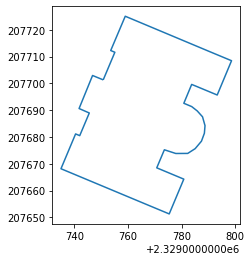

In [277]:
bld_proj1.geometry.boundary.plot()

In [278]:
# copy GeoDataFrame
bld_proj2 = bld_proj1.copy()
# change geometry 
bld_proj2['geometry'] = bld_proj2['geometry'].centroid
bld_proj2

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
5979,141453089,Portland City Hall,public,POINT (2329765.806 207688.570)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

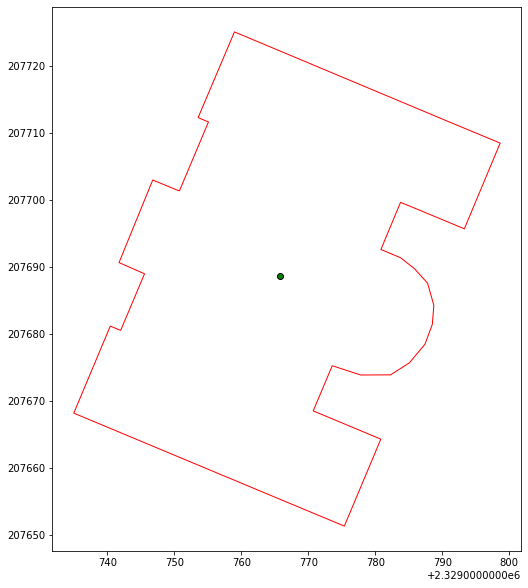

In [279]:
fig, ax = plt.subplots(figsize = (15,10)) 
bld_proj2.plot(ax=ax,color="green",edgecolor='k')
bld_proj1.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 1,ax=ax) #Use your second dataframe

In [280]:
# Calculate the distance from CBD to all count locations
ecoshort['min_dist_to_CBD'] = ecoshort.geometry.apply(min_distance_ppoly, args=(bld_proj2,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon,min_dist_to_CBD
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,681301893.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1,30.0,1900.519490,1663.773880
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,689032191.0,POINT (2330377.291 207469.218),2643.824523,1766.482889,3467.043478,1,30.0,1919.730423,2131.359291
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,NaN,322079535.0,POINT (2330282.541 206154.710),2034.205847,632.879498,3086.233635,3,20.0,376.347778,5310.242787
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,NaN,348027806.0,POINT (2330647.392 209090.369),3179.337015,2134.229233,3802.769802,1,25.0,1382.627569,5432.971395
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,...,NaN,126306263.0,POINT (2330353.308 209658.073),2417.444765,2623.771633,3133.889048,4,35.0,1356.833372,6742.982602


In [281]:
CBD_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_CBD']]
CBD_distance1.columns=["osm_id","Distance to CBD"]
CBD_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to CBD
0,681301893.0,1663.773880
1,689032191.0,2131.359291
2,322079535.0,5310.242787
3,348027806.0,5432.971395
4,126306263.0,6742.982602


# End of Distance calculation

# Now write coding for socio-demographic variable extraction

1. Population density
2. Employment density
3. Household Density
4. Number of students (student access)
5. Median age
6. Percentage of female
7. Percentage of male
8. Percentage of African American population
9. Percentage of white population
10. Median Household Income
11. Education (% of population having at least college education)

In [282]:
# Read the Block group 
#bg=gpd.read_file("../input/oregon-sd-data/OR_blck_grp_2017.shp")
bg.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,+44.5468040,-118.1781784,G41000109501001,323465.419044,2.219823e+09,"POLYGON ((-1737359.842 1029170.395, -1737338.7..."
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,+44.9562277,-118.0519082,G41000109501002,109051.976354,1.927024e+08,"POLYGON ((-1712627.242 1038313.861, -1712879.9..."
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,+44.8443756,-118.0396603,G41000109501003,140639.998011,4.730286e+08,"POLYGON ((-1712321.712 1019131.259, -1712275.9..."
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,+44.7764594,-117.8821056,G41000109502001,22860.454690,1.469017e+07,"POLYGON ((-1712969.088 1014304.981, -1712991.9..."
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,+44.7753666,-117.8349670,G41000109502002,4878.558266,1.009497e+06,"POLYGON ((-1709338.523 1011818.662, -1709343.2..."


In [283]:
bg.shape

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(2627, 16)

In [284]:
print(bg.crs)

PROJCS["USA_Contiguous_Albers_Equal_Area_Conic",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433],AUTHORITY["EPSG","4269"]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",37.5],PARAMETER["longitude_of_center",-96],PARAMETER["standard_parallel_1",29.5],PARAMETER["standard_parallel_2",45.5],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["ESRI","102003"]]


In [285]:
from geopandas import GeoDataFrame
from shapely.geometry import Point
import shapely.wkt
bg["wktcolumn"]= bg.apply(lambda row:row['geometry'].wkt, axis=1)
bg
geometry = bg['wktcolumn'].map(shapely.wkt.loads)
bg1 = bg.drop('wktcolumn', axis=1)
bg2 = gpd.GeoDataFrame(bg1, crs='esri:102003', geometry=geometry)
bg2.head(5)

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,+44.5468040,-118.1781784,G41000109501001,323465.419044,2.219823e+09,"POLYGON ((-1737359.842 1029170.395, -1737338.7..."
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,+44.9562277,-118.0519082,G41000109501002,109051.976354,1.927024e+08,"POLYGON ((-1712627.242 1038313.861, -1712879.9..."
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,+44.8443756,-118.0396603,G41000109501003,140639.998011,4.730286e+08,"POLYGON ((-1712321.712 1019131.259, -1712275.9..."
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,+44.7764594,-117.8821056,G41000109502001,22860.454690,1.469017e+07,"POLYGON ((-1712969.088 1014304.981, -1712991.9..."
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,+44.7753666,-117.8349670,G41000109502002,4878.558266,1.009497e+06,"POLYGON ((-1709338.523 1011818.662, -1709343.2..."


In [286]:
# set the co-ordinate system first
#bg2 = bg.set_crs("EPSG:102003")

#bg2 = gpd.GeoSeries(bg['geometry'], crs={'init': 'epsg:102003'})

# Let's take a copy of our layer
bg_proj = bg2.copy()

# Reproject the geometries by replacing the values with projected ones
bg_proj = bg_proj.to_crs('epsg:2838')
bg_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,+44.5468040,-118.1781784,G41000109501001,323465.419044,2.219823e+09,"POLYGON ((2679731.350 136865.451, 2679752.280 ..."
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,+44.9562277,-118.0519082,G41000109501002,109051.976354,1.927024e+08,"POLYGON ((2701277.965 152087.049, 2701093.604 ..."
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,+44.8443756,-118.0396603,G41000109501003,140639.998011,4.730286e+08,"POLYGON ((2706558.268 133671.514, 2706650.307 ..."
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,+44.7764594,-117.8821056,G41000109502001,22860.454690,1.469017e+07,"POLYGON ((2707186.724 128851.700, 2707187.625 ..."
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,+44.7753666,-117.8349670,G41000109502002,4878.558266,1.009497e+06,"POLYGON ((2711345.513 127396.863, 2711346.377 ..."


In [287]:
bg_proj["Total block Area"]=bg_proj.area
bg_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry,Total block Area
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,+44.5468040,-118.1781784,G41000109501001,323465.419044,2.219823e+09,"POLYGON ((2679731.350 136865.451, 2679752.280 ...",2.219628e+09
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,+44.9562277,-118.0519082,G41000109501002,109051.976354,1.927024e+08,"POLYGON ((2701277.965 152087.049, 2701093.604 ...",1.926638e+08
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,+44.8443756,-118.0396603,G41000109501003,140639.998011,4.730286e+08,"POLYGON ((2706558.268 133671.514, 2706650.307 ...",4.729412e+08
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,+44.7764594,-117.8821056,G41000109502001,22860.454690,1.469017e+07,"POLYGON ((2707186.724 128851.700, 2707187.625 ...",1.468767e+07
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,+44.7753666,-117.8349670,G41000109502002,4878.558266,1.009497e+06,"POLYGON ((2711345.513 127396.863, 2711346.377 ...",1.009327e+06


In [288]:
#race=pd.read_csv("../input/oregon-sd-data/race.csv")
race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,AHY2M001,AHY2M002,AHY2M003,AHY2M004,AHY2M005,AHY2M006,AHY2M007,AHY2M008,AHY2M009,AHY2M010
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,167,149,38,11,10,8,12,7,12,7
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,163,162,12,14,2,8,3,7,2,7
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,159,159,29,13,12,12,53,16,7,14
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,222,215,12,42,12,12,12,12,12,12
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,237,188,36,12,57,12,150,7,12,7


In [289]:
race1=pd.merge(bg_proj, race, left_on='GISJOIN', right_on='GISJOIN', how='left')
race1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AHY2M001,AHY2M002,AHY2M003,AHY2M004,AHY2M005,AHY2M006,AHY2M007,AHY2M008,AHY2M009,AHY2M010
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,167,149,38,11,10,8,12,7,12,7
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,163,162,12,14,2,8,3,7,2,7
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,159,159,29,13,12,12,53,16,7,14
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,222,215,12,42,12,12,12,12,12,12
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,237,188,36,12,57,12,150,7,12,7


In [290]:
race2=race1[['INTPTLAT','INTPTLON','GISJOIN','Shape_Leng','Shape_Area','geometry','AHY2E001','AHY2E002','AHY2E003','Total block Area']]
race2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry,AHY2E001,AHY2E002,AHY2E003,Total block Area
0,+44.5468040,-118.1781784,G41000109501001,323465.419044,2.219823e+09,"POLYGON ((2679731.350 136865.451, 2679752.280 ...",950,903,25,2.219628e+09
1,+44.9562277,-118.0519082,G41000109501002,109051.976354,1.927024e+08,"POLYGON ((2701277.965 152087.049, 2701093.604 ...",908,884,0,1.926638e+08
2,+44.8443756,-118.0396603,G41000109501003,140639.998011,4.730286e+08,"POLYGON ((2706558.268 133671.514, 2706650.307 ...",1128,1016,23,4.729412e+08
3,+44.7764594,-117.8821056,G41000109502001,22860.454690,1.469017e+07,"POLYGON ((2707186.724 128851.700, 2707187.625 ...",1097,1060,0,1.468767e+07
4,+44.7753666,-117.8349670,G41000109502002,4878.558266,1.009497e+06,"POLYGON ((2711345.513 127396.863, 2711346.377 ...",1103,912,25,1.009327e+06


In [291]:
#race2["Total block Area"]=race2.area
#race2

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [292]:
# Clip the data using GeoPandas clip
buffer_clip_race = gpd.clip(race2, gdf1)
buffer_clip_race.head(5)

,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry,AHY2E001,AHY2E002,AHY2E003,Total block Area
118,+45.4525394,-122.6449935,G41000500208001,7947.156241,2.807504e+06,"MULTIPOLYGON (((2331403.033 201319.847, 233143...",1298,1196,24,2.806990e+06
213,+45.3073391,-122.7901266,G41000500227072,10139.591050,4.876213e+06,"POLYGON ((2321048.472 184352.876, 2321020.183 ...",4485,3635,84,4.875222e+06
214,+45.2913819,-122.8329019,G41000500227081,24953.269741,2.884283e+07,"POLYGON ((2319551.270 185498.842, 2319499.574 ...",1305,1283,0,2.883694e+07
215,+45.2947851,-122.7868599,G41000500227082,8297.301679,2.887761e+06,"POLYGON ((2319305.737 183394.471, 2319315.846 ...",3144,2629,155,2.887171e+06
1557,+45.4880680,-122.6678070,G41005100001001,10117.531751,4.084607e+06,"MULTIPOLYGON (((2331134.240 206149.403, 233113...",847,698,0,4.083884e+06


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


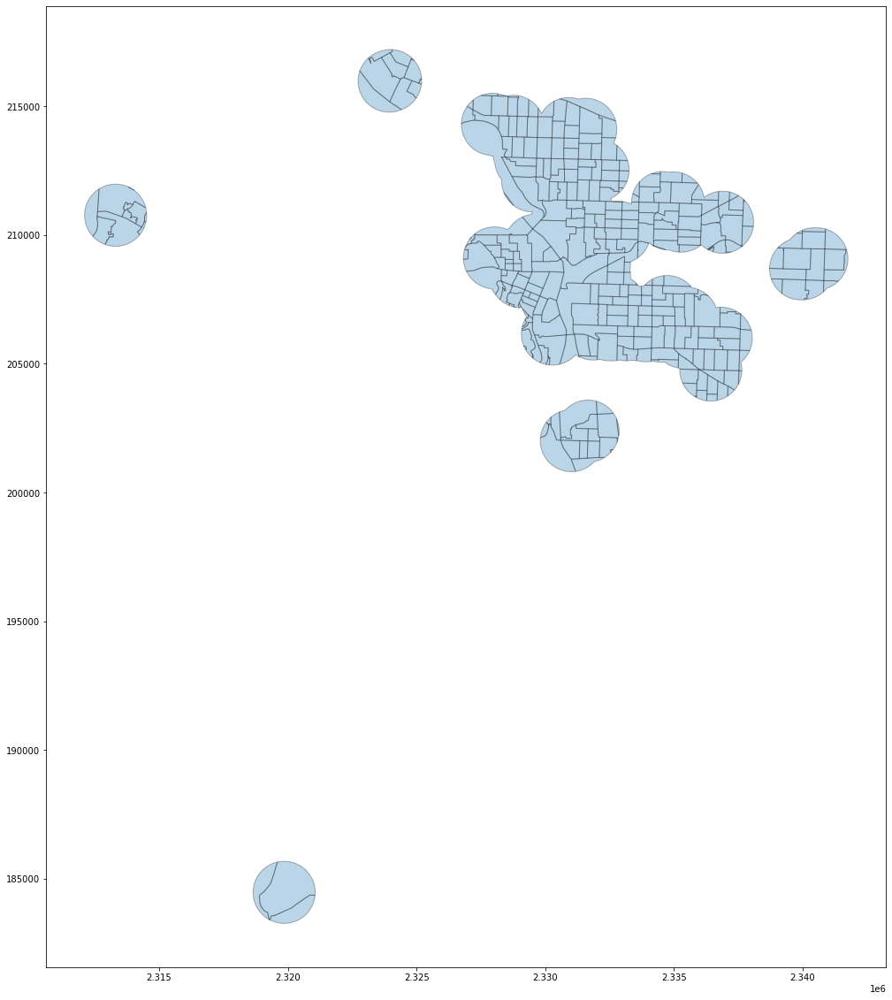

In [293]:
ax = buffer_clip_race.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [294]:
 inter_race=gpd.overlay(gdf1, buffer_clip_race, how='intersection', make_valid=True, keep_geom_type=False)
 inter_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,AHY2E001,AHY2E002,AHY2E003,Total block Area,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,+45.5125924,-122.6623125,G41005100011011,6400.749248,1.420914e+06,693,551,80,1.420669e+06,"POLYGON ((2331453.098 207425.766, 2331439.364 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,+45.5125924,-122.6623125,G41005100011011,6400.749248,1.420914e+06,693,551,80,1.420669e+06,"POLYGON ((2331578.487 207350.911, 2331575.234 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,+45.5125924,-122.6623125,G41005100011011,6400.749248,1.420914e+06,693,551,80,1.420669e+06,"POLYGON ((2330518.017 207338.526, 2330632.917 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,+45.5125924,-122.6623125,G41005100011011,6400.749248,1.420914e+06,693,551,80,1.420669e+06,"POLYGON ((2331317.970 208086.779, 2331216.372 ..."
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,+45.5125924,-122.6623125,G41005100011011,6400.749248,1.420914e+06,693,551,80,1.420669e+06,"MULTIPOLYGON (((2331296.860 208081.023, 233118..."


In [295]:
inter_race["buffered area"]=inter_race.area
inter_race['area factor']=inter_race['buffered area']/inter_race["Total block Area"]
inter_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,GISJOIN,Shape_Leng,Shape_Area,AHY2E001,AHY2E002,AHY2E003,Total block Area,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,G41005100011011,6400.749248,1.420914e+06,693,551,80,1.420669e+06,"POLYGON ((2331453.098 207425.766, 2331439.364 ...",1.033517e+06,0.727486
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,G41005100011011,6400.749248,1.420914e+06,693,551,80,1.420669e+06,"POLYGON ((2331578.487 207350.911, 2331575.234 ...",1.166500e+06,0.821092
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,G41005100011011,6400.749248,1.420914e+06,693,551,80,1.420669e+06,"POLYGON ((2330518.017 207338.526, 2330632.917 ...",4.443474e+05,0.312773
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,G41005100011011,6400.749248,1.420914e+06,693,551,80,1.420669e+06,"POLYGON ((2331317.970 208086.779, 2331216.372 ...",8.927341e+04,0.062839
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,G41005100011011,6400.749248,1.420914e+06,693,551,80,1.420669e+06,"MULTIPOLYGON (((2331296.860 208081.023, 233118...",6.816246e+04,0.047979


In [296]:
output_pct_race= inter_race.loc[:, ['osm_id_sensor', 'AHY2E001','AHY2E002','AHY2E003','area factor']]
output_pct_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY2E001,AHY2E002,AHY2E003,area factor
0,681301893.0,693,551,80,0.727486
1,689032191.0,693,551,80,0.821092
2,322079535.0,693,551,80,0.312773
3,348027806.0,693,551,80,0.062839
4,156121087.0,693,551,80,0.047979


In [297]:
output_pct_race.iloc[:, 1:4] = output_pct_race.iloc[:, 1:4].mul(output_pct_race['area factor'],axis=0)
output_pct_race=output_pct_race.drop(['area factor'],axis=1)
output_pct_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY2E001,AHY2E002,AHY2E003
0,681301893.0,504.147796,400.844784,58.198880
1,689032191.0,569.016823,452.421745,65.687368
2,322079535.0,216.751924,172.338110,25.021867
3,348027806.0,43.547416,34.624280,5.027119
4,156121087.0,33.249533,26.436497,3.838330


# Aggregate by ID

In [298]:
output_pct_race=output_pct_race.groupby('osm_id_sensor', as_index=False).sum()
output_pct_race.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY2E001,AHY2E002,AHY2E003
0,5516558.0,12238.608312,9622.350219,1148.139408
1,5522164.0,26766.632219,21660.978916,1041.009083
2,5527017.0,12823.598219,9260.606606,2183.355486
3,5528173.0,16991.148505,14203.657851,723.766718
4,5529700.0,12789.688390,8493.014121,1135.433128


# Percentange of White and African American

In [299]:
# Calculate percentage of white and percentage of Black or African American 
output_pct_race['pct_white']=(output_pct_race['AHY2E002']/output_pct_race['AHY2E001'])*100
output_pct_race['pct_African_American']=(output_pct_race['AHY2E003']/output_pct_race['AHY2E001'])*100
output_pct_race.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY2E001,AHY2E002,AHY2E003,pct_white,pct_African_American
0,5516558.0,12238.608312,9622.350219,1148.139408,78.622912,9.381291
1,5522164.0,26766.632219,21660.978916,1041.009083,80.925306,3.889205
2,5527017.0,12823.598219,9260.606606,2183.355486,72.215352,17.026075
3,5528173.0,16991.148505,14203.657851,723.766718,83.594454,4.259669
4,5529700.0,12789.688390,8493.014121,1135.433128,66.405168,8.877723


In [300]:
output_pct_race1=output_pct_race.drop(['AHY2E001','AHY2E002','AHY2E003'],axis=1)
output_pct_race1.columns=['osm_id','pct_white','pct_African_American']
output_pct_race1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_white,pct_African_American
0,5516558.0,78.622912,9.381291
1,5522164.0,80.925306,3.889205
2,5527017.0,72.215352,17.026075
3,5528173.0,83.594454,4.259669
4,5529700.0,66.405168,8.877723


# Percentage of Male and Female

In [301]:
#gender=pd.read_csv("../input/oregon-sd-data/age by sex.csv")
gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,AHYQM040,AHYQM041,AHYQM042,AHYQM043,AHYQM044,AHYQM045,AHYQM046,AHYQM047,AHYQM048,AHYQM049
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,18,28,15,15,13,11,11,12,15,11
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,9,25,15,18,9,42,28,25,3,8
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,12,41,28,36,15,26,22,12,38,15
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,27,40,26,35,31,24,23,29,12,12
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,11,21,12,40,30,20,15,12,31,12


In [302]:
gender1=pd.merge(bg_proj, gender, left_on='GISJOIN', right_on='GISJOIN', how='left')
gender1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AHYQM040,AHYQM041,AHYQM042,AHYQM043,AHYQM044,AHYQM045,AHYQM046,AHYQM047,AHYQM048,AHYQM049
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,18,28,15,15,13,11,11,12,15,11
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,9,25,15,18,9,42,28,25,3,8
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,12,41,28,36,15,26,22,12,38,15
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,27,40,26,35,31,24,23,29,12,12
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,11,21,12,40,30,20,15,12,31,12


In [303]:
# Clip the data using GeoPandas clip
buffer_clip_gender = gpd.clip(gender1, gdf1)
buffer_clip_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AHYQM040,AHYQM041,AHYQM042,AHYQM043,AHYQM044,AHYQM045,AHYQM046,AHYQM047,AHYQM048,AHYQM049
118,41,005,020800,1,410050208001,Block Group 1,G5030,S,2531081.0,276423.0,...,40,47,14,51,29,29,40,49,15,15
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,68,71,43,35,24,38,52,24,28,3
214,41,005,022708,1,410050227081,Block Group 1,G5030,S,28072623.0,770203.0,...,41,36,19,34,28,16,44,18,17,12
215,41,005,022708,2,410050227082,Block Group 2,G5030,S,2632601.0,255160.0,...,46,29,31,42,11,24,37,46,28,19
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,43,12,24,33,37,12,24,12,12,12


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


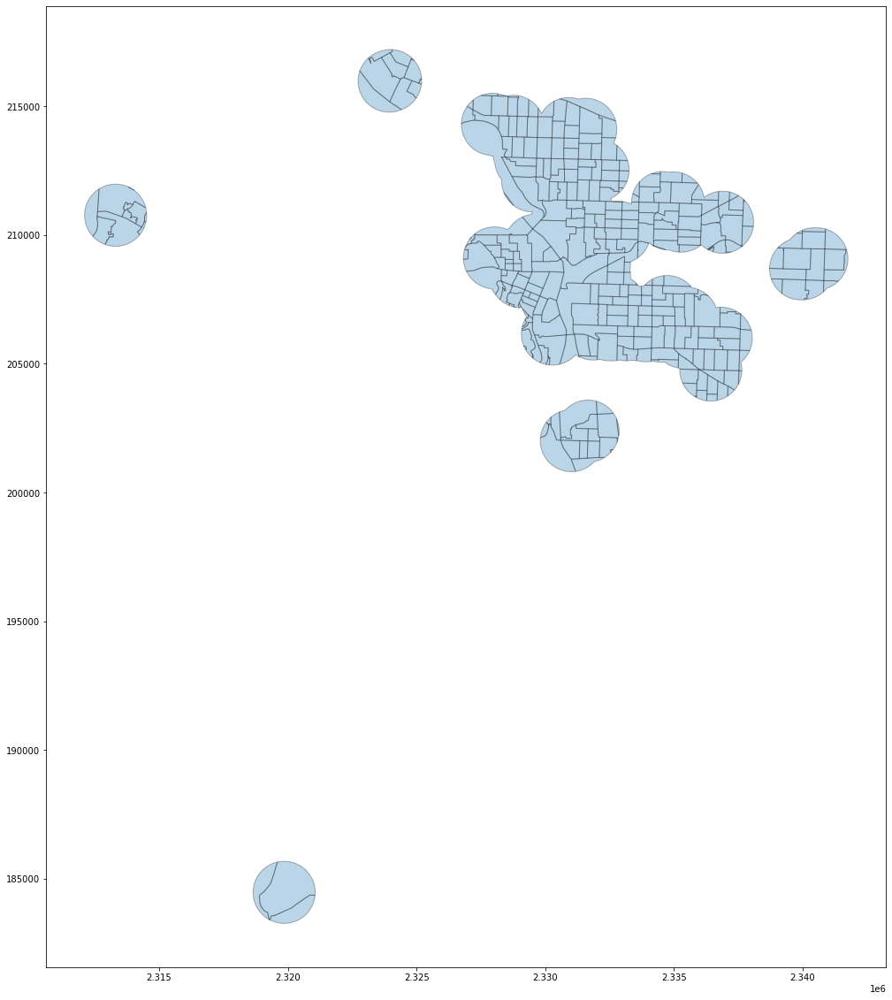

In [304]:
ax = buffer_clip_gender.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [305]:
 inter_gender=gpd.overlay(gdf1, buffer_clip_gender, how='intersection', make_valid=True, keep_geom_type=False)
 inter_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AHYQM041,AHYQM042,AHYQM043,AHYQM044,AHYQM045,AHYQM046,AHYQM047,AHYQM048,AHYQM049,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,29,12,12,12,13,16,12,12,12,"POLYGON ((2331453.098 207425.766, 2331439.364 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,29,12,12,12,13,16,12,12,12,"POLYGON ((2331578.487 207350.911, 2331575.234 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,29,12,12,12,13,16,12,12,12,"POLYGON ((2330518.017 207338.526, 2330632.917 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,29,12,12,12,13,16,12,12,12,"POLYGON ((2331317.970 208086.779, 2331216.372 ..."
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,29,12,12,12,13,16,12,12,12,"MULTIPOLYGON (((2331296.860 208081.023, 233118..."


In [306]:
inter_gender["buffered area"]=inter_gender.area
inter_gender['area factor']=inter_gender['buffered area']/inter_gender["Total block Area"]
inter_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AHYQM043,AHYQM044,AHYQM045,AHYQM046,AHYQM047,AHYQM048,AHYQM049,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,13,16,12,12,12,"POLYGON ((2331453.098 207425.766, 2331439.364 ...",1.033517e+06,0.727486
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,13,16,12,12,12,"POLYGON ((2331578.487 207350.911, 2331575.234 ...",1.166500e+06,0.821092
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,12,12,13,16,12,12,12,"POLYGON ((2330518.017 207338.526, 2330632.917 ...",4.443474e+05,0.312773
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,12,12,13,16,12,12,12,"POLYGON ((2331317.970 208086.779, 2331216.372 ...",8.927341e+04,0.062839
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,12,12,13,16,12,12,12,"MULTIPOLYGON (((2331296.860 208081.023, 233118...",6.816246e+04,0.047979


In [307]:
#'AHYQE001',=total, 'AHYQE002'=male,AHYQE026=female
gender_filter=inter_gender.loc[:, ['osm_id_sensor', 'AHYQE001', 'AHYQE002', 'AHYQE026','area factor']]
gender_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHYQE001,AHYQE002,AHYQE026,area factor
0,681301893.0,693,467,226,0.727486
1,689032191.0,693,467,226,0.821092
2,322079535.0,693,467,226,0.312773
3,348027806.0,693,467,226,0.062839
4,156121087.0,693,467,226,0.047979


In [308]:
gender_filter.iloc[:, 1:4] = gender_filter.iloc[:, 1:4].mul(gender_filter['area factor'],axis=0)
gender_filter=gender_filter.drop(['area factor'],axis=1)
gender_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHYQE001,AHYQE002,AHYQE026
0,681301893.0,504.147796,339.735960,164.411835
1,689032191.0,569.016823,383.450009,185.566814
2,322079535.0,216.751924,146.065150,70.686775
3,348027806.0,43.547416,29.345806,14.201610
4,156121087.0,33.249533,22.406251,10.843282


In [309]:
# Aggregate by ID
output_pct_gender=gender_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pct_gender.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHYQE001,AHYQE002,AHYQE026
0,5516558.0,12238.608312,6164.884359,6073.723953
1,5522164.0,26766.632219,13987.349357,12779.282862
2,5527017.0,12823.598219,6248.449989,6575.148230
3,5528173.0,16991.148505,9024.411174,7966.737331
4,5529700.0,12789.688390,6167.691697,6621.996693


In [310]:
# Calculate percentage of white and percentage of Black or African American 
output_pct_gender['pct_male']=(output_pct_gender['AHYQE002']/output_pct_gender['AHYQE001'])*100
output_pct_gender['pct_female']=(output_pct_gender['AHYQE026']/output_pct_gender['AHYQE001'])*100
output_pct_gender.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHYQE001,AHYQE002,AHYQE026,pct_male,pct_female
0,5516558.0,12238.608312,6164.884359,6073.723953,50.372430,49.627570
1,5522164.0,26766.632219,13987.349357,12779.282862,52.256665,47.743335
2,5527017.0,12823.598219,6248.449989,6575.148230,48.726183,51.273817
3,5528173.0,16991.148505,9024.411174,7966.737331,53.112426,46.887574
4,5529700.0,12789.688390,6167.691697,6621.996693,48.223940,51.776060


In [311]:
output_pct_gender1=output_pct_gender.drop(['AHYQE001','AHYQE002','AHYQE026'],axis=1)
output_pct_gender1.columns=['osm_id','pct_male','pct_female']
output_pct_gender1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_male,pct_female
0,5516558.0,50.372430,49.627570
1,5522164.0,52.256665,47.743335
2,5527017.0,48.726183,51.273817
3,5528173.0,53.112426,46.887574
4,5529700.0,48.223940,51.776060


# Number of Student (student access) and Education (pct of at least college education population)

In [312]:
#edu=pd.read_csv("../input/oregon-sd-data/education.csv")
edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,AH04M016,AH04M017,AH04M018,AH04M019,AH04M020,AH04M021,AH04M022,AH04M023,AH04M024,AH04M025
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,21,57,17,24,66,29,26,13,12,3
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,10,61,19,35,53,38,23,41,11,2
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,23,45,41,35,76,37,72,43,22,27
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,36,63,23,58,30,92,90,36,30,22
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,12,98,34,46,66,24,87,23,14,12


In [313]:
edu1=pd.merge(bg_proj, edu, left_on='GISJOIN', right_on='GISJOIN', how='left')
edu1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AH04M016,AH04M017,AH04M018,AH04M019,AH04M020,AH04M021,AH04M022,AH04M023,AH04M024,AH04M025
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,21,57,17,24,66,29,26,13,12,3
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,10,61,19,35,53,38,23,41,11,2
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,23,45,41,35,76,37,72,43,22,27
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,36,63,23,58,30,92,90,36,30,22
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,12,98,34,46,66,24,87,23,14,12


In [314]:
# Clip the data using GeoPandas clip
buffer_clip_edu = gpd.clip(edu1, gdf1)
buffer_clip_edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AH04M016,AH04M017,AH04M018,AH04M019,AH04M020,AH04M021,AH04M022,AH04M023,AH04M024,AH04M025
118,41,005,020800,1,410050208001,Block Group 1,G5030,S,2531081.0,276423.0,...,15,48,12,64,78,51,98,104,25,21
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,12,102,60,62,232,72,182,128,62,52
214,41,005,022708,1,410050227081,Block Group 1,G5030,S,28072623.0,770203.0,...,10,92,12,38,55,31,121,38,19,12
215,41,005,022708,2,410050227082,Block Group 2,G5030,S,2632601.0,255160.0,...,12,64,43,57,73,98,187,154,43,33
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,12,40,34,12,56,19,141,74,29,31


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


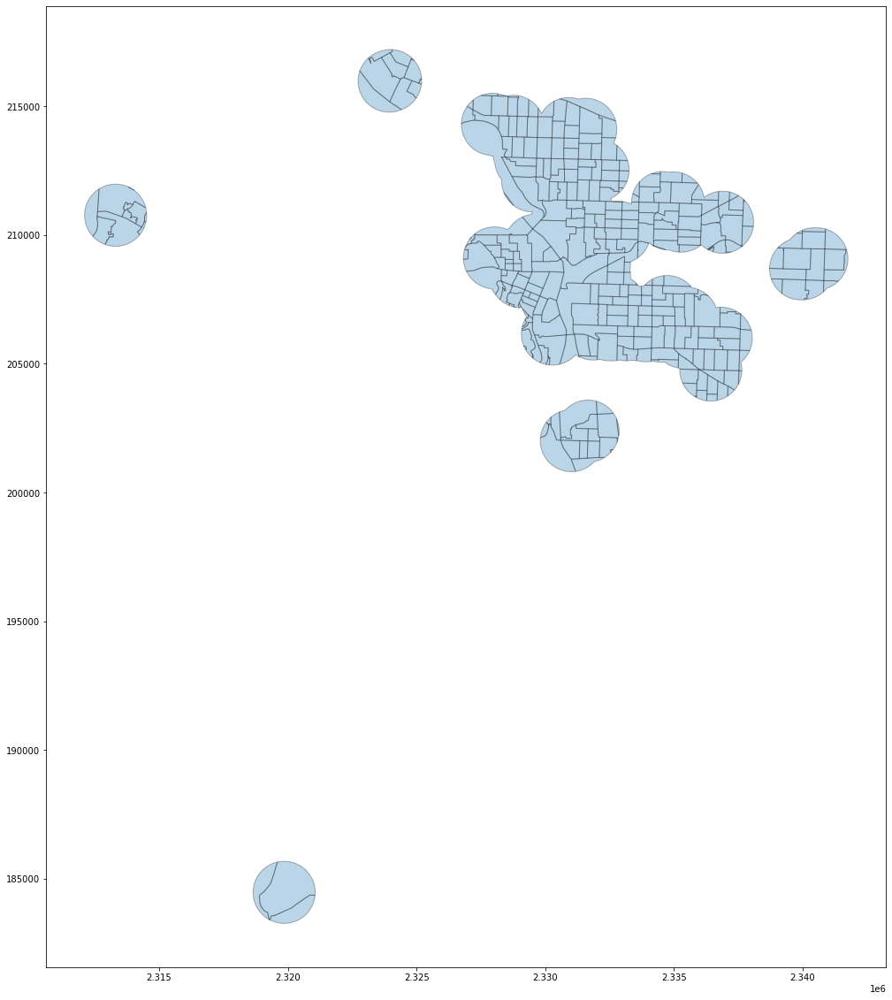

In [315]:
ax = buffer_clip_edu.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [316]:
inter_edu=gpd.overlay(gdf1, buffer_clip_edu, how='intersection', make_valid=True, keep_geom_type=False)
inter_edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AH04M017,AH04M018,AH04M019,AH04M020,AH04M021,AH04M022,AH04M023,AH04M024,AH04M025,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,82,42,42,60,38,59,25,12,12,"POLYGON ((2331453.098 207425.766, 2331439.364 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,82,42,42,60,38,59,25,12,12,"POLYGON ((2331578.487 207350.911, 2331575.234 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,82,42,42,60,38,59,25,12,12,"POLYGON ((2330518.017 207338.526, 2330632.917 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,82,42,42,60,38,59,25,12,12,"POLYGON ((2331317.970 208086.779, 2331216.372 ..."
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,82,42,42,60,38,59,25,12,12,"MULTIPOLYGON (((2331296.860 208081.023, 233118..."


In [317]:
inter_edu["buffered area"]=inter_edu.area
inter_edu['area factor']=inter_edu['buffered area']/inter_edu["Total block Area"]
inter_edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AH04M019,AH04M020,AH04M021,AH04M022,AH04M023,AH04M024,AH04M025,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,42,60,38,59,25,12,12,"POLYGON ((2331453.098 207425.766, 2331439.364 ...",1.033517e+06,0.727486
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,42,60,38,59,25,12,12,"POLYGON ((2331578.487 207350.911, 2331575.234 ...",1.166500e+06,0.821092
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,42,60,38,59,25,12,12,"POLYGON ((2330518.017 207338.526, 2330632.917 ...",4.443474e+05,0.312773
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,42,60,38,59,25,12,12,"POLYGON ((2331317.970 208086.779, 2331216.372 ...",8.927341e+04,0.062839
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,42,60,38,59,25,12,12,"MULTIPOLYGON (((2331296.860 208081.023, 233118...",6.816246e+04,0.047979


In [318]:
# AH04E001,=total, AH04E019:    Some college, less than 1 year
#AH04E020:    Some college, 1 or more years, no degree
#        AH04E021:    Associate's degree
#        AH04E022:    Bachelor's degree
#        AH04E023:    Master's degree
#        AH04E024:    Professional school degree
#        AH04E025:    Doctorate degree

edu_filter=inter_edu.loc[:, ['osm_id_sensor', 'AH04E001', 'AH04E019','AH04E020','AH04E021', 'AH04E022','AH04E023','AH04E024','AH04E025','area factor']]
edu_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH04E001,AH04E019,AH04E020,AH04E021,AH04E022,AH04E023,AH04E024,AH04E025,area factor
0,681301893.0,647,54,143,49,137,24,0,0,0.727486
1,689032191.0,647,54,143,49,137,24,0,0,0.821092
2,322079535.0,647,54,143,49,137,24,0,0,0.312773
3,348027806.0,647,54,143,49,137,24,0,0,0.062839
4,156121087.0,647,54,143,49,137,24,0,0,0.047979


In [319]:
edu_filter.iloc[:, 1:9] = edu_filter.iloc[:, 1:9].mul(edu_filter['area factor'],axis=0)
edu_filter=edu_filter.drop(['area factor'],axis=1)
edu_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH04E001,AH04E019,AH04E020,AH04E021,AH04E022,AH04E023,AH04E024,AH04E025
0,681301893.0,470.683440,39.284244,104.030498,35.646814,99.665582,17.459664,0.0,0.0
1,689032191.0,531.246586,44.338973,117.416170,40.233513,112.489617,19.706210,0.0,0.0
2,322079535.0,202.364351,16.889760,44.726588,15.325894,42.849948,7.506560,0.0,0.0
3,348027806.0,40.656823,3.393305,8.985975,3.079110,8.608941,1.508136,0.0,0.0
4,156121087.0,31.042493,2.590873,6.861015,2.350977,6.573140,1.151499,0.0,0.0


In [320]:
# Aggregate by ID
output_pct_edu=edu_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pct_edu.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH04E001,AH04E019,AH04E020,AH04E021,AH04E022,AH04E023,AH04E024,AH04E025
0,5516558.0,9445.464325,529.629715,1683.908273,622.373459,3353.054556,1127.925967,285.485277,154.531431
1,5522164.0,22578.850242,1092.751231,3232.473283,1150.141499,8730.366938,3670.221766,1090.480607,896.413918
2,5527017.0,9926.663052,609.470914,1516.406450,658.572030,3222.023096,1328.792909,289.445405,205.141586
3,5528173.0,15177.736071,690.182749,2144.479120,999.943826,5602.324079,2756.438999,882.233792,371.477685
4,5529700.0,8978.285172,501.591208,1647.082613,1091.018568,1574.869413,428.293048,86.744544,29.756708


# Number of students 

In [321]:
scll.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
0,G41000109501001,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,4,5,18,12,12,14,12,4,12,130
1,G41000109501002,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,17,18,5,12,12,7,12,12,10,116
2,G41000109501003,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,16,21,11,12,7,21,7,21,18,168
3,G41000109502001,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,6,73,46,22,23,12,11,30,37,153
4,G41000109502002,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,18,12,12,53,12,40,53,12,178


Table 1:     School Enrollment by Detailed Level of School for the Population 3 Years and Over
    Universe:    Population 3 years and over
    Source code: B14007
    NHGIS code:  ALV5
        ALV5E001:    Total
        ALV5E002:    Enrolled in school
        ALV5E003:    Enrolled in school: Enrolled in nursery school, preschool
        ALV5E004:    Enrolled in school: Enrolled in kindergarten
        ALV5E005:    Enrolled in school: Enrolled in grade 1
        ALV5E006:    Enrolled in school: Enrolled in grade 2
        ALV5E007:    Enrolled in school: Enrolled in grade 3
        ALV5E008:    Enrolled in school: Enrolled in grade 4
        ALV5E009:    Enrolled in school: Enrolled in grade 5
        ALV5E010:    Enrolled in school: Enrolled in grade 6
        ALV5E011:    Enrolled in school: Enrolled in grade 7
        ALV5E012:    Enrolled in school: Enrolled in grade 8
        ALV5E013:    Enrolled in school: Enrolled in grade 9
        ALV5E014:    Enrolled in school: Enrolled in grade 10
        ALV5E015:    Enrolled in school: Enrolled in grade 11
        ALV5E016:    Enrolled in school: Enrolled in grade 12
        ALV5E017:    Enrolled in school: Enrolled in college, undergraduate years
        ALV5E018:    Enrolled in school: Graduate or professional school
        ALV5E019:    Not enrolled in school

In [322]:
scl1=pd.merge(bg_proj, scll, left_on='GISJOIN', right_on='GISJOIN', how='left')
scl1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,4,5,18,12,12,14,12,4,12,130
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,17,18,5,12,12,7,12,12,10,116
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,16,21,11,12,7,21,7,21,18,168
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,6,73,46,22,23,12,11,30,37,153
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,12,18,12,12,53,12,40,53,12,178


In [323]:
# Clip the data using GeoPandas clip
buffer_clip_scl = gpd.clip(scl1, gdf1)
buffer_clip_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
118,41,005,020800,1,410050208001,Block Group 1,G5030,S,2531081.0,276423.0,...,12,13,16,12,12,25,25,37,108,197
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,95,31,30,96,33,36,31,110,57,343
214,41,005,022708,1,410050227081,Block Group 1,G5030,S,28072623.0,770203.0,...,51,21,29,12,41,12,47,44,12,273
215,41,005,022708,2,410050227082,Block Group 2,G5030,S,2632601.0,255160.0,...,28,41,36,12,39,21,47,71,47,196
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,48,12,29,12,34,12,12,35,29,163


In [324]:
inter_scl=gpd.overlay(gdf1, buffer_clip_scl, how='intersection', make_valid=True, keep_geom_type=False)
inter_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,12,12,12,12,57,34,166,"POLYGON ((2331453.098 207425.766, 2331439.364 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,12,12,12,57,34,166,"POLYGON ((2331578.487 207350.911, 2331575.234 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,12,12,12,12,12,12,57,34,166,"POLYGON ((2330518.017 207338.526, 2330632.917 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,12,12,12,12,12,12,57,34,166,"POLYGON ((2331317.970 208086.779, 2331216.372 ..."
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,12,12,12,12,12,12,57,34,166,"MULTIPOLYGON (((2331296.860 208081.023, 233118..."


In [325]:
inter_scl["buffered area"]=inter_scl.area
inter_scl['area factor']=inter_scl['buffered area']/inter_scl["Total block Area"]
inter_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,12,12,57,34,166,"POLYGON ((2331453.098 207425.766, 2331439.364 ...",1.033517e+06,0.727486
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,12,57,34,166,"POLYGON ((2331578.487 207350.911, 2331575.234 ...",1.166500e+06,0.821092
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,12,12,12,12,57,34,166,"POLYGON ((2330518.017 207338.526, 2330632.917 ...",4.443474e+05,0.312773
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,12,12,12,12,57,34,166,"POLYGON ((2331317.970 208086.779, 2331216.372 ...",8.927341e+04,0.062839
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,12,12,12,12,57,34,166,"MULTIPOLYGON (((2331296.860 208081.023, 233118...",6.816246e+04,0.047979


In [326]:
scl_filter=inter_scl.loc[:, ['osm_id_sensor', 'ALV5E001', 'ALV5E017', 'ALV5E018','area factor']]
scl_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALV5E001,ALV5E017,ALV5E018,area factor
0,681301893.0,1006,73,54,0.727486
1,689032191.0,1006,73,54,0.821092
2,322079535.0,1006,73,54,0.312773
3,348027806.0,1006,73,54,0.062839
4,156121087.0,1006,73,54,0.047979


In [327]:
scl_filter.iloc[:, 1:4] = scl_filter.iloc[:, 1:4].mul(scl_filter['area factor'],axis=0)
scl_filter=scl_filter.drop(['area factor'],axis=1)
scl_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALV5E001,ALV5E017,ALV5E018
0,681301893.0,731.850913,53.106478,39.284244
1,689032191.0,826.018649,59.939723,44.338973
2,322079535.0,314.649980,22.832454,16.889760
3,348027806.0,63.216018,4.587246,3.393305
4,156121087.0,48.266999,3.502476,2.590873


In [328]:
scl_filter['total student']=scl_filter['ALV5E017']+scl_filter['ALV5E018']
output_student=scl_filter.loc[:,['osm_id_sensor','total student']]
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,total student
0,681301893.0,92.390722
1,689032191.0,104.278696
2,322079535.0,39.722214
3,348027806.0,7.980551
4,156121087.0,6.093349


In [329]:
output_student=output_student.groupby('osm_id_sensor', as_index=False).sum()
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,total student
0,5516558.0,681.258053
1,5522164.0,3930.175811
2,5527017.0,708.412725
3,5528173.0,1086.255368
4,5529700.0,792.610978


In [330]:
output_student.columns=['osm_id', 'Student Access']
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Student Access
0,5516558.0,681.258053
1,5522164.0,3930.175811
2,5527017.0,708.412725
3,5528173.0,1086.255368
4,5529700.0,792.610978


In [331]:
#pd.DataFrame.to_csv(output_student, 'Air_student_p2019_update_2.0_mile.csv',sep=',', na_rep='0', index=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Education ( pct of at least college population)

In [332]:
# Calculate percentage of education 
output_pct_edu['total_at_least_college_education']=output_pct_edu.iloc[:,2:9].sum(axis=1)
output_pct_edu.head()

,osm_id_sensor,AH04E001,AH04E019,AH04E020,AH04E021,AH04E022,AH04E023,AH04E024,AH04E025,total_at_least_college_education
0,5516558.0,9445.464325,529.629715,1683.908273,622.373459,3353.054556,1127.925967,285.485277,154.531431,7756.908678
1,5522164.0,22578.850242,1092.751231,3232.473283,1150.141499,8730.366938,3670.221766,1090.480607,896.413918,19862.849242
2,5527017.0,9926.663052,609.470914,1516.406450,658.572030,3222.023096,1328.792909,289.445405,205.141586,7829.852389
3,5528173.0,15177.736071,690.182749,2144.479120,999.943826,5602.324079,2756.438999,882.233792,371.477685,13447.080250
4,5529700.0,8978.285172,501.591208,1647.082613,1091.018568,1574.869413,428.293048,86.744544,29.756708,5359.356102


In [333]:
output_pct_edu['pct_at_least_college_education']=(output_pct_edu['total_at_least_college_education']/output_pct_edu['AH04E001'])*100
output_pct_edu.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH04E001,AH04E019,AH04E020,AH04E021,AH04E022,AH04E023,AH04E024,AH04E025,total_at_least_college_education,pct_at_least_college_education
0,5516558.0,9445.464325,529.629715,1683.908273,622.373459,3353.054556,1127.925967,285.485277,154.531431,7756.908678,82.123106
1,5522164.0,22578.850242,1092.751231,3232.473283,1150.141499,8730.366938,3670.221766,1090.480607,896.413918,19862.849242,87.971039
2,5527017.0,9926.663052,609.470914,1516.406450,658.572030,3222.023096,1328.792909,289.445405,205.141586,7829.852389,78.876984
3,5528173.0,15177.736071,690.182749,2144.479120,999.943826,5602.324079,2756.438999,882.233792,371.477685,13447.080250,88.597405
4,5529700.0,8978.285172,501.591208,1647.082613,1091.018568,1574.869413,428.293048,86.744544,29.756708,5359.356102,59.692425


In [334]:
output_pct_edu1=output_pct_edu.loc[:,['osm_id_sensor','pct_at_least_college_education']]
output_pct_edu1.columns=['osm_id','pct_at_least_college_education']
output_pct_edu1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_at_least_college_education
0,5516558.0,82.123106
1,5522164.0,87.971039
2,5527017.0,78.876984
3,5528173.0,88.597405
4,5529700.0,59.692425


# Median Age

In [335]:
#age=pd.read_csv("../input/oregon-sd-data/median_age.csv")
age.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,BTTRA,BTBGA,NAME_E,AHYRE001,AHYRE002,AHYRE003,NAME_M,AHYRM001,AHYRM002,AHYRM003
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,"Block Group 1, Census Tract 9501, Baker County...",55.6,58.3,50.9,"Block Group 1, Census Tract 9501, Baker County...",5.3,2.7,10.6
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,"Block Group 2, Census Tract 9501, Baker County...",46.1,48.2,45.7,"Block Group 2, Census Tract 9501, Baker County...",13.5,16.4,17.6
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,"Block Group 3, Census Tract 9501, Baker County...",54.8,55.3,54.5,"Block Group 3, Census Tract 9501, Baker County...",7.7,9.1,11.4
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,"Block Group 1, Census Tract 9502, Baker County...",47.9,45.8,48.0,"Block Group 1, Census Tract 9502, Baker County...",10.5,23.0,9.2
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,"Block Group 2, Census Tract 9502, Baker County...",40.6,33.2,43.5,"Block Group 2, Census Tract 9502, Baker County...",11.8,16.1,10.4


In [336]:
age1=pd.merge(bg_proj, age, left_on='GISJOIN', right_on='GISJOIN', how='left')
age1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,BTTRA,BTBGA,NAME_E,AHYRE001,AHYRE002,AHYRE003,NAME_M,AHYRM001,AHYRM002,AHYRM003
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,NaN,NaN,"Block Group 1, Census Tract 9501, Baker County...",55.6,58.3,50.9,"Block Group 1, Census Tract 9501, Baker County...",5.3,2.7,10.6
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,NaN,NaN,"Block Group 2, Census Tract 9501, Baker County...",46.1,48.2,45.7,"Block Group 2, Census Tract 9501, Baker County...",13.5,16.4,17.6
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,NaN,NaN,"Block Group 3, Census Tract 9501, Baker County...",54.8,55.3,54.5,"Block Group 3, Census Tract 9501, Baker County...",7.7,9.1,11.4
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,NaN,NaN,"Block Group 1, Census Tract 9502, Baker County...",47.9,45.8,48.0,"Block Group 1, Census Tract 9502, Baker County...",10.5,23.0,9.2
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,NaN,NaN,"Block Group 2, Census Tract 9502, Baker County...",40.6,33.2,43.5,"Block Group 2, Census Tract 9502, Baker County...",11.8,16.1,10.4


In [337]:
# Clip the data using GeoPandas clip
buffer_clip_age = gpd.clip(age1, gdf1)
buffer_clip_age.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,BTTRA,BTBGA,NAME_E,AHYRE001,AHYRE002,AHYRE003,NAME_M,AHYRM001,AHYRM002,AHYRM003
118,41,005,020800,1,410050208001,Block Group 1,G5030,S,2531081.0,276423.0,...,NaN,NaN,"Block Group 1, Census Tract 208, Clackamas Cou...",55.4,55.6,55.2,"Block Group 1, Census Tract 208, Clackamas Cou...",5.6,7.8,6.5
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,NaN,NaN,"Block Group 2, Census Tract 227.07, Clackamas ...",36.3,34.7,37.0,"Block Group 2, Census Tract 227.07, Clackamas ...",3.5,5.1,3.9
214,41,005,022708,1,410050227081,Block Group 1,G5030,S,28072623.0,770203.0,...,NaN,NaN,"Block Group 1, Census Tract 227.08, Clackamas ...",49.5,50.9,47.5,"Block Group 1, Census Tract 227.08, Clackamas ...",3.3,3.0,5.1
215,41,005,022708,2,410050227082,Block Group 2,G5030,S,2632601.0,255160.0,...,NaN,NaN,"Block Group 2, Census Tract 227.08, Clackamas ...",28.7,25.3,29.9,"Block Group 2, Census Tract 227.08, Clackamas ...",1.8,4.3,7.8
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,NaN,NaN,"Block Group 1, Census Tract 1, Multnomah Count...",46.3,47.3,45.5,"Block Group 1, Census Tract 1, Multnomah Count...",3.1,3.8,3.5


In [338]:
inter_age=gpd.overlay(gdf1, buffer_clip_age, how='intersection', make_valid=True, keep_geom_type=False)
inter_age.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,BTBGA,NAME_E,AHYRE001,AHYRE002,AHYRE003,NAME_M,AHYRM001,AHYRM002,AHYRM003,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",41.1,41.8,35.5,"Block Group 1, Census Tract 11.01, Multnomah C...",4.3,3.2,7.9,"POLYGON ((2331453.098 207425.766, 2331439.364 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",41.1,41.8,35.5,"Block Group 1, Census Tract 11.01, Multnomah C...",4.3,3.2,7.9,"POLYGON ((2331578.487 207350.911, 2331575.234 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",41.1,41.8,35.5,"Block Group 1, Census Tract 11.01, Multnomah C...",4.3,3.2,7.9,"POLYGON ((2330518.017 207338.526, 2330632.917 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",41.1,41.8,35.5,"Block Group 1, Census Tract 11.01, Multnomah C...",4.3,3.2,7.9,"POLYGON ((2331317.970 208086.779, 2331216.372 ..."
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",41.1,41.8,35.5,"Block Group 1, Census Tract 11.01, Multnomah C...",4.3,3.2,7.9,"MULTIPOLYGON (((2331296.860 208081.023, 233118..."


In [339]:
inter_age["buffered area"]=inter_age.area
inter_age['area factor']=inter_age['buffered area']/inter_age["Total block Area"]
inter_age.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AHYRE001,AHYRE002,AHYRE003,NAME_M,AHYRM001,AHYRM002,AHYRM003,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,41.1,41.8,35.5,"Block Group 1, Census Tract 11.01, Multnomah C...",4.3,3.2,7.9,"POLYGON ((2331453.098 207425.766, 2331439.364 ...",1.033517e+06,0.727486
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,41.1,41.8,35.5,"Block Group 1, Census Tract 11.01, Multnomah C...",4.3,3.2,7.9,"POLYGON ((2331578.487 207350.911, 2331575.234 ...",1.166500e+06,0.821092
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,41.1,41.8,35.5,"Block Group 1, Census Tract 11.01, Multnomah C...",4.3,3.2,7.9,"POLYGON ((2330518.017 207338.526, 2330632.917 ...",4.443474e+05,0.312773
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,41.1,41.8,35.5,"Block Group 1, Census Tract 11.01, Multnomah C...",4.3,3.2,7.9,"POLYGON ((2331317.970 208086.779, 2331216.372 ...",8.927341e+04,0.062839
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,41.1,41.8,35.5,"Block Group 1, Census Tract 11.01, Multnomah C...",4.3,3.2,7.9,"MULTIPOLYGON (((2331296.860 208081.023, 233118...",6.816246e+04,0.047979


In [340]:
#    NHGIS code:  AHYR
#        AHYRE001:    Median age: Total
#        AHYRE002:    Median age: Male
#        AHYRE003:    Median age: Female
age_filter=inter_age.loc[:, ['osm_id_sensor','GEOID','AHYRE001']]
age_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHYRE001
0,681301893.0,410510011011,41.1
1,689032191.0,410510011011,41.1
2,322079535.0,410510011011,41.1
3,348027806.0,410510011011,41.1
4,156121087.0,410510011011,41.1


In [341]:
#age_filter.iloc[:, 1:2] = age_filter.iloc[:, 1:2].mul(age_filter['area factor'],axis=0)
#age_filter=age_filter.drop(['area factor'],axis=1)
#age_filter

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [342]:
# Aggregate by ID
#output_median_age=age_filter.groupby('ID', as_index=False).mean()
#output_median_age

In [343]:
#output_median_age.columns=['ID', 'Median_Age']
#output_median_age

# Median HH_income

In [344]:
#income=pd.read_csv("../input/oregon-sd-data/median_hh_income.csv")
income.head(5)

,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,SDELMA,SDSECA,SDUNIA,PUMA5A,BTTRA,BTBGA,NAME_E,AH1PE001,NAME_M,AH1PM001
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 9501, Baker County...",40156.0,"Block Group 1, Census Tract 9501, Baker County...",9365.0
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 9501, Baker County...",34000.0,"Block Group 2, Census Tract 9501, Baker County...",13959.0
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 9501, Baker County...",62266.0,"Block Group 3, Census Tract 9501, Baker County...",11854.0
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 9502, Baker County...",78558.0,"Block Group 1, Census Tract 9502, Baker County...",26558.0
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 9502, Baker County...",43625.0,"Block Group 2, Census Tract 9502, Baker County...",9086.0


In [345]:
income1=pd.merge(bg_proj, income, left_on='GISJOIN', right_on='GISJOIN', how='left')
income1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,SDELMA,SDSECA,SDUNIA,PUMA5A,BTTRA,BTBGA,NAME_E,AH1PE001,NAME_M,AH1PM001
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 9501, Baker County...",40156.0,"Block Group 1, Census Tract 9501, Baker County...",9365.0
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 9501, Baker County...",34000.0,"Block Group 2, Census Tract 9501, Baker County...",13959.0
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 9501, Baker County...",62266.0,"Block Group 3, Census Tract 9501, Baker County...",11854.0
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 9502, Baker County...",78558.0,"Block Group 1, Census Tract 9502, Baker County...",26558.0
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 9502, Baker County...",43625.0,"Block Group 2, Census Tract 9502, Baker County...",9086.0


In [346]:
# Clip the data using GeoPandas clip
buffer_clip_income = gpd.clip(income1, gdf1)
buffer_clip_income.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,SDELMA,SDSECA,SDUNIA,PUMA5A,BTTRA,BTBGA,NAME_E,AH1PE001,NAME_M,AH1PM001
118,41,005,020800,1,410050208001,Block Group 1,G5030,S,2531081.0,276423.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 208, Clackamas Cou...",60714.0,"Block Group 1, Census Tract 208, Clackamas Cou...",12037.0
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 227.07, Clackamas ...",93197.0,"Block Group 2, Census Tract 227.07, Clackamas ...",14010.0
214,41,005,022708,1,410050227081,Block Group 1,G5030,S,28072623.0,770203.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 227.08, Clackamas ...",128182.0,"Block Group 1, Census Tract 227.08, Clackamas ...",36957.0
215,41,005,022708,2,410050227082,Block Group 2,G5030,S,2632601.0,255160.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 227.08, Clackamas ...",71386.0,"Block Group 2, Census Tract 227.08, Clackamas ...",10477.0
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 1, Multnomah Count...",144844.0,"Block Group 1, Census Tract 1, Multnomah Count...",37805.0


In [347]:
inter_income=gpd.overlay(gdf1, buffer_clip_income, how='intersection', make_valid=True, keep_geom_type=False)
inter_income.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,SDSECA,SDUNIA,PUMA5A,BTTRA,BTBGA,NAME_E,AH1PE001,NAME_M,AH1PM001,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",14444.0,"Block Group 1, Census Tract 11.01, Multnomah C...",4678.0,"POLYGON ((2331453.098 207425.766, 2331439.364 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",14444.0,"Block Group 1, Census Tract 11.01, Multnomah C...",4678.0,"POLYGON ((2331578.487 207350.911, 2331575.234 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",14444.0,"Block Group 1, Census Tract 11.01, Multnomah C...",4678.0,"POLYGON ((2330518.017 207338.526, 2330632.917 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",14444.0,"Block Group 1, Census Tract 11.01, Multnomah C...",4678.0,"POLYGON ((2331317.970 208086.779, 2331216.372 ..."
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",14444.0,"Block Group 1, Census Tract 11.01, Multnomah C...",4678.0,"MULTIPOLYGON (((2331296.860 208081.023, 233118..."


In [348]:
inter_income["buffered area"]=inter_income.area
inter_income['area factor']=inter_income['buffered area']/inter_income["Total block Area"]
inter_income.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,PUMA5A,BTTRA,BTBGA,NAME_E,AH1PE001,NAME_M,AH1PM001,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",14444.0,"Block Group 1, Census Tract 11.01, Multnomah C...",4678.0,"POLYGON ((2331453.098 207425.766, 2331439.364 ...",1.033517e+06,0.727486
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",14444.0,"Block Group 1, Census Tract 11.01, Multnomah C...",4678.0,"POLYGON ((2331578.487 207350.911, 2331575.234 ...",1.166500e+06,0.821092
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",14444.0,"Block Group 1, Census Tract 11.01, Multnomah C...",4678.0,"POLYGON ((2330518.017 207338.526, 2330632.917 ...",4.443474e+05,0.312773
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",14444.0,"Block Group 1, Census Tract 11.01, Multnomah C...",4678.0,"POLYGON ((2331317.970 208086.779, 2331216.372 ...",8.927341e+04,0.062839
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",14444.0,"Block Group 1, Census Tract 11.01, Multnomah C...",4678.0,"MULTIPOLYGON (((2331296.860 208081.023, 233118...",6.816246e+04,0.047979


In [349]:
#    Table 1:     Median Household Income in the Past 12 Months (in 2017 Inflation-Adjusted Dollars)
#    Universe:    Households
 #   Source code: B19013
 #   NHGIS code:  AH1P
 #       AH1PE001:    Median household income in the past 12 months (in 2017 inflation-adjusted dollars
income_filter=inter_income.loc[:, ['osm_id_sensor','GEOID', 'AH1PE001','area factor']]
income_filter.head(5)

# See rest of the part after hh density

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AH1PE001,area factor
0,681301893.0,410510011011,14444.0,0.727486
1,689032191.0,410510011011,14444.0,0.821092
2,322079535.0,410510011011,14444.0,0.312773
3,348027806.0,410510011011,14444.0,0.062839
4,156121087.0,410510011011,14444.0,0.047979


In [350]:
#income_filter.iloc[:, 2:3] = income_filter.iloc[:, 2:3].mul(income_filter['area factor'],axis=0)
#income_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# HH_density

In [351]:
#hhdensity=pd.read_csv("../input/oregon-sd-data/household_type.csv")
hhdensity.head(5)

,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,NAME_M,AHZZM001,AHZZM002,AHZZM003,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,"Block Group 1, Census Tract 9501, Baker County...",70,65,67,7,2,7,53,47,19
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,"Block Group 2, Census Tract 9501, Baker County...",69,49,49,32,17,28,62,61,12
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,"Block Group 3, Census Tract 9501, Baker County...",61,63,63,37,8,37,36,29,23
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,"Block Group 1, Census Tract 9502, Baker County...",80,80,78,35,12,35,33,33,12
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,"Block Group 2, Census Tract 9502, Baker County...",85,69,69,38,38,24,82,78,21


In [352]:
hhdensity1=pd.merge(bg_proj, hhdensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
hhdensity1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,NAME_M,AHZZM001,AHZZM002,AHZZM003,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,"Block Group 1, Census Tract 9501, Baker County...",70,65,67,7,2,7,53,47,19
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,"Block Group 2, Census Tract 9501, Baker County...",69,49,49,32,17,28,62,61,12
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,"Block Group 3, Census Tract 9501, Baker County...",61,63,63,37,8,37,36,29,23
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,"Block Group 1, Census Tract 9502, Baker County...",80,80,78,35,12,35,33,33,12
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,"Block Group 2, Census Tract 9502, Baker County...",85,69,69,38,38,24,82,78,21


In [353]:
hhdensity1['Total Block HH']=hhdensity1.AHZZE001
hhdensity1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AHZZM001,AHZZM002,AHZZM003,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009,Total Block HH
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,70,65,67,7,2,7,53,47,19,448
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,69,49,49,32,17,28,62,61,12,402
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,61,63,63,37,8,37,36,29,23,448
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,80,80,78,35,12,35,33,33,12,439
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,85,69,69,38,38,24,82,78,21,447


In [354]:
# Clip the data using GeoPandas clip
buffer_clip_hhdensity1 = gpd.clip(hhdensity1, gdf1)
buffer_clip_hhdensity1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AHZZM001,AHZZM002,AHZZM003,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009,Total Block HH
118,41,005,020800,1,410050208001,Block Group 1,G5030,S,2531081.0,276423.0,...,91,90,87,43,20,37,86,88,29,774
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,133,120,139,103,38,92,118,110,62,1791
214,41,005,022708,1,410050227081,Block Group 1,G5030,S,28072623.0,770203.0,...,84,83,82,24,22,8,39,32,31,456
215,41,005,022708,2,410050227082,Block Group 2,G5030,S,2632601.0,255160.0,...,102,92,120,87,57,70,86,66,66,1013
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,76,82,82,12,12,12,46,40,18,324


In [355]:
inter_hhdensity=gpd.overlay(gdf1, buffer_clip_hhdensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_hhdensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AHZZM002,AHZZM003,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009,Total Block HH,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,12,12,12,80,80,26,468,"POLYGON ((2331453.098 207425.766, 2331439.364 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,12,12,80,80,26,468,"POLYGON ((2331578.487 207350.911, 2331575.234 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,12,12,12,12,12,80,80,26,468,"POLYGON ((2330518.017 207338.526, 2330632.917 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,12,12,12,12,12,80,80,26,468,"POLYGON ((2331317.970 208086.779, 2331216.372 ..."
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,12,12,12,12,12,80,80,26,468,"MULTIPOLYGON (((2331296.860 208081.023, 233118..."


In [356]:
inter_hhdensity["buffered area"]=inter_hhdensity.area
inter_hhdensity['area factor']=inter_hhdensity['buffered area']/inter_hhdensity["Total block Area"]
inter_hhdensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009,Total Block HH,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,12,80,80,26,468,"POLYGON ((2331453.098 207425.766, 2331439.364 ...",1.033517e+06,0.727486
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,80,80,26,468,"POLYGON ((2331578.487 207350.911, 2331575.234 ...",1.166500e+06,0.821092
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,12,12,12,80,80,26,468,"POLYGON ((2330518.017 207338.526, 2330632.917 ...",4.443474e+05,0.312773
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,12,12,12,80,80,26,468,"POLYGON ((2331317.970 208086.779, 2331216.372 ...",8.927341e+04,0.062839
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,12,12,12,80,80,26,468,"MULTIPOLYGON (((2331296.860 208081.023, 233118...",6.816246e+04,0.047979


In [357]:
# Aggregate by ID
hh=inter_hhdensity.loc[:,['osm_id_sensor',"GEOID","Total Block HH"]]
hh.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,Total Block HH
0,681301893.0,410510011011,468
1,689032191.0,410510011011,468
2,322079535.0,410510011011,468
3,348027806.0,410510011011,468
4,156121087.0,410510011011,468


In [358]:
#    Table 1:     Household Type (Including Living Alone)
#    Universe:    Households
#    Source code: B11001
#    NHGIS code:  AHZZ
#        AHZZE001:    Total
#        AHZZE002:    Family households
#        AHZZE003:    Family households: Married-couple family
#        AHZZE004:    Family households: Other family
#        AHZZE005:    Family households: Other family: Male householder, no wife present
#        AHZZE006:    Family households: Other family: Female householder, no husband present
#        AHZZE007:    Nonfamily households
#        AHZZE008:    Nonfamily households: Householder living alone
#        AHZZE009:    Nonfamily households: Householder not living alone
hhdensity_filter=inter_hhdensity.loc[:, ['osm_id_sensor', 'GEOID','AHZZE001','area factor']]
hhdensity_filter
hh_factor=hhdensity_filter.copy()
hh_factor.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHZZE001,area factor
0,681301893.0,410510011011,468,0.727486
1,689032191.0,410510011011,468,0.821092
2,322079535.0,410510011011,468,0.312773
3,348027806.0,410510011011,468,0.062839
4,156121087.0,410510011011,468,0.047979


In [359]:
hh_factor["buffered_hh"]=hh_factor['AHZZE001']*hh_factor['area factor']
hh_factor['hh factor']=hh_factor['buffered_hh']/hh_factor['AHZZE001']
hh_factor.head() # factor is basically same

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHZZE001,area factor,buffered_hh,hh factor
0,681301893.0,410510011011,468,0.727486,340.463446,0.727486
1,689032191.0,410510011011,468,0.821092,384.271101,0.821092
2,322079535.0,410510011011,468,0.312773,146.377923,0.312773
3,348027806.0,410510011011,468,0.062839,29.408644,0.062839
4,156121087.0,410510011011,468,0.047979,22.454230,0.047979


In [360]:
hh_factor1=hh_factor.loc[:,["osm_id_sensor","GEOID","buffered_hh"]]
hh_factor1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,buffered_hh
0,681301893.0,410510011011,340.463446
1,689032191.0,410510011011,384.271101
2,322079535.0,410510011011,146.377923
3,348027806.0,410510011011,29.408644
4,156121087.0,410510011011,22.454230


In [361]:
hhdensity_filter.iloc[:, 2:3] = hhdensity_filter.iloc[:, 2:3].mul(hhdensity_filter['area factor'],axis=0)
hhdensity_filter=hhdensity_filter.drop(['area factor'],axis=1)
hhf=hhdensity_filter.copy()
hhdensity_filter.head()


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHZZE001
0,681301893.0,410510011011,340.463446
1,689032191.0,410510011011,384.271101
2,322079535.0,410510011011,146.377923
3,348027806.0,410510011011,29.408644
4,156121087.0,410510011011,22.454230


In [362]:
# Aggregate by ID
hhdensity_filter=hhdensity_filter.drop(["GEOID"],axis=1)
output_hhdensity=hhdensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_hhdensity.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHZZE001
0,5516558.0,4972.864668
1,5522164.0,17565.455223
2,5527017.0,5284.707895
3,5528173.0,11259.923540
4,5529700.0,5269.574375


In [363]:
output_hhdensity.columns=['osm_id', 'Total_HH']
output_hhdensity.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Total_HH
0,5516558.0,4972.864668
1,5522164.0,17565.455223
2,5527017.0,5284.707895
3,5528173.0,11259.923540
4,5529700.0,5269.574375


In [364]:
output_hhdensity['HH_density']=output_hhdensity.Total_HH/(3.1416*size*size*3.86102e-7)
output_hhdensity.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Total_HH,HH_density
0,5516558.0,4972.864668,2814.060329
1,5522164.0,17565.455223,9939.995154
2,5527017.0,5284.707895,2990.527157
3,5528173.0,11259.923540,6371.801015
4,5529700.0,5269.574375,2981.963353


In [365]:
output_hhdensity1=output_hhdensity.loc[:, ['osm_id', 'HH_density']]
output_hhdensity1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,HH_density
0,5516558.0,2814.060329
1,5522164.0,9939.995154
2,5527017.0,2990.527157
3,5528173.0,6371.801015
4,5529700.0,2981.963353


# Weighted HH_income

In [366]:
whh_income=pd.merge(income_filter, hh_factor1, on=['osm_id_sensor', 'GEOID'])
whh_income.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AH1PE001,area factor,buffered_hh
0,681301893.0,410510011011,14444.0,0.727486,340.463446
1,689032191.0,410510011011,14444.0,0.821092,384.271101
2,322079535.0,410510011011,14444.0,0.312773,146.377923
3,348027806.0,410510011011,14444.0,0.062839,29.408644
4,156121087.0,410510011011,14444.0,0.047979,22.454230


In [367]:
whh_income['wt_incme']=whh_income['AH1PE001'].mul(whh_income['buffered_hh'])
whh_income.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AH1PE001,area factor,buffered_hh,wt_incme
0,681301893.0,410510011011,14444.0,0.727486,340.463446,4.917654e+06
1,689032191.0,410510011011,14444.0,0.821092,384.271101,5.550412e+06
2,322079535.0,410510011011,14444.0,0.312773,146.377923,2.114283e+06
3,348027806.0,410510011011,14444.0,0.062839,29.408644,4.247785e+05
4,156121087.0,410510011011,14444.0,0.047979,22.454230,3.243289e+05


In [368]:
income_filter=whh_income.drop(['GEOID','AH1PE001','area factor'],axis=1)
income_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,buffered_hh,wt_incme
0,681301893.0,340.463446,4.917654e+06
1,689032191.0,384.271101,5.550412e+06
2,322079535.0,146.377923,2.114283e+06
3,348027806.0,29.408644,4.247785e+05
4,156121087.0,22.454230,3.243289e+05


In [369]:
# Aggregate by ID
income_filter=income_filter.groupby('osm_id_sensor', as_index=False).sum()
income_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,buffered_hh,wt_incme
0,5516558.0,4972.864668,3.371606e+08
1,5522164.0,17565.455223,8.146806e+08
2,5527017.0,5284.707895,3.294530e+08
3,5528173.0,11259.923540,6.499793e+08
4,5529700.0,5269.574375,1.956832e+08


In [370]:
income_filter['HH weighted income']=income_filter['wt_incme']/income_filter['buffered_hh']
income_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,buffered_hh,wt_incme,HH weighted income
0,5516558.0,4972.864668,3.371606e+08,67800.072425
1,5522164.0,17565.455223,8.146806e+08,46379.701204
2,5527017.0,5284.707895,3.294530e+08,62340.806790
3,5528173.0,11259.923540,6.499793e+08,57725.022757
4,5529700.0,5269.574375,1.956832e+08,37134.528840


In [371]:
output_income=income_filter.drop(['buffered_hh','wt_incme'],axis=1)
output_income.columns=['osm_id', 'Median_HH_income']
output_income.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Median_HH_income
0,5516558.0,67800.072425
1,5522164.0,46379.701204
2,5527017.0,62340.806790
3,5528173.0,57725.022757
4,5529700.0,37134.528840


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


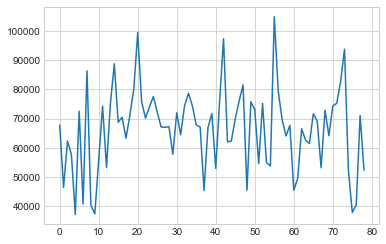

In [372]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import numpy as np
plt.plot(output_income.Median_HH_income)

In [373]:
# import corrected income
cinc=output_income
cinc['buffer_size']=1.0
cinc['region']="Portland"
cinc['buffer_type']='Euclidian'
#pd.DataFrame.to_csv(cinc, 'F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Six_Cities_Updated_data/Median Household income data corrections/1.0mile_medinc2019Euclidian.csv', sep=',', na_rep='0', index=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Population Density

In [374]:
#pdensity=pd.read_csv("../input/oregon-sd-data/population.csv")
pdensity1=pd.merge(bg_proj, pdensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_pdensity1 = gpd.clip(pdensity1, gdf1)
inter_pdensity=gpd.overlay(gdf1, buffer_clip_pdensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_pdensity.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,SDSECA,SDUNIA,PUMA5A,BTTRA,BTBGA,NAME_E,AHY1E001,NAME_M,AHY1M001,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",693,"Block Group 1, Census Tract 11.01, Multnomah C...",173,"POLYGON ((2331453.098 207425.766, 2331439.364 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",693,"Block Group 1, Census Tract 11.01, Multnomah C...",173,"POLYGON ((2331578.487 207350.911, 2331575.234 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",693,"Block Group 1, Census Tract 11.01, Multnomah C...",173,"POLYGON ((2330518.017 207338.526, 2330632.917 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",693,"Block Group 1, Census Tract 11.01, Multnomah C...",173,"POLYGON ((2331317.970 208086.779, 2331216.372 ..."
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",693,"Block Group 1, Census Tract 11.01, Multnomah C...",173,"MULTIPOLYGON (((2331296.860 208081.023, 233118..."


In [375]:
inter_pdensity["buffered area"]=inter_pdensity.area
inter_pdensity['area factor']=inter_pdensity['buffered area']/inter_pdensity["Total block Area"]
inter_pdensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,PUMA5A,BTTRA,BTBGA,NAME_E,AHY1E001,NAME_M,AHY1M001,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",693,"Block Group 1, Census Tract 11.01, Multnomah C...",173,"POLYGON ((2331453.098 207425.766, 2331439.364 ...",1.033517e+06,0.727486
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",693,"Block Group 1, Census Tract 11.01, Multnomah C...",173,"POLYGON ((2331578.487 207350.911, 2331575.234 ...",1.166500e+06,0.821092
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",693,"Block Group 1, Census Tract 11.01, Multnomah C...",173,"POLYGON ((2330518.017 207338.526, 2330632.917 ...",4.443474e+05,0.312773
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",693,"Block Group 1, Census Tract 11.01, Multnomah C...",173,"POLYGON ((2331317.970 208086.779, 2331216.372 ...",8.927341e+04,0.062839
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,NaN,NaN,NaN,"Block Group 1, Census Tract 11.01, Multnomah C...",693,"Block Group 1, Census Tract 11.01, Multnomah C...",173,"MULTIPOLYGON (((2331296.860 208081.023, 233118...",6.816246e+04,0.047979


In [376]:
#    Table 1:     Total Population
#    Universe:    Total population
#    Source code: B01003
#    NHGIS code:  AHY1
#       AHY1E001:    Total
 
pdensity_filter=inter_pdensity.loc[:, ['osm_id_sensor', 'AHY1E001','area factor']]
pdensity_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY1E001,area factor
0,681301893.0,693,0.727486
1,689032191.0,693,0.821092
2,322079535.0,693,0.312773
3,348027806.0,693,0.062839
4,156121087.0,693,0.047979


In [377]:
age_pop=inter_pdensity.loc[:, ['osm_id_sensor', 'GEOID','AHY1E001','area factor']]
age_pop.iloc[:, 2:3]=age_pop.iloc[:, 2:3].mul(age_pop['area factor'],axis=0)
age_pop.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHY1E001,area factor
0,681301893.0,410510011011,504.147796,0.727486
1,689032191.0,410510011011,569.016823,0.821092
2,322079535.0,410510011011,216.751924,0.312773
3,348027806.0,410510011011,43.547416,0.062839
4,156121087.0,410510011011,33.249533,0.047979


In [378]:
pp=inter_pdensity.loc[:, ['osm_id_sensor','GEOID', 'AHY1E001','area factor']]
pp.columns=['osm_id','GEOID', 'AHY1E001','pp factor']
pp1=pp.loc[:,["osm_id",'GEOID',"pp factor"]]
pp1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,GEOID,pp factor
0,681301893.0,410510011011,0.727486
1,689032191.0,410510011011,0.821092
2,322079535.0,410510011011,0.312773
3,348027806.0,410510011011,0.062839
4,156121087.0,410510011011,0.047979


In [379]:
pdensity_filter.iloc[:, 1:2] = pdensity_filter.iloc[:, 1:2].mul(pdensity_filter['area factor'],axis=0)
pdensity_filter=pdensity_filter.drop(['area factor'],axis=1)
pdensity_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY1E001
0,681301893.0,504.147796
1,689032191.0,569.016823
2,322079535.0,216.751924
3,348027806.0,43.547416
4,156121087.0,33.249533


In [380]:
# Aggregate by ID
output_pdensity=pdensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pdensity.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY1E001
0,5516558.0,12238.608312
1,5522164.0,26766.632219
2,5527017.0,12823.598219
3,5528173.0,16991.148505
4,5529700.0,12789.688390


In [381]:
output_pdensity['population_density']=output_pdensity.AHY1E001/(3.1416*size*size*3.86102e-7)
output_pdensity.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY1E001,population_density
0,5516558.0,12238.608312,6925.622238
1,5522164.0,26766.632219,15146.786187
2,5527017.0,12823.598219,7256.658170
3,5528173.0,16991.148505,9615.004658
4,5529700.0,12789.688390,7237.469169


In [382]:
output_pdensity1=output_pdensity.loc[:, ['osm_id_sensor', 'population_density']]
output_pdensity1.columns=['osm_id', 'population_density']
output_pdensity1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,population_density
0,5516558.0,6925.622238
1,5522164.0,15146.786187
2,5527017.0,7256.658170
3,5528173.0,9615.004658
4,5529700.0,7237.469169


# Weighted Median Age

In [383]:
w_age=pd.merge(age_pop,age_filter,on=["osm_id_sensor","GEOID"])
w_age.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHY1E001,area factor,AHYRE001
0,681301893.0,410510011011,504.147796,0.727486,41.1
1,689032191.0,410510011011,569.016823,0.821092,41.1
2,322079535.0,410510011011,216.751924,0.312773,41.1
3,348027806.0,410510011011,43.547416,0.062839,41.1
4,156121087.0,410510011011,33.249533,0.047979,41.1


In [384]:
w_age['w_age']=(w_age['AHY1E001'].mul(w_age['AHYRE001'],axis=0))
w_age.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHY1E001,area factor,AHYRE001,w_age
0,681301893.0,410510011011,504.147796,0.727486,41.1,20720.474401
1,689032191.0,410510011011,569.016823,0.821092,41.1,23386.591418
2,322079535.0,410510011011,216.751924,0.312773,41.1,8908.504090
3,348027806.0,410510011011,43.547416,0.062839,41.1,1789.798793
4,156121087.0,410510011011,33.249533,0.047979,41.1,1366.555800


In [385]:
#w_age.iloc[:, 3:4] = w_age.iloc[:, 3:4].mul(w_age['pp factor'],axis=0)
age_filter1=w_age.drop(['GEOID','AHYRE001','area factor'],axis=1)
age_filter1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY1E001,w_age
0,681301893.0,504.147796,20720.474401
1,689032191.0,569.016823,23386.591418
2,322079535.0,216.751924,8908.504090
3,348027806.0,43.547416,1789.798793
4,156121087.0,33.249533,1366.555800


In [386]:
# Aggregate by ID
output_median_age=age_filter1.groupby('osm_id_sensor', as_index=False).sum()
output_median_age.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY1E001,w_age
0,5516558.0,12238.608312,4.472841e+05
1,5522164.0,26766.632219,1.007017e+06
2,5527017.0,12823.598219,4.652805e+05
3,5528173.0,16991.148505,6.960932e+05
4,5529700.0,12789.688390,4.883639e+05


In [387]:
output_median_age['median weighted age']=output_median_age['w_age']/output_median_age['AHY1E001']
output_median_age=output_median_age.drop(['AHY1E001','w_age'],axis=1)
output_median_age.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,median weighted age
0,5516558.0,36.546976
1,5522164.0,37.622115
2,5527017.0,36.283147
3,5528173.0,40.967987
4,5529700.0,38.184187


In [388]:
output_median_age.columns=["osm_id","Median Age"]
output_median_age.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Median Age
0,5516558.0,36.546976
1,5522164.0,37.622115
2,5527017.0,36.283147
3,5528173.0,40.967987
4,5529700.0,38.184187


# Employment Density

In [389]:
#edensity=pd.read_csv("../input/employment/nhgis0012_ds233_20175_2017_blck_grp.csv")
edensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,AH3PE006,AH3PE007,NAME_M,AH3PM001,AH3PM002,AH3PM003,AH3PM004,AH3PM005,AH3PM006,AH3PM007
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,0,444,"Block Group 1, Census Tract 9501, Baker County...",138,91,91,94,25,12,96
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,0,344,"Block Group 2, Census Tract 9501, Baker County...",109,84,84,81,11,12,89
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,0,469,"Block Group 3, Census Tract 9501, Baker County...",129,80,80,80,22,12,107
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,0,372,"Block Group 1, Census Tract 9502, Baker County...",172,160,160,155,44,12,90
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,0,289,"Block Group 2, Census Tract 9502, Baker County...",170,161,161,120,90,12,76


In [390]:

edensity1=pd.merge(bg_proj, edensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_edensity1 = gpd.clip(edensity1, gdf1)
inter_edensity=gpd.overlay(gdf1, buffer_clip_edensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_edensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AH3PE007,NAME_M,AH3PM001,AH3PM002,AH3PM003,AH3PM004,AH3PM005,AH3PM006,AH3PM007,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,262,"Block Group 1, Census Tract 11.01, Multnomah C...",173,112,112,92,61,12,129,"POLYGON ((2331453.098 207425.766, 2331439.364 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,262,"Block Group 1, Census Tract 11.01, Multnomah C...",173,112,112,92,61,12,129,"POLYGON ((2331578.487 207350.911, 2331575.234 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,262,"Block Group 1, Census Tract 11.01, Multnomah C...",173,112,112,92,61,12,129,"POLYGON ((2330518.017 207338.526, 2330632.917 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,262,"Block Group 1, Census Tract 11.01, Multnomah C...",173,112,112,92,61,12,129,"POLYGON ((2331317.970 208086.779, 2331216.372 ..."
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,262,"Block Group 1, Census Tract 11.01, Multnomah C...",173,112,112,92,61,12,129,"MULTIPOLYGON (((2331296.860 208081.023, 233118..."


In [391]:
inter_edensity["buffered area"]=inter_edensity.area
inter_edensity['area factor']=inter_edensity['buffered area']/inter_edensity["Total block Area"]
inter_edensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AH3PM001,AH3PM002,AH3PM003,AH3PM004,AH3PM005,AH3PM006,AH3PM007,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,173,112,112,92,61,12,129,"POLYGON ((2331453.098 207425.766, 2331439.364 ...",1.033517e+06,0.727486
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,173,112,112,92,61,12,129,"POLYGON ((2331578.487 207350.911, 2331575.234 ...",1.166500e+06,0.821092
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,173,112,112,92,61,12,129,"POLYGON ((2330518.017 207338.526, 2330632.917 ...",4.443474e+05,0.312773
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,173,112,112,92,61,12,129,"POLYGON ((2331317.970 208086.779, 2331216.372 ...",8.927341e+04,0.062839
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,173,112,112,92,61,12,129,"MULTIPOLYGON (((2331296.860 208081.023, 233118...",6.816246e+04,0.047979


In [392]:
#    Table 1:     Employment Status for the Population 16 Years and Over
#    Universe:    Population 16 years and over
#    Source code: B23025
#    NHGIS code:  AH3P
#        AH3PE001:    Total
#        AH3PE002:    In labor force
#        AH3PE003:    In labor force: Civilian labor force
#        AH3PE004:    In labor force: Civilian labor force: Employed
#        AH3PE005:    In labor force: Civilian labor force: Unemployed
#        AH3PE006:    In labor force: Armed Forces
#        AH3PE007:    Not in labor force
 # columns to keep
filtered_columns=['osm_id_sensor','AH3PE001','area factor']
edensity_filter=inter_edensity.reindex(columns = filtered_columns)
edensity_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH3PE001,area factor
0,681301893.0,693,0.727486
1,689032191.0,693,0.821092
2,322079535.0,693,0.312773
3,348027806.0,693,0.062839
4,156121087.0,693,0.047979


In [393]:
edensity_filter.iloc[:, 1:2] = edensity_filter.iloc[:, 1:2].mul(edensity_filter['area factor'],axis=0)
edensity_filter=edensity_filter.drop(['area factor'],axis=1)
edensity_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH3PE001
0,681301893.0,504.147796
1,689032191.0,569.016823
2,322079535.0,216.751924
3,348027806.0,43.547416
4,156121087.0,33.249533


In [394]:
# Aggregate by ID
output_edensity=edensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_edensity.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH3PE001
0,5516558.0,10191.110899
1,5522164.0,25919.665652
2,5527017.0,10929.258206
3,5528173.0,16228.815620
4,5529700.0,10608.562673


In [395]:
output_edensity['employment_density']=output_edensity.AH3PE001/(3.1416*size*size*3.86102e-7)
output_edensity.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH3PE001,employment_density
0,5516558.0,10191.110899,5766.977950
1,5522164.0,25919.665652,14667.502077
2,5527017.0,10929.258206,6184.683073
3,5528173.0,16228.815620,9183.613323
4,5529700.0,10608.562673,6003.206875


In [396]:
output_edensity1=output_edensity.loc[:, ['osm_id_sensor', 'employment_density']]
output_edensity1.columns=['osm_id', 'employment_density']
output_edensity1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,employment_density
0,5516558.0,5766.977950
1,5522164.0,14667.502077
2,5527017.0,6184.683073
3,5528173.0,9183.613323
4,5529700.0,6003.206875


# Number of Jobs within the Buffer (LEHD data)

In [397]:
# Number of Jobs within buffer
Number_job.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,w_geocode,C000,CA01,CA02,CA03,CE01,CE02,CE03,CNS01,CNS02,...,CFA02,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate
0,410019501001003,2,0,0,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,20201120
1,410019501001160,2,2,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,20201120
2,410019501001171,5,0,3,2,0,2,3,0,5,...,0,0,0,0,0,0,0,0,0,20201120
3,410019501001198,14,2,5,7,6,8,0,0,0,...,0,0,0,0,0,0,0,0,0,20201120
4,410019501001203,1,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,20201120


In [398]:
bg_lehd1=bg_lehd.drop_duplicates(subset='BLOCKID10')
bg_lehd1['BLOCKID10'] = pd.to_numeric(bg_lehd1['BLOCKID10'])
bg_lehd1.dtypes

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


STATEFP10       object
COUNTYFP10      object
TRACTCE10       object
BLOCKCE         object
BLOCKID10        int64
PARTFLG         object
HOUSING10        int64
POP10            int64
geometry      geometry
dtype: object

In [399]:
print(bg_lehd1.crs)

epsg:4269


In [400]:
# set the co-ordinate system first
bg_lehd2 = bg_lehd1.set_crs("EPSG:4269")

#bg2 = gpd.GeoSeries(bg['geometry'], crs={'init': 'epsg:102003'})

# Let's take a copy of our layer
bg_lehd2_proj = bg_lehd2.copy()

# Reproject the geometries by replacing the values with projected ones
bg_lehd2_proj = bg_lehd2_proj.to_crs('epsg:2838')
bg_lehd2_proj.head(5)

,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry
0,41,001,950100,1377,410019501001377,N,0,0,"POLYGON ((2667732.395 115912.633, 2667718.803 ..."
1,41,001,950100,1309,410019501001309,N,0,0,"POLYGON ((2666544.993 112314.539, 2666531.728 ..."
2,41,001,950100,1946,410019501001946,N,0,0,"POLYGON ((2666165.730 110471.405, 2666160.699 ..."
3,41,001,950100,1340,410019501001340,N,2,0,"POLYGON ((2660251.559 114451.958, 2660248.994 ..."
4,41,001,950100,1402,410019501001402,N,0,0,"POLYGON ((2664040.055 116252.674, 2664041.185 ..."


In [401]:
bg_lehd2_proj["Total block Area"]=bg_lehd2_proj.area
bg_lehd2_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry,Total block Area
0,41,001,950100,1377,410019501001377,N,0,0,"POLYGON ((2667732.395 115912.633, 2667718.803 ...",1.413065e+06
1,41,001,950100,1309,410019501001309,N,0,0,"POLYGON ((2666544.993 112314.539, 2666531.728 ...",1.605916e+04
2,41,001,950100,1946,410019501001946,N,0,0,"POLYGON ((2666165.730 110471.405, 2666160.699 ...",1.693601e+03
3,41,001,950100,1340,410019501001340,N,2,0,"POLYGON ((2660251.559 114451.958, 2660248.994 ...",1.146733e+06
4,41,001,950100,1402,410019501001402,N,0,0,"POLYGON ((2664040.055 116252.674, 2664041.185 ...",1.943724e+04


In [402]:
job1=pd.merge(bg_lehd2_proj, Number_job, left_on='BLOCKID10', right_on='w_geocode', how='left')
buffer_clip_job1 = gpd.clip(job1, gdf1)
buffer_clip_job1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry,Total block Area,...,CFA02,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate
8078,41,005,022707,2058,410050227072058,N,0,0,"POLYGON ((2320840.488 184513.616, 2320842.306 ...",1847.791071,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8253,41,005,022708,2025,410050227082025,N,40,135,"POLYGON ((2320135.338 183396.432, 2320152.182 ...",33293.146499,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0
8256,41,005,022708,2029,410050227082029,N,3,11,"POLYGON ((2319315.845 183429.757, 2319324.802 ...",334251.926077,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8257,41,005,022708,2031,410050227082031,N,10,15,"POLYGON ((2319902.540 183697.649, 2319929.960 ...",9518.993178,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8335,41,005,022708,2027,410050227082027,N,10,42,"POLYGON ((2320681.029 183719.366, 2320709.343 ...",9048.632822,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0


In [403]:
inter_job=gpd.overlay(gdf1, buffer_clip_job1, how='intersection', make_valid=True, keep_geom_type=False)
inter_job.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((2330769.962 208094.885, 2330769.634 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((2330769.962 208094.885, 2330769.634 ..."
2,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((2330769.962 208094.885, 2330769.634 ..."
3,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((2330769.962 208094.885, 2330769.634 ..."
4,P008POR,STEEL BR upper sidewalk north side,permanent,2019,Portland,1.0,199.528105,11.630137,9.232877,12846.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((2330769.962 208094.885, 2330769.634 ..."


In [404]:
inter_job["buffered area"]=inter_job.area
inter_job['area factor']=inter_job['buffered area']/inter_job["Total block Area"]
inter_job.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((2330769.962 208094.885, 2330769.634 ...",2000.184557,1.0
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((2330769.962 208094.885, 2330769.634 ...",2000.184557,1.0
2,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((2330769.962 208094.885, 2330769.634 ...",2000.184557,1.0
3,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((2330769.962 208094.885, 2330769.634 ...",2000.184557,1.0
4,P008POR,STEEL BR upper sidewalk north side,permanent,2019,Portland,1.0,199.528105,11.630137,9.232877,12846.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((2330769.962 208094.885, 2330769.634 ...",2000.184557,1.0


In [405]:
 # columns to keep
filtered_columns=['osm_id_sensor','C000','area factor']
job_filter=inter_job.reindex(columns = filtered_columns)
job_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,C000,area factor
0,681301893.0,NaN,1.0
1,689032191.0,NaN,1.0
2,348027806.0,NaN,1.0
3,156121087.0,NaN,1.0
4,348027809.0,NaN,1.0


In [406]:
job_filter.iloc[:, 1:2] = job_filter.iloc[:, 1:2].mul(job_filter['area factor'],axis=0)
job_filter=job_filter.drop(['area factor'],axis=1)
job_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,C000
0,681301893.0,NaN
1,689032191.0,NaN
2,348027806.0,NaN
3,156121087.0,NaN
4,348027809.0,NaN


In [407]:
# Aggregate by ID
output_job=job_filter.groupby('osm_id_sensor', as_index=False).sum()
output_job.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,C000
0,5516558.0,6254.690226
1,5522164.0,79490.442651
2,5527017.0,4240.321313
3,5528173.0,43787.921411
4,5529700.0,8988.144002


In [408]:
output_job.columns=['osm_id', 'Number of jobs']
output_job1=output_job
output_job1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Number of jobs
0,5516558.0,6254.690226
1,5522164.0,79490.442651
2,5527017.0,4240.321313
3,5528173.0,43787.921411
4,5529700.0,8988.144002


# percentage of bike commute or Bike commute per Square miles

In [409]:
bike_commute.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALU1M012,ALU1M013,ALU1M014,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021
0,G41000109501001,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,12,12,12,12,12,12,21,4,21
1,G41000109501002,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,12,12,12,12,12,12,9,12,15
2,G41000109501003,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,12,12,12,12,12,12,12,20,13
3,G41000109502001,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,12,12,12,12,12,28,26,12,21
4,G41000109502002,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,12,12,12,13,12,8,75,21,24


In [410]:
bikecom1=pd.merge(bg_proj, bike_commute, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_bikecom1 = gpd.clip(bikecom1, gdf1)
inter_bikecom1=gpd.overlay(gdf1, buffer_clip_bikecom1, how='intersection', make_valid=True, keep_geom_type=False)
inter_bikecom1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU1M013,ALU1M014,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,15,12,50,12,45,23,16,28,"POLYGON ((2331453.098 207425.766, 2331439.364 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,15,12,50,12,45,23,16,28,"POLYGON ((2331578.487 207350.911, 2331575.234 ..."
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,12,15,12,50,12,45,23,16,28,"POLYGON ((2330518.017 207338.526, 2330632.917 ..."
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,12,15,12,50,12,45,23,16,28,"POLYGON ((2331317.970 208086.779, 2331216.372 ..."
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,12,15,12,50,12,45,23,16,28,"MULTIPOLYGON (((2331296.860 208081.023, 233118..."


In [411]:
inter_bikecom1["buffered area"]=inter_bikecom1.area
inter_bikecom1['area factor']=inter_bikecom1['buffered area']/inter_bikecom1["Total block Area"]
inter_bikecom1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,50,12,45,23,16,28,"POLYGON ((2331453.098 207425.766, 2331439.364 ...",1.033517e+06,0.727486
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,50,12,45,23,16,28,"POLYGON ((2331578.487 207350.911, 2331575.234 ...",1.166500e+06,0.821092
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,12,50,12,45,23,16,28,"POLYGON ((2330518.017 207338.526, 2330632.917 ...",4.443474e+05,0.312773
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,12,50,12,45,23,16,28,"POLYGON ((2331317.970 208086.779, 2331216.372 ...",8.927341e+04,0.062839
4,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,12,50,12,45,23,16,28,"MULTIPOLYGON (((2331296.860 208081.023, 233118...",6.816246e+04,0.047979


In [412]:
#Table 1:     Means of Transportation to Work
#    Universe:    Workers 16 years and over
#    Source code: B08301
#    NHGIS code:  ALU1
#        ALU1E001:    Total
#        ALU1E002:    Car, truck, or van
#        ALU1E003:    Car, truck, or van: Drove alone
#        ALU1E004:    Car, truck, or van: Carpooled
#        ALU1E005:    Car, truck, or van: Carpooled: In 2-person carpool
#        ALU1E006:    Car, truck, or van: Carpooled: In 3-person carpool
#        ALU1E007:    Car, truck, or van: Carpooled: In 4-person carpool
#        ALU1E008:    Car, truck, or van: Carpooled: In 5- or 6-person carpool
#        ALU1E009:    Car, truck, or van: Carpooled: In 7-or-more-person carpool
 #       ALU1E010:    Public transportation (excluding taxicab)
#        ALU1E011:    Public transportation (excluding taxicab): Bus
#        ALU1E012:    Public transportation (excluding taxicab): Subway or elevated rail
#        ALU1E013:    Public transportation (excluding taxicab): Long-distance train or commuter rail
#        ALU1E014:    Public transportation (excluding taxicab): Light rail, streetcar or trolley (carro público in Puerto Rico)
#       ALU1E015:    Public transportation (excluding taxicab): Ferryboat
#        ALU1E016:    Taxicab
#        ALU1E017:    Motorcycle
#        ALU1E018:    Bicycle
#        ALU1E019:    Walked
#        ALU1E020:    Other means
#        ALU1E021:    Worked from home

# columns to keep
filtered_columns=['osm_id_sensor','ALU1E001','ALU1E018','area factor']
bikecom_filter=inter_bikecom1.reindex(columns = filtered_columns)
bikecom_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018,area factor
0,681301893.0,597,75,0.727486
1,689032191.0,597,75,0.821092
2,322079535.0,597,75,0.312773
3,348027806.0,597,75,0.062839
4,156121087.0,597,75,0.047979


In [413]:
bikecom_filter.iloc[:, 1:3] = bikecom_filter.iloc[:, 1:3].mul(bikecom_filter['area factor'],axis=0)
bikecom_filter=bikecom_filter.drop(['area factor'],axis=1)
bikecom_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018
0,681301893.0,434.309140,54.561450
1,689032191.0,490.191982,61.581907
2,322079535.0,186.725684,23.458000
3,348027806.0,37.514873,4.712924
4,156121087.0,28.643537,3.598434


In [414]:
# Aggregate by ID
output_bikecom=bikecom_filter.groupby('osm_id_sensor', as_index=False).sum()
output_bikecom.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018
0,5516558.0,7700.853691,873.463195
1,5522164.0,17153.767135,873.760558
2,5527017.0,8146.277461,957.382244
3,5528173.0,11891.674719,632.022256
4,5529700.0,6686.029173,279.716675


In [415]:
# Calculate the percentage pf bike commuter and bike commuter density

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [416]:
output_bikecom['Percentage of Bike Commuter']=(output_bikecom['ALU1E018']/output_bikecom['ALU1E001'])*100
output_bikecom['bike commuter density']=output_bikecom['ALU1E018']/(3.1416*size*size*3.861e-7)
output_bikecom.columns=["osm_id","Total Commuter", "Bike Commuter", "Percentage of Bike Commuter",'bike commuter density']
output_bikecom.head()

,osm_id,Total Commuter,Bike Commuter,Percentage of Bike Commuter,bike commuter density
0,5516558.0,7700.853691,873.463195,11.342420,494.280665
1,5522164.0,17153.767135,873.760558,5.093695,494.448939
2,5527017.0,8146.277461,957.382244,11.752389,541.769288
3,5528173.0,11891.674719,632.022256,5.314830,357.652598
4,5529700.0,6686.029173,279.716675,4.183599,158.287773


# Extract slope from raster file

In [417]:
#https://pysal.org/scipy2019-intermediate-gds/deterministic/gds2-rasters.html
import rasterio
from rasterio.plot import show
from rasterio import plot as rioplot
import matplotlib.pyplot as plt

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


EPSG:4269


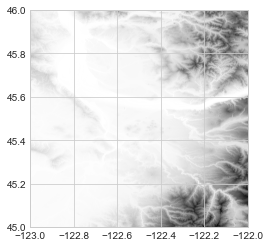

<AxesSubplot:>

In [418]:
# Open the raster image
n46w123 = rasterio.open('C:/Users/mxm5116/Desktop/Bike Fusion/USGS_NED_13_n46w123_IMG.img')
print(n46w123.crs)
rioplot.show(n46w123)

EPSG:4269


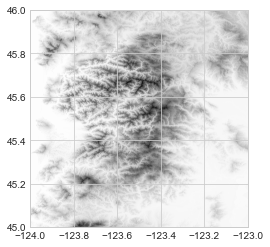

<AxesSubplot:>

In [419]:
#We need to cover left side of the map, as some of the network points outside of the map. Lets bring another slope raster file and join with previous one.
n46w124 = rasterio.open('C:/Users/mxm5116/Desktop/Bike Fusion/imgn46w124_13.img')
print(n46w124.crs)
rioplot.show(n46w124)

In [420]:
# only band is elev value (in m)
band1 = n46w123.read(1, masked=True)  # mask noData cells [shouldn't be necessary on land]
stats = {'min': band1.min(), 'mean': band1.mean(), 'max': band1.max()}
print(stats)

{'min': 0.0, 'mean': 302.9298, 'max': 1614.4988}


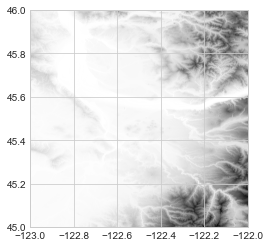

<AxesSubplot:>

In [421]:
show(n46w123)

In [422]:
print(n46w123.crs)
n46w123.shape

EPSG:4269


(10812, 10812)

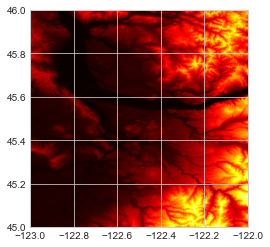

<AxesSubplot:>

In [423]:
rioplot.show(n46w123, cmap='hot') # Its sets the axis correctly to latitude and longitude

In [424]:
n46w123.bounds # check the bounds
print(n46w123.crs)

EPSG:4269


In [425]:
print(strava_proj.crs)

epsg:2838


In [426]:
# set the co-ordinate system first
stravas = strava_proj.set_crs("EPSG:2838")
stravas ["length"]=stravas["geometry"].length # in m
# Let's take a copy of our layer
strava_slope = stravas.copy()

# Reproject the geometries by replacing the values with projected ones
strava_slope_new = strava_slope.to_crs(epsg=4269)
strava_slope_new.head(10)

,ID,OSM_ID,OSM_NAME,CLAZZ,KM,year,aadb_s,aadb_s_com,length,geometry
0,8.0,4440967.0,Northeast Butler Street,31.0,0.031403,2019,1.767123,1.191781,31.456401,"LINESTRING (-122.90511 45.53766, -122.90477 45..."
1,10.0,4443830.0,Northeast 85th Avenue,32.0,0.034098,2019,0.013699,0.000000,34.078730,"LINESTRING (-122.89170 45.53232, -122.89171 45..."
2,18.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.198173,2019,2.383562,1.164384,198.152425,"LINESTRING (-122.79277 45.52251, -122.79274 45..."
3,20.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.116912,2019,2.369863,1.164384,116.881836,"LINESTRING (-122.79179 45.52075, -122.79161 45..."
4,26.0,4490043.0,Northeast 87th Avenue,32.0,0.075945,2019,0.013699,0.000000,75.902503,"LINESTRING (-122.88966 45.52964, -122.88965 45..."
5,30.0,4493251.0,Northeast Sheffield Avenue,32.0,0.037724,2019,0.013699,0.000000,37.727623,"LINESTRING (-122.88945 45.53639, -122.88952 45..."
6,31.0,4493251.0,Northeast Sheffield Avenue,32.0,0.110734,2019,0.013699,0.000000,110.751650,"LINESTRING (-122.88967 45.53608, -122.88974 45..."
7,34.0,4493256.0,Southwest 153rd Drive,31.0,0.134936,2019,3.958904,2.849315,134.934141,"LINESTRING (-122.83570 45.50630, -122.83575 45..."
8,35.0,4493490.0,Northeast Walker Road,31.0,0.048515,2019,2.178082,1.547945,48.646059,"LINESTRING (-122.90022 45.53794, -122.90010 45..."
9,36.0,4493490.0,Northeast Walker Road,31.0,0.025857,2019,1.876712,1.301370,25.924766,"LINESTRING (-122.89961 45.53787, -122.89929 45..."


In [427]:
# get the slope for each link of the network
%time
strava_slope_new
# First identify the starting and ending node of each link
strava_slope_new['starting point'] = None
strava_slope_new['ending point'] = None

for index, row in strava_slope_new.iterrows():
    coords = [(coords) for coords in list(row['geometry'].coords)]
    first_coord, last_coord = [ coords[i] for i in (0, -1) ]
    strava_slope_new.at[index,'starting point'] = Point(first_coord)
    strava_slope_new.at[index,'ending point'] = Point(last_coord)
    strava_slope_new

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Wall time: 0 ns


In [428]:
strava_slope_new.head(5)

,ID,OSM_ID,OSM_NAME,CLAZZ,KM,year,aadb_s,aadb_s_com,length,geometry,starting point,ending point
0,8.0,4440967.0,Northeast Butler Street,31.0,0.031403,2019,1.767123,1.191781,31.456401,"LINESTRING (-122.90511 45.53766, -122.90477 45...",POINT (-122.9051071032779 45.53765552980075),POINT (-122.9047733044891 45.53749712933061)
1,10.0,4443830.0,Northeast 85th Avenue,32.0,0.034098,2019,0.013699,0.000000,34.078730,"LINESTRING (-122.89170 45.53232, -122.89171 45...",POINT (-122.8917022451145 45.53231930779811),POINT (-122.8917100470238 45.53201270841168)
2,18.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.198173,2019,2.383562,1.164384,198.152425,"LINESTRING (-122.79277 45.52251, -122.79274 45...",POINT (-122.7927711619811 45.52251286761185),POINT (-122.7918528720279 45.52085786615329)
3,20.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.116912,2019,2.369863,1.164384,116.881836,"LINESTRING (-122.79179 45.52075, -122.79161 45...",POINT (-122.7917855726958 45.52074836603802),POINT (-122.7913764786866 45.519746965523)
4,26.0,4490043.0,Northeast 87th Avenue,32.0,0.075945,2019,0.013699,0.000000,75.902503,"LINESTRING (-122.88966 45.52964, -122.88965 45...",POINT (-122.8896631630485 45.5296415078439),POINT (-122.8896473588017 45.53032440649985)


In [429]:
strava_slope_new.shape

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(88871, 12)

<AxesSubplot:>

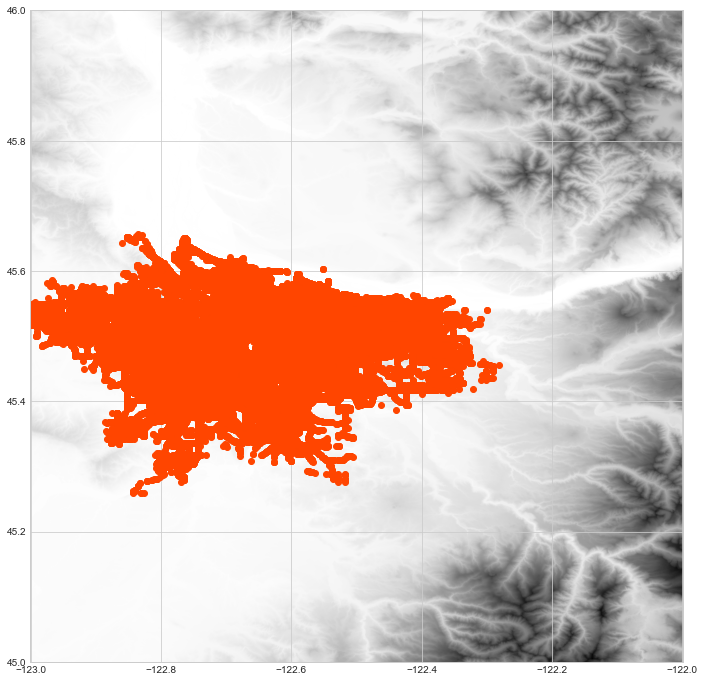

In [430]:
#show point and raster on a matplotlib plot
fig, ax = plt.subplots(figsize=(12,12))
strava_slope_new.boundary.plot(ax=ax, color='orangered')
show(n46w123, ax=ax)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

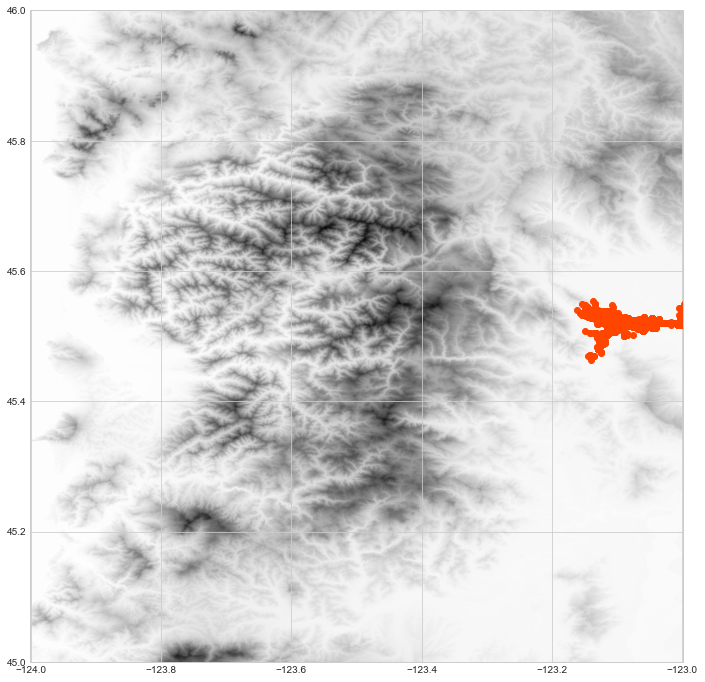

In [431]:
#show point and raster on a matplotlib plot
fig, ax = plt.subplots(figsize=(12,12))
strava_slope_new.boundary.plot(ax=ax, color='orangered')
show(n46w124, ax=ax)

In [432]:
sf1=strava_slope_new.loc[:,["OSM_ID","starting point"]]
sf1.columns=["OSM_ID","geometry"]
sf1['start_lon'] = sf1.geometry.apply(lambda p: p.x)
sf1['start_lat'] = sf1.geometry.apply(lambda p: p.y)
sf2=sf1.loc[:,["OSM_ID","geometry","start_lon","start_lat"]]
sf2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,geometry,start_lon,start_lat
0,4440967.0,POINT (-122.90511 45.53766),-122.905107,45.537656
1,4443830.0,POINT (-122.89170 45.53232),-122.891702,45.532319
2,4490031.0,POINT (-122.79277 45.52251),-122.792771,45.522513
3,4490031.0,POINT (-122.79179 45.52075),-122.791786,45.520748
4,4490043.0,POINT (-122.88966 45.52964),-122.889663,45.529642


In [433]:
#For image n46w123
ss=sf2.loc[sf2.start_lon>-123.0]
ss.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,geometry,start_lon,start_lat
0,4440967.0,POINT (-122.90511 45.53766),-122.905107,45.537656
1,4443830.0,POINT (-122.89170 45.53232),-122.891702,45.532319
2,4490031.0,POINT (-122.79277 45.52251),-122.792771,45.522513
3,4490031.0,POINT (-122.79179 45.52075),-122.791786,45.520748
4,4490043.0,POINT (-122.88966 45.52964),-122.889663,45.529642


In [434]:
ss["starting_ele"]= None
#point in test['geometry']:
x = ss["start_lon"]
y = ss["start_lat"]
row, col = n46w123.index(x,y)
ss["starting_ele"]=n46w123.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [435]:
ss.head(5)

,OSM_ID,geometry,start_lon,start_lat,starting_ele
0,4440967.0,POINT (-122.90511 45.53766),-122.905107,45.537656,65.531769
1,4443830.0,POINT (-122.89170 45.53232),-122.891702,45.532319,54.338253
2,4490031.0,POINT (-122.79277 45.52251),-122.792771,45.522513,81.901581
3,4490031.0,POINT (-122.79179 45.52075),-122.791786,45.520748,83.271347
4,4490043.0,POINT (-122.88966 45.52964),-122.889663,45.529642,56.515728


In [436]:
#For image n46w124
sss=sf2.loc[sf2.start_lon<=-123.0]
sss.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,geometry,start_lon,start_lat
3190,5387093.0,POINT (-123.12686 45.52773),-123.126858,45.527732
3191,5387093.0,POINT (-123.12704 45.52726),-123.127044,45.527256
3192,5387093.0,POINT (-123.12728 45.52677),-123.127275,45.526766
3193,5387093.0,POINT (-123.12726 45.52601),-123.127261,45.526010
3194,5387215.0,POINT (-123.01668 45.52000),-123.016679,45.519996


In [437]:
%%time
sss["starting_ele"]= None
#point in test['geometry']:
x = sss["start_lon"]
y = sss["start_lat"]
row, col = n46w124.index(x,y)
sss["starting_ele"]=n46w124.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


Wall time: 494 ms


<AxesSubplot:>

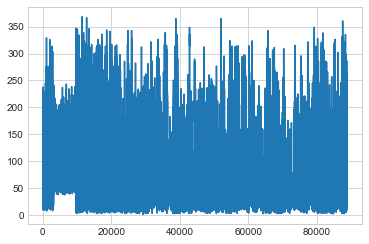

In [438]:
ss.starting_ele.plot()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

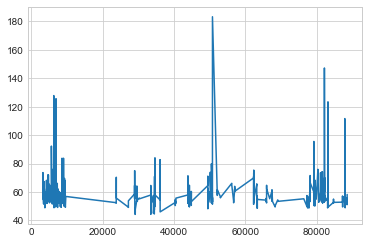

In [439]:
sss.starting_ele.plot()

In [440]:
%%time
ef1=strava_slope_new.loc[:,["OSM_ID","ending point"]]
ef1
ef1.columns=["OSM_ID","geometry"]
ef1['end_lon'] = ef1.geometry.apply(lambda p: p.x)
ef1['end_lat'] = ef1.geometry.apply(lambda p: p.y)
ef2=ef1.loc[:,["OSM_ID","geometry","end_lon","end_lat"]]
ef2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Wall time: 3.2 s


,OSM_ID,geometry,end_lon,end_lat
0,4440967.0,POINT (-122.90477 45.53750),-122.904773,45.537497
1,4443830.0,POINT (-122.89171 45.53201),-122.891710,45.532013
2,4490031.0,POINT (-122.79185 45.52086),-122.791853,45.520858
3,4490031.0,POINT (-122.79138 45.51975),-122.791376,45.519747
4,4490043.0,POINT (-122.88965 45.53032),-122.889647,45.530324


In [441]:
#For image n46w123
ee=ef2.loc[ef2.end_lon>-123.0]
ee.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,geometry,end_lon,end_lat
0,4440967.0,POINT (-122.90477 45.53750),-122.904773,45.537497
1,4443830.0,POINT (-122.89171 45.53201),-122.891710,45.532013
2,4490031.0,POINT (-122.79185 45.52086),-122.791853,45.520858
3,4490031.0,POINT (-122.79138 45.51975),-122.791376,45.519747
4,4490043.0,POINT (-122.88965 45.53032),-122.889647,45.530324


In [442]:
%%time
ee["ending_ele"]= None
#point in test['geometry']:
x = ee["end_lon"]
y = ee["end_lat"]
row, col = n46w123.index(x,y)
ee["ending_ele"]=n46w123.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


Wall time: 623 ms


In [443]:
#For image n46w124
eee=ef2.loc[ef2.end_lon<=-123.0]
eee.head(5)

,OSM_ID,geometry,end_lon,end_lat
3190,5387093.0,POINT (-123.12704 45.52726),-123.127044,45.527256
3191,5387093.0,POINT (-123.12728 45.52677),-123.127275,45.526766
3192,5387093.0,POINT (-123.12726 45.52601),-123.127261,45.526010
3193,5387093.0,POINT (-123.12751 45.52528),-123.127508,45.525277
3194,5387215.0,POINT (-123.01663 45.52242),-123.016625,45.522423


In [444]:
#rioplot.show(n46w123, cmap='hot')
#strava_slope_new.boundary.plot(ax=plt.gca(), color='skyblue')

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [445]:
%%time
eee["ending_ele"]= None
#point in test['geometry']:
x = eee["end_lon"]
y = eee["end_lat"]
row, col = n46w124.index(x,y)
eee["ending_ele"]=n46w124.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


Wall time: 481 ms


<AxesSubplot:>

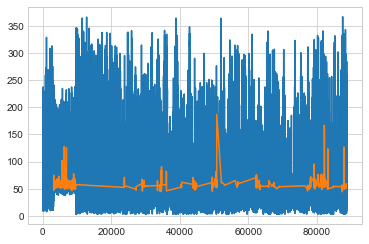

In [446]:
ee.ending_ele.plot()
eee.ending_ele.plot()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

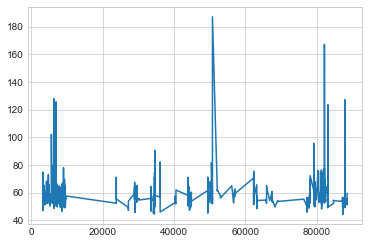

In [447]:
eee.ending_ele.plot()

In [448]:
s=pd.concat([ss,sss])
s=s.drop(["geometry"],axis=1)
s.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,start_lon,start_lat,starting_ele
0,4440967.0,-122.905107,45.537656,65.531769
1,4443830.0,-122.891702,45.532319,54.338253
2,4490031.0,-122.792771,45.522513,81.901581
3,4490031.0,-122.791786,45.520748,83.271347
4,4490043.0,-122.889663,45.529642,56.515728


In [449]:
e=pd.concat([ee,eee])
e=e.drop(["geometry"],axis=1)
e.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,end_lon,end_lat,ending_ele
0,4440967.0,-122.904773,45.537497,65.228989
1,4443830.0,-122.891710,45.532013,54.599159
2,4490031.0,-122.791853,45.520858,83.188705
3,4490031.0,-122.791376,45.519747,80.504646
4,4490043.0,-122.889647,45.530324,55.861305


In [450]:
strava_slope_new.shape,s.shape,e.shape

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


((88871, 12), (88871, 4), (88871, 4))

In [451]:
%%time
from functools import reduce
strava_all=[s,e,strava_slope_new]

strava_all1= reduce(lambda  left,right: pd.merge(left,right,on=['OSM_ID'],
                                            how='outer'), strava_all).fillna('0')
strava_all1["slope"]=abs((strava_all1['starting_ele']-strava_all1['ending_ele'])/strava_all1['length'])*100
strava_all1=strava_all1.drop_duplicates(subset=['ID'], keep='first')
strava_all1.head()

Wall time: 4.08 s


,OSM_ID,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,ID,OSM_NAME,CLAZZ,KM,year,aadb_s,aadb_s_com,length,geometry,starting point,ending point,slope
0,4440967.0,-122.905107,45.537656,65.531769,-122.904773,45.537497,65.228989,8.0,Northeast Butler Street,31.0,0.031403,2019,1.767123,1.191781,31.456401,"LINESTRING (-122.90511 45.53766, -122.90477 45...",POINT (-122.9051071032779 45.53765552980075),POINT (-122.9047733044891 45.53749712933061),0.962539
1,4443830.0,-122.891702,45.532319,54.338253,-122.891710,45.532013,54.599159,10.0,Northeast 85th Avenue,32.0,0.034098,2019,0.013699,0.000000,34.078730,"LINESTRING (-122.89170 45.53232, -122.89171 45...",POINT (-122.8917022451145 45.53231930779811),POINT (-122.8917100470238 45.53201270841168),0.765598
2,4490031.0,-122.792771,45.522513,81.901581,-122.791853,45.520858,83.188705,18.0,Northwest Cedar Hills Boulevard,21.0,0.198173,2019,2.383562,1.164384,198.152425,"LINESTRING (-122.79277 45.52251, -122.79274 45...",POINT (-122.7927711619811 45.52251286761185),POINT (-122.7918528720279 45.52085786615329),0.649563
3,4490031.0,-122.792771,45.522513,81.901581,-122.791853,45.520858,83.188705,20.0,Northwest Cedar Hills Boulevard,21.0,0.116912,2019,2.369863,1.164384,116.881836,"LINESTRING (-122.79179 45.52075, -122.79161 45...",POINT (-122.7917855726958 45.52074836603802),POINT (-122.7913764786866 45.519746965523),1.101219
10,4490043.0,-122.889663,45.529642,56.515728,-122.889647,45.530324,55.861305,26.0,Northeast 87th Avenue,32.0,0.075945,2019,0.013699,0.000000,75.902503,"LINESTRING (-122.88966 45.52964, -122.88965 45...",POINT (-122.8896631630485 45.5296415078439),POINT (-122.8896473588017 45.53032440649985),0.862189


In [452]:
strava_all1.shape

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(88871, 19)

<AxesSubplot:>

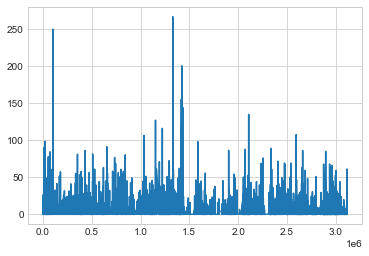

In [453]:
strava_all1.slope.plot()

In [454]:
print(strava_all1.crs)
strava_all2=strava_all1.copy()

epsg:4269


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [455]:
# set the co-ordinate system first
strava_all2 = strava_all2.set_crs("EPSG:4269")

# Reproject the geometries by replacing the values with projected ones
strava_all2_slope = strava_all2.to_crs(epsg=2838)
strava_all2_slope.head(10)

,OSM_ID,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,ID,OSM_NAME,CLAZZ,KM,year,aadb_s,aadb_s_com,length,geometry,starting point,ending point,slope
0,4440967.0,-122.905107,45.537656,65.531769,-122.904773,45.537497,65.228989,8.0,Northeast Butler Street,31.0,0.031403,2019,1.767123,1.191781,31.456401,"LINESTRING (2312190.529 210704.118, 2312216.06...",POINT (-122.9051071032779 45.53765552980075),POINT (-122.9047733044891 45.53749712933061),0.962539
1,4443830.0,-122.891702,45.532319,54.338253,-122.891710,45.532013,54.599159,10.0,Northeast 85th Avenue,32.0,0.034098,2019,0.013699,0.000000,34.078730,"LINESTRING (2313219.428 210080.276, 2313217.81...",POINT (-122.8917022451145 45.53231930779811),POINT (-122.8917100470238 45.53201270841168),0.765598
2,4490031.0,-122.792771,45.522513,81.901581,-122.791853,45.520858,83.188705,18.0,Northwest Cedar Hills Boulevard,21.0,0.198173,2019,2.383562,1.164384,198.152425,"LINESTRING (2320912.445 208766.937, 2320914.40...",POINT (-122.7927711619811 45.52251286761185),POINT (-122.7918528720279 45.52085786615329),0.649563
3,4490031.0,-122.792771,45.522513,81.901581,-122.791853,45.520858,83.188705,20.0,Northwest Cedar Hills Boulevard,21.0,0.116912,2019,2.369863,1.164384,116.881836,"LINESTRING (2320983.848 208568.739, 2320996.79...",POINT (-122.7917855726958 45.52074836603802),POINT (-122.7913764786866 45.519746965523),1.101219
10,4490043.0,-122.889663,45.529642,56.515728,-122.889647,45.530324,55.861305,26.0,Northeast 87th Avenue,32.0,0.075945,2019,0.013699,0.000000,75.902503,"LINESTRING (2313369.825 209778.103, 2313373.30...",POINT (-122.8896631630485 45.5296415078439),POINT (-122.8896473588017 45.53032440649985),0.862189
11,4493251.0,-122.889449,45.536385,52.078636,-122.889666,45.536082,53.249783,30.0,Northeast Sheffield Avenue,32.0,0.037724,2019,0.013699,0.000000,37.727623,"LINESTRING (2313408.681 210526.761, 2313403.24...",POINT (-122.8894493211495 45.53638549444339),POINT (-122.8896659229041 45.53608209554926),3.104215
12,4493251.0,-122.889449,45.536385,52.078636,-122.889666,45.536082,53.249783,31.0,Northeast Sheffield Avenue,32.0,0.110734,2019,0.013699,0.000000,110.751650,"LINESTRING (2313390.774 210493.558, 2313385.07...",POINT (-122.8896659229041 45.53608209554926),POINT (-122.8902673279837 45.53520689869214),1.057453
19,4493256.0,-122.835697,45.506297,55.604343,-122.836391,45.505190,57.596951,34.0,Southwest 153rd Drive,31.0,0.134936,2019,3.958904,2.849315,134.934141,"LINESTRING (2317508.365 207061.604, 2317504.27...",POINT (-122.8356969346625 45.50629689907753),POINT (-122.8363910409373 45.50519040235721),1.476726
20,4493490.0,-122.900225,45.537937,66.983635,-122.899611,45.537868,66.320793,35.0,Northeast Walker Road,31.0,0.048515,2019,2.178082,1.547945,48.646059,"LINESTRING (2312572.593 210724.039, 2312582.42...",POINT (-122.9002248046144 45.53793691744257),POINT (-122.8996110054402 45.53786771610551),1.362581
21,4493490.0,-122.900225,45.537937,66.983635,-122.899611,45.537868,66.320793,36.0,Northeast Walker Road,31.0,0.025857,2019,1.876712,1.301370,25.924766,"LINESTRING (2312620.281 210714.928, 2312645.54...",POINT (-122.8996110054402 45.53786771610551),POINT (-122.8992854059327 45.53782231541356),2.556790


In [456]:
inter_road.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['site_id', 'site_name', 'sensor_type', 'year', 'region',
       'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb', 'stl_raw',
       'latitude', 'longitude', 'comment', 'osm_id_sensor', 'osm_id', 'name',
       'ref', 'type', 'oneway', 'bridge', 'maxspeed', 'geometry', 'Length'],
      dtype='object')

In [457]:
%%time
#Identify the OSM ID link that have bridge

inter_road_bridge=pd.merge (left=ecoshort, right=bridge_only, left_on='osm_id_sensor', right_on='osm_id',how='inner')
inter_road_bridge=inter_road_bridge.loc[:,["osm_id_sensor", "bridge"]]
#inter_road_bridge=inter_road_bridge.drop_duplicates(subset='osm_id_1')
#inter_road_bridge = inter_road_bridge[inter_road_bridge['bridge'] > 0]
inter_road_bridge.head()

Wall time: 101 ms


,osm_id_sensor,bridge
0,681301893.0,1
1,689032191.0,1
2,322079535.0,0
3,348027806.0,1
4,126306263.0,1


In [458]:
%%time
# Now clip with buffer for each location
buffer_clip_slope = gpd.clip(strava_all2_slope, gdf1)
#buffer_clip_slope=buffer_clip_slope.drop(["osm_id"],axis=1)
buffer_clip_slope1=gpd.sjoin(buffer_clip_slope,gdf1,op='intersects') 
buffer_clip_slope1.head(5)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Wall time: 14.6 s


,OSM_ID,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,ID,OSM_NAME,CLAZZ,...,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor
0,4440967.0,-122.905107,45.537656,65.531769,-122.904773,45.537497,65.228989,8.0,Northeast Butler Street,31.0,...,Portland,3.0,48.797782,2.849315,1.027397,440.0,45.538563,-122.890841,NaN,449154502.0
1,4443830.0,-122.891702,45.532319,54.338253,-122.891710,45.532013,54.599159,10.0,Northeast 85th Avenue,32.0,...,Portland,3.0,48.797782,2.849315,1.027397,440.0,45.538563,-122.890841,NaN,449154502.0
10,4490043.0,-122.889663,45.529642,56.515728,-122.889647,45.530324,55.861305,26.0,Northeast 87th Avenue,32.0,...,Portland,3.0,48.797782,2.849315,1.027397,440.0,45.538563,-122.890841,NaN,449154502.0
11,4493251.0,-122.889449,45.536385,52.078636,-122.889666,45.536082,53.249783,30.0,Northeast Sheffield Avenue,32.0,...,Portland,3.0,48.797782,2.849315,1.027397,440.0,45.538563,-122.890841,NaN,449154502.0
12,4493251.0,-122.889449,45.536385,52.078636,-122.889666,45.536082,53.249783,31.0,Northeast Sheffield Avenue,32.0,...,Portland,3.0,48.797782,2.849315,1.027397,440.0,45.538563,-122.890841,NaN,449154502.0


In [459]:
%%time
#Make all link having bridge  slope is zero
buffer_clip_slope2=pd.merge(inter_road_bridge,buffer_clip_slope1, right_on='osm_id_sensor', left_on='osm_id_sensor',how='inner')
buffer_clip_slope2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Wall time: 295 ms


,osm_id_sensor,bridge,OSM_ID,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,ID,...,year_right,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment
0,681301893.0,1,5509189.0,-122.687910,45.510224,53.622978,-122.682919,45.506730,45.700020,311018.0,...,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN
1,681301893.0,1,5509543.0,-122.674145,45.514071,11.111911,-122.674466,45.514313,15.603313,311697.0,...,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN
2,681301893.0,1,5509601.0,-122.662755,45.516526,11.885688,-122.661437,45.516322,17.901251,311763.0,...,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN
3,681301893.0,1,5509842.0,-122.679881,45.505526,42.566216,-122.677243,45.505220,29.863901,312230.0,...,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN
4,681301893.0,1,5509989.0,-122.665707,45.522343,11.712902,-122.666048,45.521308,11.202506,312492.0,...,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

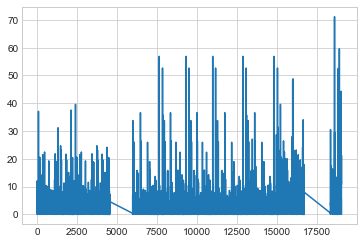

In [460]:
# Separate bridge and non bridge data
bridge_presence=buffer_clip_slope2.loc[buffer_clip_slope2.bridge ==1] 
bridge_presence.slope.plot()


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


<AxesSubplot:>

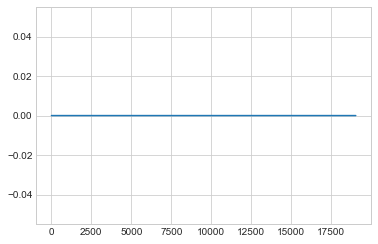

In [461]:
bridge_presence['slope']=0
bridge_presence.slope.plot()

In [462]:
bridge_absence=buffer_clip_slope2.loc[buffer_clip_slope2.bridge==0] 
bridge_absence.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge,OSM_ID,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,ID,...,year_right,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment
4570,322079535.0,0,5509189.0,-122.687910,45.510224,53.622978,-122.682919,45.506730,45.700020,311018.0,...,2019,Portland,1.0,1346.26131,98.109589,59.917808,5466.0,45.50134,-122.67197,NaN
4571,322079535.0,0,5509671.0,-122.660041,45.499671,33.835625,-122.660395,45.500803,28.104441,311896.0,...,2019,Portland,1.0,1346.26131,98.109589,59.917808,5466.0,45.50134,-122.67197,NaN
4572,322079535.0,0,5509842.0,-122.679881,45.505526,42.566216,-122.677243,45.505220,29.863901,312230.0,...,2019,Portland,1.0,1346.26131,98.109589,59.917808,5466.0,45.50134,-122.67197,NaN
4573,322079535.0,0,5509853.0,-122.674231,45.501662,25.661457,-122.673802,45.498452,26.439039,312263.0,...,2019,Portland,1.0,1346.26131,98.109589,59.917808,5466.0,45.50134,-122.67197,NaN
4574,322079535.0,0,5510421.0,-122.677426,45.505762,35.804897,-122.677559,45.506201,35.010853,313286.0,...,2019,Portland,1.0,1346.26131,98.109589,59.917808,5466.0,45.50134,-122.67197,NaN


In [463]:
# now join again
buffer_clip_slope3=pd.concat([bridge_presence,bridge_absence])
# put the cap for the slope as maximum 25%
buffer_clip_slope3=buffer_clip_slope3[buffer_clip_slope3['slope']<25]
buffer_clip_slope3.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge,OSM_ID,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,ID,...,year_right,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment
0,681301893.0,1,5509189.0,-122.687910,45.510224,53.622978,-122.682919,45.506730,45.700020,311018.0,...,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN
1,681301893.0,1,5509543.0,-122.674145,45.514071,11.111911,-122.674466,45.514313,15.603313,311697.0,...,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN
2,681301893.0,1,5509601.0,-122.662755,45.516526,11.885688,-122.661437,45.516322,17.901251,311763.0,...,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN
3,681301893.0,1,5509842.0,-122.679881,45.505526,42.566216,-122.677243,45.505220,29.863901,312230.0,...,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN
4,681301893.0,1,5509989.0,-122.665707,45.522343,11.712902,-122.666048,45.521308,11.202506,312492.0,...,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

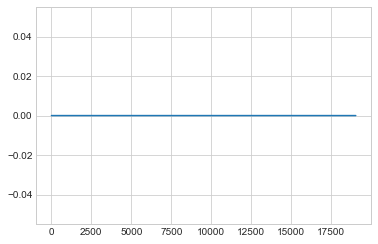

In [464]:
check=buffer_clip_slope3[buffer_clip_slope3['bridge']== 1]
check.slope.plot()

In [465]:
# Now calculate the mean slope for each count location
output_slope=buffer_clip_slope3.groupby(by=['osm_id_sensor'])['slope'].mean().reset_index()
output_slope.columns=['osm_id','slope']
output_slope.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,slope
0,5516558.0,1.239583
1,5522164.0,3.041951
2,5527017.0,1.539848
3,5528173.0,1.795533
4,5529700.0,1.018243


In [466]:
output_slope.max()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osm_id    7.389672e+08
slope     4.184054e+00
dtype: float64

# Import Weather Daily level data from weather underground website Using python coding

1. https://www.shanelynn.ie/analysis-of-weather-data-using-pandas-python-and-seaborn/
2. https://bojanstavrikj.github.io/content/page1/wunderground_scraper

In [467]:
#!pip install beautifulsoup4
#!pip install -U selenium
#!pip install webdriver-manager
#!pip install chromedriver 
#!pip3 install webdrivermanager


In [468]:
from bs4 import BeautifulSoup as BS #conda install -c anaconda beautifulsoup4 
from selenium import webdriver
from functools import reduce
import pandas as pd
import time

In [469]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager
from os import system as System
from webdriver_manager.utils import ChromeType
#from selenium.webdriver.common.desired_capabilities import DesiredCapabilities

In [470]:
    def render_page(url):
        options = Options()
        options.add_argument("user-data-dir=C:\\Users\\mxm5116\\Desktop\\Profile 1")
        driver = webdriver.Chrome(executable_path=r'C:/Program Files/Google/Chrome/Application/chromedriver_win32/chromedriver.exe', chrome_options=options)
        driver.get(url)
        time.sleep(3)
        r = driver.page_source
        driver.quit()
        return r  

In [471]:
# driver =webdriver.Chrome(r'C:\Users\mxm5116\Downloads\chromedriver_win32\chromedriver.exe')
# driver = webdriver.Firefox(executable_path=r'C:\Users\mxm5116\Downloads\geckodriver-v0.29.0-win64\geckodriver.exe')
#chrome_options = Options()
# chrome_options.add_argument('--headless')
#chrome_options.add_argument('--no-sandbox')
# chrome_options.add_argument('--disable-dev-shm-usage')
#driver = webdriver.Chrome(chrome_options=chrome_options, executable_path=r'C:\Users\mxm5116\Downloads\chromedriver_win32\chromedriver.exe')

#driver.get(r'https://www.google.com')
#time.sleep(5)
#r = driver.page_source
#print(r)

In [472]:
#def render_page(url):
#        chrome_options = Options()
#        chrome_options.add_argument('--headless')
#        chrome_options.add_argument('--no-sandbox')
#        chrome_options.add_argument('--disable-dev-shm-usage')
#        driver = webdriver.Chrome("executable_path=r"C:/Users/mxm5116/Downloads/chromedriver_win32/chromedriver.exe")
#        driver.get(url)
#        time.sleep(3)
#        r = driver.page_source
#        driver.quit()
#       return r

In [473]:
  def scraper(page, dates):
        output = pd.DataFrame()

        for d in dates:

            url = str(str(page) + str(d))
            print(url)

            r = render_page(url)
            print(r)
            soup = BS(r, "html.parser")
            container = soup.find('lib-city-history-observation')
            check = container.find('tbody')

            data = []

            for c in check.find_all('tr', class_='ng-star-inserted'):
                for i in c.find_all('td', class_='ng-star-inserted'):
                    trial = i.text
                    trial = trial.strip('  ')
                    data.append(trial)

            if round(len(data) / 17 - 1) == 31:
                Temperature = pd.DataFrame([data[32:128][x:x + 3] for x in range(0, len(data[32:128]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[128:224][x:x + 3] for x in range(0, len(data[128:224]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[224:320][x:x + 3] for x in range(0, len(data[224:320]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[320:416][x:x + 3] for x in range(0, len(data[320:416]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[416:512][x:x + 3] for x in range(0, len(data[416:512]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:32][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[512:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 28:
                Temperature = pd.DataFrame([data[29:116][x:x + 3] for x in range(0, len(data[29:116]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[116:203][x:x + 3] for x in range(0, len(data[116:203]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[203:290][x:x + 3] for x in range(0, len(data[203:290]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[290:377][x:x + 3] for x in range(0, len(data[290:377]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[377:464][x:x + 3] for x in range(0, len(data[377:463]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:29][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[464:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 29:
                Temperature = pd.DataFrame([data[30:120][x:x + 3] for x in range(0, len(data[30:120]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[120:210][x:x + 3] for x in range(0, len(data[120:210]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[210:300][x:x + 3] for x in range(0, len(data[210:300]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[300:390][x:x + 3] for x in range(0, len(data[300:390]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[390:480][x:x + 3] for x in range(0, len(data[390:480]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:30][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[480:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 30:
                Temperature = pd.DataFrame([data[31:124][x:x + 3] for x in range(0, len(data[31:124]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[124:217][x:x + 3] for x in range(0, len(data[124:217]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[217:310][x:x + 3] for x in range(0, len(data[217:310]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[310:403][x:x + 3] for x in range(0, len(data[310:403]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[403:496][x:x + 3] for x in range(0, len(data[403:496]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:31][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[496:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            else:
                print('Data not in normal length')

            dfs = [Date, Temperature, Dew_Point, Humidity, Wind, Pressure, Precipitation]

            df_final = reduce(lambda left, right: pd.merge(left, right, left_index=True, right_index=True), dfs)

            df_final['Date'] = str(d) + "-" + df_final.iloc[:, :1].astype(str)

            output = output.append(df_final)

        print('Scraper done!')

        output = output[['Temp_avg', 'Temp_min', 'Dew_max', 'Dew_avg', 'Dew_min', 'Hum_max',
                         'Hum_avg', 'Hum_min', 'Wind_max', 'Wind_avg', 'Wind_min', 'Pres_max',
                         'Pres_avg', 'Pres_min', 'Precipitation', 'Date']]

        return output


# Please input the date and page link to extract the data for your study area here

In [474]:
dates = ['2019-1','2019-2','2019-3','2019-4','2019-5','2019-6','2019-7','2019-8','2019-9','2019-10','2019-11','2019-12']
# insert the date you want to extract the data
page = 'https://www.wunderground.com/history/monthly/us/or/portland/KPDX/date/'
# insert your study location link here
#df_output = scraper(page,dates)

In [475]:
w19=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/portland_weather.csv")
w19

,Temp_avg,Temp_min,Dew_max,Dew_avg,Dew_min,Hum_max,Hum_avg,Hum_min,Wind_max,Wind_avg,Wind_min,Pres_max,Pres_avg,Pres_min,Precipitation,Date
0,33.5,30,32,30.9,28,96,90.4,65,8,3.1,0,30.4,30.4,30.3,0.00,2019-1-1
1,35.7,31,35,31.0,29,96,84.2,60,9,4.0,0,30.3,30.2,30.1,0.00,2019-1-2
2,48.4,43,44,40.1,35,86,73.5,57,20,11.7,6,30.1,30.0,29.8,0.00,2019-1-3
3,49.1,44,45,42.7,39,89,79.1,61,17,8.7,0,29.9,29.9,29.7,0.09,2019-1-4
4,43.0,38,41,38.6,35,97,85.5,66,33,4.7,0,29.7,29.5,29.2,0.00,2019-1-5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,40.8,37,40,37.5,34,93,88.3,82,12,4.5,0,30.2,30.2,30.1,0.01,2019-12-27
361,42.7,41,41,38.2,34,93,84.6,68,14,5.0,0,30.3,30.2,30.1,0.00,2019-12-28
362,42.5,40,37,33.4,31,79,70.3,63,14,8.5,0,30.2,30.1,30.0,0.00,2019-12-29
363,43.0,40,35,33.7,32,79,69.8,61,10,5.6,0,30.4,30.3,30.2,0.00,2019-12-30


In [476]:
output_weather=w19.loc[:, ['Temp_avg', 'Hum_avg','Precipitation']]
output_weather

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Temp_avg,Hum_avg,Precipitation
0,33.5,90.4,0.00
1,35.7,84.2,0.00
2,48.4,73.5,0.00
3,49.1,79.1,0.09
4,43.0,85.5,0.00
...,...,...,...
360,40.8,88.3,0.01
361,42.7,84.6,0.00
362,42.5,70.3,0.00
363,43.0,69.8,0.00


In [477]:
output_weather.dtypes

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Temp_avg         float64
Hum_avg          float64
Precipitation    float64
dtype: object

In [478]:
# Convert object to float
output_weather2=output_weather.astype(str).astype(float)

In [479]:
output_weather2.isnull().values.any()

False

In [480]:
# Take the average for annual
output_weather3=output_weather2.mean()
output_weather3

Temp_avg         54.164932
Hum_avg          69.331507
Precipitation     0.070274
dtype: float64

# Aggregate all output together in a dataframe

In [481]:
from functools import reduce
import pandas as pd
# compile the list of dataframes you want to merge
df_all = [emerging_data,output_origin,output_destination,output_odl,output_bikecom,output_lane,output_intersection_densitya,output_commercial,commercial_distance1,commercialcc_distance1,output_industrial,industrial_distance1,industrialcc_distance1, output_residential,residential_distance1,residentialcc_distance1, output_retail,retail_distance1,retailcc_distance1,output_grass,grass_distance1,grasscc_distance1,output_park,Park_distance1,parkcc_distance1,output_water,water_distance1,watercc_distance1,output_forest,forest_distance1,forestcc_distance1,CBD_distance1,output_bparking,output_bstop,output_school,output_school_distance,output_college,output_college_distance,output_university,output_university_distance,output_intersection_density1,output_primary,output_secondary,output_tertiary,output_residential,output_path,output_cycleway,output_footway,output_bikeway_all_lane,output_bikeway_all_track, pt_road_type2,output_bikeway_all_lane_binary,output_bikeway_all_track_binary,output_meanspeed,output_pointspeed,output_bridge,output_point_bridge,output_pct_race1,output_pct_gender1,output_student,output_pct_edu1,output_median_age,output_income,output_hhdensity1,output_pdensity1,output_edensity1,output_job1,output_slope]

In [482]:
#Merge by ID
df_merged_eco_short = reduce(lambda  left,right: pd.merge(left,right,on=['osm_id'],
                                            how='left'), df_all)
df_merged_eco_short=df_merged_eco_short.drop_duplicates(subset=['site_id'],keep='first')

In [483]:
#dfs = [df1, df2, df3, df4, df5] 
#from functools import partial 
#outer_merge = partial(pd.merge, how='left') 
#reduce(outer_merge, df_all )

In [484]:
# Add weather data in this new data frame
df_merged_eco_short['Temp_avg'] = pd.Series(output_weather3.Temp_avg, index=df_merged_eco_short.index)
df_merged_eco_short['Hum_avg '] = pd.Series(output_weather3.Hum_avg , index=df_merged_eco_short.index)
df_merged_eco_short['Precipitation'] = pd.Series(output_weather3.Precipitation, index=df_merged_eco_short.index)
df_merged_eco_short.head(5)

,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw,Bike Share Origin,Bike Share Destination,Bike Share Crossing,...,region,buffer_type,HH_density,population_density,employment_density,Number of jobs,slope,Temp_avg,Hum_avg,Precipitation
0,681301893.0,P001POR,permanent,1775.363690,109.219178,80.945205,9915.0,103405.0,106872.0,166741.0,...,Portland,Euclidian,4652.341700,8372.841707,8138.311962,89731.187872,0.000000,54.164932,69.331507,0.070274
1,689032191.0,P002POR,permanent,1537.211111,111.027397,74.904110,6663.0,99161.0,103268.0,161916.0,...,Portland,Euclidian,4111.548958,7423.064256,7183.998107,86226.949536,0.000000,54.164932,69.331507,0.070274
2,322079535.0,P003POR,permanent,1346.261310,98.109589,59.917808,5466.0,24751.0,24640.0,43256.0,...,Portland,Euclidian,2448.491182,4489.648514,4157.611651,31551.863631,3.349502,54.164932,69.331507,0.070274
3,348027806.0,P004POR,permanent,1951.052146,128.041096,84.410959,17323.0,85369.0,94619.0,159903.0,...,Portland,Euclidian,3840.739828,6090.127175,5847.561281,63206.918974,0.000000,54.164932,69.331507,0.070274
4,126306263.0,P005POR,permanent,1182.406584,120.712329,82.164384,8077.0,69209.0,76614.0,133228.0,...,Portland,Euclidian,4457.121361,6933.065298,6628.972325,42431.015565,0.000000,54.164932,69.331507,0.070274


In [485]:
# If you want to export the excel
pd.DataFrame.to_csv(df_merged_eco_short, 'Eco_short_Portland_data_circular_0.75_mile_buffer_2019.csv', sep=',', na_rep='0', index=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Use Keplergl to produce dynamic Map for all variables

In [486]:
# Make dynamic visualization
#!pip install keplergl

In [487]:
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon,min_dist_to_CBD
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,681301893.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1,30.0,1900.519490,1663.773880
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,689032191.0,POINT (2330377.291 207469.218),2643.824523,1766.482889,3467.043478,1,30.0,1919.730423,2131.359291
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,...,NaN,322079535.0,POINT (2330282.541 206154.710),2034.205847,632.879498,3086.233635,3,20.0,376.347778,5310.242787
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,...,NaN,348027806.0,POINT (2330647.392 209090.369),3179.337015,2134.229233,3802.769802,1,25.0,1382.627569,5432.971395
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,...,NaN,126306263.0,POINT (2330353.308 209658.073),2417.444765,2623.771633,3133.889048,4,35.0,1356.833372,6742.982602


In [488]:
ecoshort_selected=ecoshort.loc[:,["osm_id_sensor","geometry"]]
ecoshort_selected
print(ecoshort_selected.crs)

epsg:2838


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [489]:
# set the co-ordinate system first
ecoshort_selected1 = ecoshort_selected.set_crs("EPSG:2838")
# Let's take a copy of our layer
ecoshort_selected_3D = ecoshort_selected1.copy()

# Reproject the geometries by replacing the values with projected ones
ecoshort_selected_3D  = ecoshort_selected_3D .to_crs(epsg=4211) # Initially given
ecoshort_selected_3D

,osm_id_sensor,geometry
0,681301893.0,POINT (-122.67284 45.51383)
1,689032191.0,POINT (-122.67121 45.51319)
2,322079535.0,POINT (-122.67197 45.50134)
3,348027806.0,POINT (-122.66831 45.52783)
4,126306263.0,POINT (-122.67227 45.53287)
...,...,...
83,134963745.0,POINT (-122.75595 45.58837)
84,117315141.0,POINT (-122.68741 45.56211)
85,5516558.0,POINT (-122.68864 45.56466)
86,5528173.0,POINT (-122.68164 45.53223)


In [490]:
ecoshort_selected_3D['Lon'] = ecoshort_selected_3D.geometry.x
ecoshort_selected_3D['Lat'] = ecoshort_selected_3D.geometry.y
ecoshort_selected_3D=ecoshort_selected_3D.drop(['geometry'],axis=1)
ecoshort_selected_3D

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,Lon,Lat
0,681301893.0,-122.672840,45.513830
1,689032191.0,-122.671210,45.513187
2,322079535.0,-122.671970,45.501340
3,348027806.0,-122.668311,45.527835
4,126306263.0,-122.672270,45.532870
...,...,...,...
83,134963745.0,-122.755946,45.588368
84,117315141.0,-122.687407,45.562107
85,5516558.0,-122.688638,45.564658
86,5528173.0,-122.681640,45.532232


In [491]:
ecoshort_selected_3D.dtypes

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osm_id_sensor    float64
Lon              float64
Lat              float64
dtype: object

In [492]:
print(gdf1.crs)
# set the co-ordinate system first
gdf_selected1 = gdf1.set_crs("EPSG:2838")

# Reproject the geometries by replacing the values with projected ones
gdf_selected_3D  = gdf_selected1.to_crs(epsg=4211) # Initially given
gdf_selected_3D=gdf_selected_3D.loc[:,["osm_id_sensor","geometry"]]
gdf_selected_3D['geometry'] = gdf_selected_3D['geometry'].apply(shapely.geometry.shape)
gdf_selected_3D
newdf=(pd.merge(ecoshort_selected_3D, gdf_selected_3D, left_on='osm_id_sensor', right_on='osm_id_sensor', how='inner'))
buffer_vis=newdf
buffer_vis.columns=['osm_id_sensor','Lon','Lat','geometry']
buffer_vis.head()

epsg:2838


,osm_id_sensor,Lon,Lat,geometry
0,681301893.0,-122.672840,45.513830,"POLYGON ((-122.65740 45.51412, -122.65743 45.5..."
1,689032191.0,-122.671210,45.513187,"POLYGON ((-122.65577 45.51348, -122.65580 45.5..."
2,322079535.0,-122.671970,45.501340,"POLYGON ((-122.65653 45.50163, -122.65656 45.5..."
3,348027806.0,-122.668311,45.527835,"POLYGON ((-122.65286 45.52812, -122.65290 45.5..."
4,126306263.0,-122.672270,45.532870,"POLYGON ((-122.65682 45.53316, -122.65686 45.5..."


In [493]:
# Make a copy of our data frame to visualize it
df_dynamic=df_merged_eco_short.copy()
#cols = df_dynamic.columns
#df_dynamic[cols[1:]] = df_dynamic[cols[1:]].astype(str).astype(float)
#df_dynamic
# Bring the buffer geometry
df_dynamic1=(pd.merge(df_dynamic, buffer_vis, left_on='osm_id', right_on='osm_id_sensor', how='inner'))
df_dynamic1
pd.DataFrame.to_csv(df_dynamic1, 'keplergl_eco_short_portland2019_circular_0.75_mile_buffer.csv', sep=',', na_rep='0', index=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

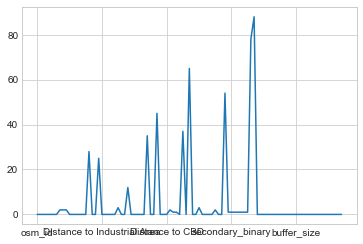

In [494]:
df_dynamic1.isnull().sum().plot()


In [495]:
# We do not have any null point. lets plot the map
# Load an empty map
from keplergl import KeplerGl
map_1 = KeplerGl()
map_1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl()

In [496]:
#cols = df_dynamic1.columns
#df_dynamic1[cols[1:]] = df_dynamic1[cols[1:]].astype(str).astype(float)
#df_dynamic1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [497]:
#from shapely import wkt
#df_dynamic1['str_geom'] = df_dynamic1.geometry.apply(lambda x: wkt.dumps(x))
#df_dynamic1=df_dynamic1.drop(['geometry'],axis=1)
#df_dynamic1
#df_dynamic1.rename(columns={'str_geom':'geometry'}, inplace=True)
#df_dynamic1

In [498]:
#df_dynamic1.dtypes

In [499]:
#df_dynamic2=df_dynamic1.drop(["geometry"],axis=1)
#df_dynamic3=df_dynamic1.copy()
#df_dynamic3['geometry'] = df_dynamic3['geometry'].apply(shapely.geometry.shape)
#df_dynamic3

In [500]:
# Load a map with data and config and height
from keplergl import KeplerGl
data=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/keplergl_eco_short_portland2019_circular_0.75_mile_buffer.csv")
data=data.fillna(0)
map_2 = KeplerGl(height=500, data={"data_1":data})
map_2

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'data_1':          osm_id  site_id sensor_type        AADBT     stv_adb  stv_c_adb  \
0   68130…

In [501]:
data.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw,Bike Share Origin,Bike Share Destination,Bike Share Crossing,...,employment_density,Number of jobs,slope,Temp_avg,Hum_avg,Precipitation,osm_id_sensor,Lon,Lat,geometry
0,681301893.0,P001POR,permanent,1775.363690,109.219178,80.945205,9915.0,103405.0,106872.0,166741.0,...,8138.311962,89731.187872,0.000000,54.164932,69.331507,0.070274,681301893.0,-122.672840,45.513830,"POLYGON ((-122.6573972100289 45.5141210300188,..."
1,689032191.0,P002POR,permanent,1537.211111,111.027397,74.904110,6663.0,99161.0,103268.0,161916.0,...,7183.998107,86226.949536,0.000000,54.164932,69.331507,0.070274,689032191.0,-122.671210,45.513187,POLYGON ((-122.6557673765264 45.51347781103424...
2,322079535.0,P003POR,permanent,1346.261310,98.109589,59.917808,5466.0,24751.0,24640.0,43256.0,...,4157.611651,31551.863631,3.349502,54.164932,69.331507,0.070274,322079535.0,-122.671970,45.501340,POLYGON ((-122.6565306006046 45.50163091434531...
3,348027806.0,P004POR,permanent,1951.052146,128.041096,84.410959,17323.0,85369.0,94619.0,159903.0,...,5847.561281,63206.918974,0.000000,54.164932,69.331507,0.070274,348027806.0,-122.668311,45.527835,POLYGON ((-122.6528644784283 45.52812499999139...
4,126306263.0,P005POR,permanent,1182.406584,120.712329,82.164384,8077.0,69209.0,76614.0,133228.0,...,6628.972325,42431.015565,0.000000,54.164932,69.331507,0.070274,126306263.0,-122.672270,45.532870,POLYGON ((-122.6568220287933 45.53316095149838...


In [502]:
# save as htm file
map_2.save_to_html(file_name="Portland_keplergl_circular_0.75_mile_buffer19.html")

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Map saved to Portland_keplergl_circular_0.75_mile_buffer19.html!


In [503]:
#conda list ipython

In [504]:
end = time.time()
print("Total Run Time:", end - start)

Total Run Time: 2105.1121158599854


# Keplergl Dynamic map is done----END

# Run Random Forest to filter the variables

# Run Negative Binomial Model to predict the AADBT